In [1]:
import h5py
import os
import numpy as np
import tqdm
import modisco

In [2]:

#Written by Alex
def import_shap_scores(
    shap_scores_hdf5, hyp_score_key, center_cut_size=None, chrom_set=None,
    remove_non_acgt=True
):
    """
    Imports the SHAP scores generated/saved by `make_shap_scores.py`, and
    returns the hypothetical importance scores, actual importance scores, and
    one-hot encoded sequences.
    Arguments:
        `shap_scores_hdf5`: path to HDF5 of SHAP scores generated by
            `make_shap_scores.py`
        `hyp_score_key`: the key that specifies hypothetical importance scores
            in `shap_scores_hdf5`
        `center_cut_size`: if specified, keeps only scores/sequences of this
            centered length; by default uses the entire length given in the
            SHAP scores
        `chrom_set`: list of chromosomes to restrict to; if None, use all
            chromosomes available in the SHAP scores
        `remove_non_acgt`: if True, remove any sequences (after being cut down
            to size) which have a base other than ACGT (e.g. N)
    Returns the hypothetical importance scores, actual importance scores,
    corresponding one-hot encoded input sequences, and coordinates. The first
    three are N x L x 4 arrays, and the last is an N x 3 object array.
    where L is the cut size (or default size).
    """
    score_reader = h5py.File(shap_scores_hdf5, "r")

    # For defining shapes
    num_seqs, input_length, _ = score_reader[hyp_score_key].shape
    if not center_cut_size:
        center_cut_size = input_length
    cut_start = (input_length // 2) - (center_cut_size // 2)
    cut_end = cut_start + center_cut_size

    # For batching up data loading
    batch_size = min(1000, num_seqs)
    num_batches = int(np.ceil(num_seqs / batch_size))

    # Read in hypothetical scores and input sequences in batches
    hyp_scores = np.empty((num_seqs, center_cut_size, 4))
    act_scores = np.empty((num_seqs, center_cut_size, 4))
    one_hot_seqs = np.empty((num_seqs, center_cut_size, 4))
    coords = np.empty((num_seqs, 3), dtype=object)

    for i in tqdm.trange(num_batches, desc="Importing SHAP scores"):
        batch_slice = slice(i * batch_size, (i + 1) * batch_size)
        hyp_score_batch = score_reader[hyp_score_key][
            batch_slice, cut_start:cut_end
        ]
        one_hot_seq_batch = score_reader["input_seqs"][
            batch_slice, cut_start:cut_end
        ]
        chrom_batch = score_reader["coords_chrom"][batch_slice].astype(str)
        start_batch = score_reader["coords_start"][batch_slice]
        end_batch = score_reader["coords_end"][batch_slice]
        hyp_scores[batch_slice] = hyp_score_batch
        one_hot_seqs[batch_slice] = one_hot_seq_batch
        act_scores[batch_slice] = hyp_score_batch * one_hot_seq_batch
        coords[batch_slice, 0] = chrom_batch
        coords[batch_slice, 1] = start_batch
        coords[batch_slice, 2] = end_batch

    score_reader.close()

    if chrom_set:
        mask = np.isin(coords[:, 0], chrom_set)
        hyp_scores, act_scores, one_hot_seqs, coords = \
            hyp_scores[mask], act_scores[mask], one_hot_seqs[mask], coords[mask]

    if remove_non_acgt:
        # Remove any examples in which the input sequence is not all ACGT
        mask = np.sum(one_hot_seqs, axis=(1, 2)) == center_cut_size
        hyp_scores, act_scores, one_hot_seqs, coords = \
            hyp_scores[mask], act_scores[mask], one_hot_seqs[mask], coords[mask]

    return hyp_scores, act_scores, one_hot_seqs, coords

#Written by Alex
def import_tfmodisco_results(
    tfm_results_path, hyp_scores, act_scores, one_hot_seqs
):
    """
    Imports the TF-MoDISco results object.
    Arguments:
        `tfm_results_path`: path to HDF5 containing TF-MoDISco results
        `hyp_scores`: hypothetical importance scores used for this run, an
            N x L x 4 array
        `act_scores`: actual importance scores used for this run, an N x L x 4
            array
        `one_hot_seqs`: input sequences used for this run, an N x L x 4 array
    Note that L must be the exact size of sequence that TF-MoDISco was run on,
    and the N sequences must be in the same order.
    """
    assert hyp_scores.shape == one_hot_seqs.shape
    assert act_scores.shape == one_hot_seqs.shape
    
    track_set = modisco.tfmodisco_workflow.workflow.prep_track_set(
        task_names=["task0"],
        contrib_scores={"task0": act_scores},
        hypothetical_contribs={"task0": hyp_scores},
        one_hot=one_hot_seqs
    )
    
    with h5py.File(tfm_results_path,"r") as f:
        return modisco.tfmodisco_workflow.workflow.TfModiscoResults.from_hdf5(f, track_set=track_set)

In [3]:
center_cut_size = 400
   
# Define paths and which set of scores we want (profile or count)
shap_scores_path = "E2F6_scores.h5"
hyp_score_key = "profile_hyp_scores"
tfm_results_path = "E2F6_profile_tfm.h5"

# Import the DeepSHAP scores and input sequences
hyp_scores, act_scores, one_hot_seqs, coords = import_shap_scores(
    shap_scores_path, hyp_score_key, center_cut_size=center_cut_size,
    remove_non_acgt=True
)

# Import the TF-MoDISco results
tfm_results = import_tfmodisco_results(
    tfm_results_path, hyp_scores, act_scores, one_hot_seqs
)

Importing SHAP scores: 100%|██████████| 33/33 [00:06<00:00,  5.24it/s]


In [4]:
contrib_scores = act_scores
onehot_data = one_hot_seqs

idx 0 num seqlets: 5156


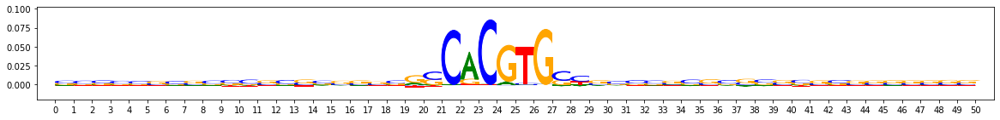

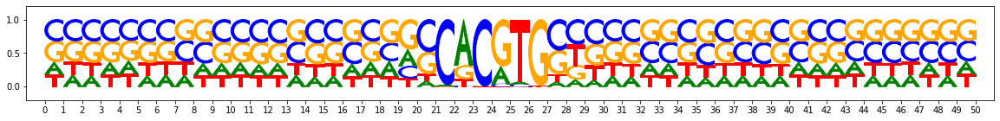

idx 1 num seqlets: 3245


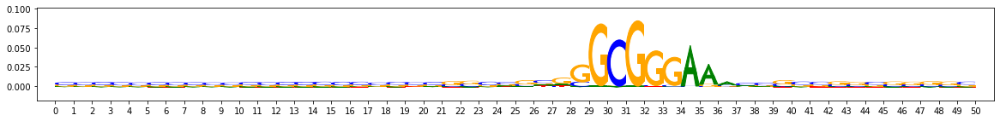

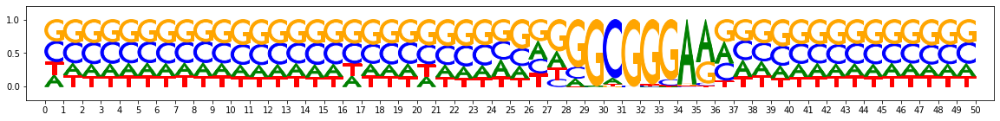

idx 2 num seqlets: 1267


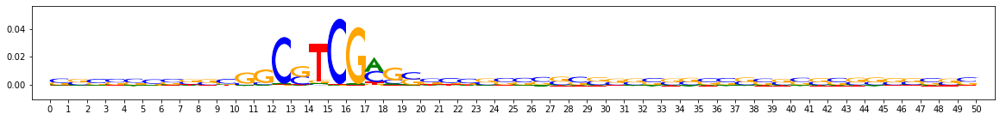

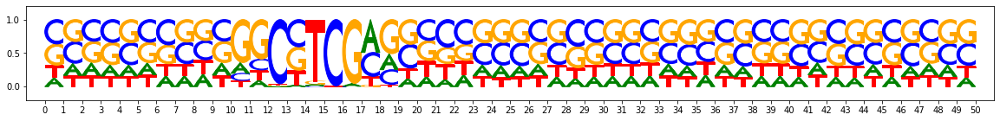

idx 3 num seqlets: 1266


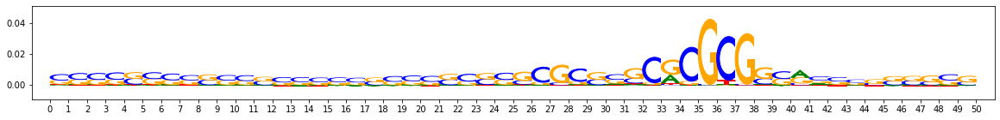

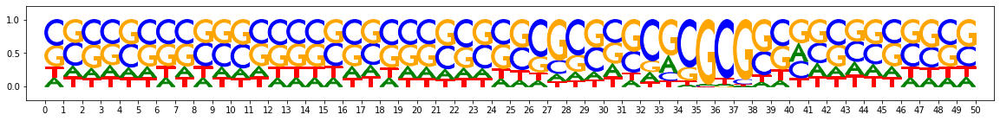

idx 4 num seqlets: 602


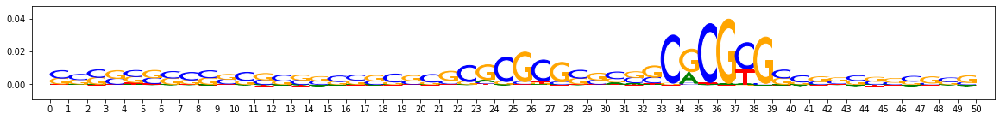

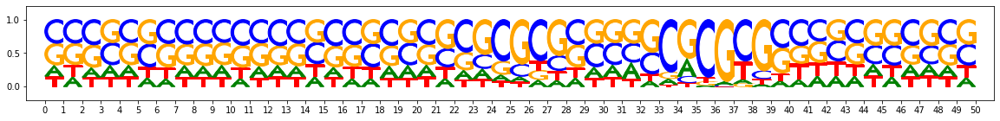

idx 5 num seqlets: 338


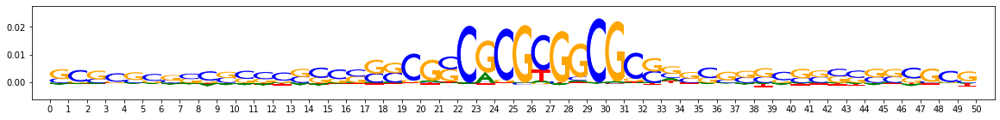

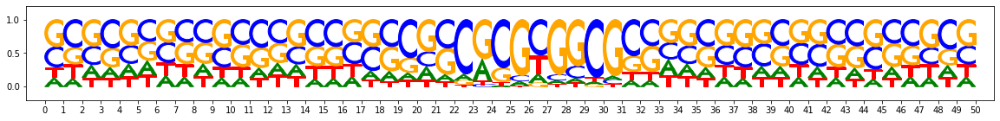

idx 6 num seqlets: 311


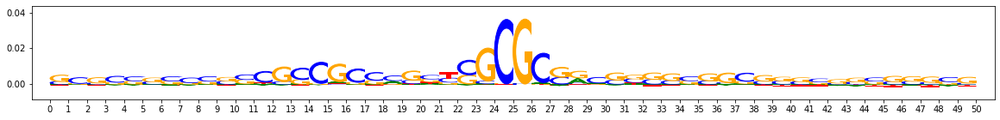

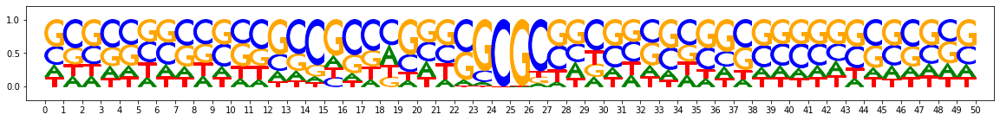

idx 7 num seqlets: 258


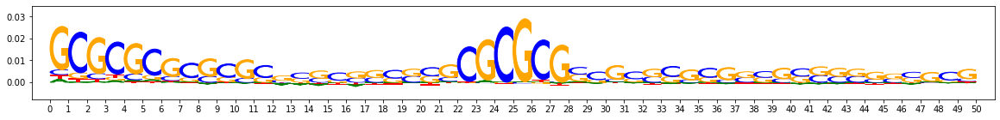

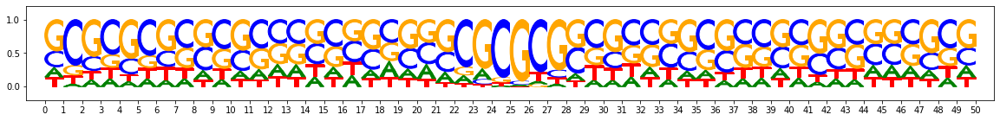

idx 8 num seqlets: 73


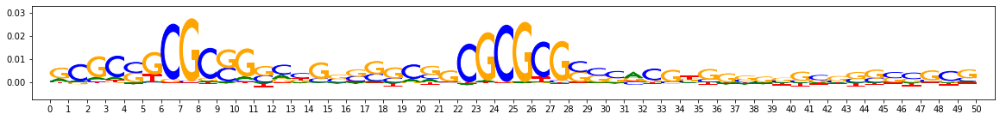

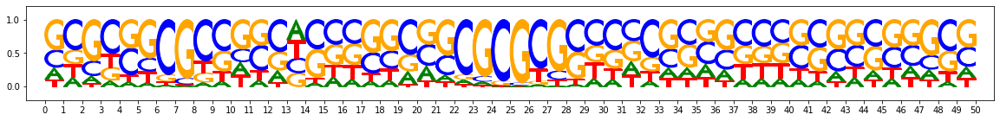

idx 9 num seqlets: 71


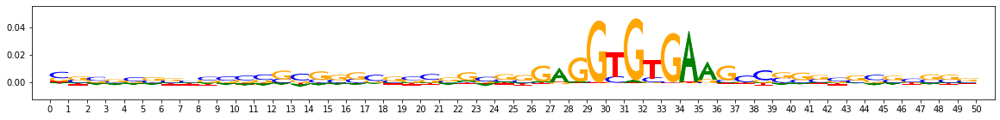

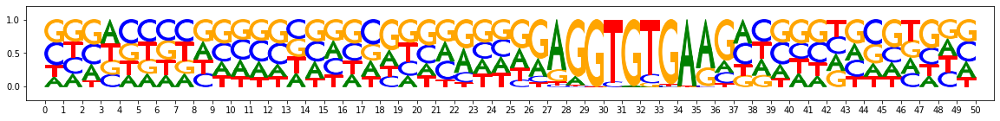

idx 10 num seqlets: 69


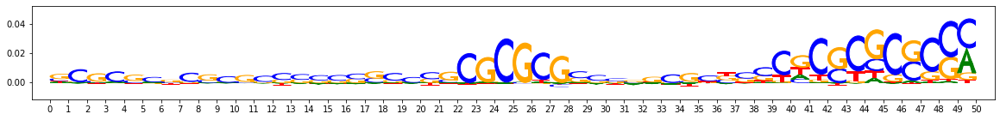

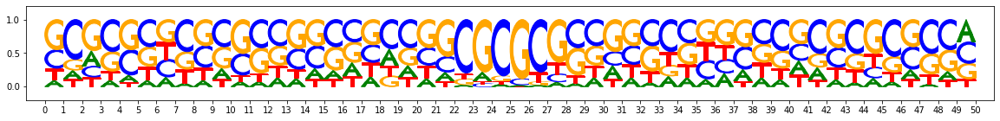

idx 11 num seqlets: 41


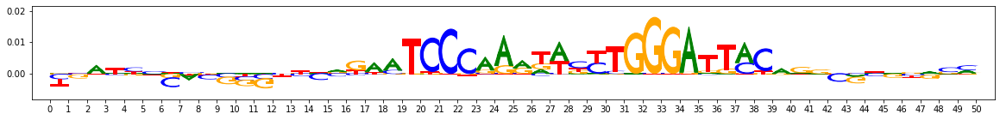

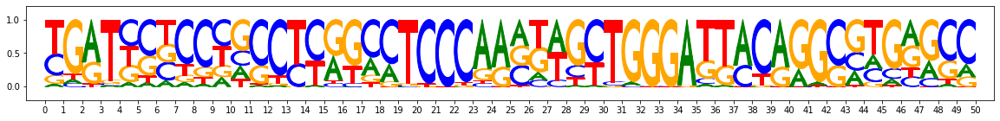

In [5]:
from modisco.visualization import viz_sequence

orig_patterns = (tfm_results.metacluster_idx_to_submetacluster_results["metacluster_0"]
                 .seqlets_to_patterns_result.patterns)

for i,pattern in enumerate(orig_patterns):
    print("idx",i,"num seqlets:",len(pattern.seqlets))
    viz_sequence.plot_weights(pattern["task0_contrib_scores"].fwd)
    viz_sequence.plot_weights(pattern["sequence"].fwd)

Getting trimmed patterns, subclustering them
Trimming the patterns to the target length
Apply subclustering


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    5.0s
[Parallel(n_jobs=10)]: Done 500 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done 1500 tasks      | elapsed:   13.7s
[Parallel(n_jobs=10)]: Done 2900 tasks      | elapsed:   21.6s
[Parallel(n_jobs=10)]: Done 4700 tasks      | elapsed:   31.7s
[Parallel(n_jobs=10)]: Done 5137 out of 5156 | elapsed:   34.3s remaining:    0.1s
[Parallel(n_jobs=10)]: Done 5156 out of 5156 | elapsed:   34.4s finished


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 5156 samples in 0.078s...
[t-SNE] Computed neighbors for 5156 samples in 0.007s...


/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computed conditional probabilities for sample 1000 / 5156
[t-SNE] Computed conditional probabilities for sample 2000 / 5156
[t-SNE] Computed conditional probabilities for sample 3000 / 5156
[t-SNE] Computed conditional probabilities for sample 4000 / 5156
[t-SNE] Computed conditional probabilities for sample 5000 / 5156
[t-SNE] Computed conditional probabilities for sample 5156 / 5156
[t-SNE] Mean sigma: 0.220877
[t-SNE] Computed conditional probabilities in 0.783s
[t-SNE] Iteration 50: error = 80.4201965, gradient norm = 0.0122151 (50 iterations in 7.226s)
[t-SNE] Iteration 100: error = 80.4204559, gradient norm = 0.0129445 (50 iterations in 7.061s)
[t-SNE] Iteration 150: error = 80.4209824, gradient norm = 0.0147953 (50 iterations in 6.500s)
[t-SNE] Iteration 200: error = 80.4198074, gradient norm = 0.0100162 (50 iterations in 7.571s)
[t-SNE] Iteration 250: error = 80.4199982, gradient norm = 0.0110697 (50 iterations in 7.539s)
[t-SNE] KL divergence after 250 iterations with 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Quality: 0.5110883766501103
Quality: 0.5145050414161283
Quality: 0.5154968857066439


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:  2.6min finished


Got subclusters: Counter({0: 1068, 1: 964, 2: 947, 3: 685, 4: 538, 5: 442, 6: 154, 7: 150, 8: 107, 9: 88, 10: 13})


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 620 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done 1620 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done 3020 tasks      | elapsed:   10.7s
[Parallel(n_jobs=10)]: Done 3245 out of 3245 | elapsed:   11.4s finished


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3245 samples in 0.039s...
[t-SNE] Computed neighbors for 3245 samples in 0.009s...


/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computed conditional probabilities for sample 1000 / 3245
[t-SNE] Computed conditional probabilities for sample 2000 / 3245
[t-SNE] Computed conditional probabilities for sample 3000 / 3245
[t-SNE] Computed conditional probabilities for sample 3245 / 3245
[t-SNE] Mean sigma: 0.223268
[t-SNE] Computed conditional probabilities in 0.503s
[t-SNE] Iteration 50: error = 74.5896988, gradient norm = 0.0598771 (50 iterations in 5.246s)
[t-SNE] Iteration 100: error = 74.5553131, gradient norm = 0.0450495 (50 iterations in 5.214s)
[t-SNE] Iteration 150: error = 74.5507278, gradient norm = 0.0395116 (50 iterations in 6.288s)
[t-SNE] Iteration 200: error = 74.5558395, gradient norm = 0.0461738 (50 iterations in 4.957s)
[t-SNE] Iteration 250: error = 74.7062836, gradient norm = 0.0586952 (50 iterations in 5.753s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.706284
[t-SNE] Iteration 300: error = 2.7920551, gradient norm = 0.0010974 (50 iterations in 3.743s)
[t-SNE] 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:  1.1min


Quality: 0.44246840705792534
Quality: 0.44342147879041743


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:  1.8min finished


Got subclusters: Counter({0: 581, 1: 557, 2: 543, 3: 532, 4: 460, 5: 311, 6: 241, 7: 20})


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1267 out of 1267 | elapsed:    1.7s finished
/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1267 samples in 0.020s...
[t-SNE] Computed neighbors for 1267 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1267
[t-SNE] Computed conditional probabilities for sample 1267 / 1267
[t-SNE] Mean sigma: 0.275411
[t-SNE] Computed conditional probabilities in 0.211s
[t-SNE] Iteration 50: error = 69.3535614, gradient norm = 0.2250447 (50 iterations in 1.074s)
[t-SNE] Iteration 100: error = 69.6195831, gradient norm = 0.2379605 (50 iterations in 1.298s)
[t-SNE] Iteration 150: error = 69.8224487, gradient norm = 0.2439908 (50 iterations in 1.082s)
[t-SNE] Iteration 200: error = 70.3123474, gradient norm = 0.2226519 (50 iterations in 1.299s)
[t-SNE] Iteration 250: error = 71.0168076, gradient norm = 0.2214939 (50 iterations in 1.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.016808
[t-SNE] Iteration 300: error = 2.0167830, gradient norm = 0.0021704 (50 iterations in 1.168s

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   20.8s


Quality: 0.41954555063227106
Quality: 0.4199781471996443
Quality: 0.42009057187410037
Quality: 0.42020265775431354
Quality: 0.4202960505090806
Quality: 0.4204181283113


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   30.5s finished


Got subclusters: Counter({0: 307, 1: 252, 2: 232, 3: 135, 4: 115, 5: 99, 6: 83, 7: 44})


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1266 out of 1266 | elapsed:    1.6s finished


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1266 samples in 0.020s...
[t-SNE] Computed neighbors for 1266 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1266


/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computed conditional probabilities for sample 1266 / 1266
[t-SNE] Mean sigma: 0.300237
[t-SNE] Computed conditional probabilities in 0.216s
[t-SNE] Iteration 50: error = 69.2188721, gradient norm = 0.2449916 (50 iterations in 1.240s)
[t-SNE] Iteration 100: error = 70.1150436, gradient norm = 0.2529019 (50 iterations in 1.368s)
[t-SNE] Iteration 150: error = 70.4684296, gradient norm = 0.2434112 (50 iterations in 1.361s)
[t-SNE] Iteration 200: error = 70.9512253, gradient norm = 0.2207089 (50 iterations in 1.222s)
[t-SNE] Iteration 250: error = 70.7550201, gradient norm = 0.2251729 (50 iterations in 1.304s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.755020
[t-SNE] Iteration 300: error = 2.0424731, gradient norm = 0.0017311 (50 iterations in 0.806s)
[t-SNE] Iteration 350: error = 1.9942672, gradient norm = 0.0004183 (50 iterations in 0.588s)
[t-SNE] Iteration 400: error = 1.9740442, gradient norm = 0.0002117 (50 iterations in 0.566s)
[t-SNE] Iteration 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   20.7s


Quality: 0.4393868708294898
Quality: 0.4406959730701351
Quality: 0.44089532523144487
Quality: 0.4411272725226557
Quality: 0.4422359840472354
Quality: 0.4433830267185967


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   31.8s finished


Got subclusters: Counter({0: 219, 1: 217, 2: 195, 3: 191, 4: 171, 5: 143, 6: 130})


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 550 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 602 out of 602 | elapsed:    0.9s finished
/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 602 samples in 0.006s...
[t-SNE] Computed neighbors for 602 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 602 / 602
[t-SNE] Mean sigma: 0.320603
[t-SNE] Computed conditional probabilities in 0.103s
[t-SNE] Iteration 50: error = 71.1619720, gradient norm = 0.4077561 (50 iterations in 0.410s)
[t-SNE] Iteration 100: error = 75.0434647, gradient norm = 0.3812278 (50 iterations in 0.632s)
[t-SNE] Iteration 150: error = 72.9748764, gradient norm = 0.4054988 (50 iterations in 0.459s)
[t-SNE] Iteration 200: error = 74.7560501, gradient norm = 0.3883408 (50 iterations in 0.672s)
[t-SNE] Iteration 250: error = 74.2307205, gradient norm = 0.3654704 (50 iterations in 0.462s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.230721
[t-SNE] Iteration 300: error = 1.6322796, gradient norm = 0.0031531 (50 iterations in 0.596s)
[t-SNE] Iteration 350: error = 1.5684478, gradient norm = 0.0008313 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   11.0s


Quality: 0.3784028726690201
Quality: 0.3787745543090666
Quality: 0.37943976862424184
Quality: 0.3804986578574839


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   17.5s finished


Got subclusters: Counter({0: 123, 1: 119, 2: 111, 3: 109, 4: 82, 5: 58})


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 338 out of 338 | elapsed:    0.4s finished
/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 338 samples in 0.004s...
[t-SNE] Computed neighbors for 338 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 338 / 338
[t-SNE] Mean sigma: 0.337699
[t-SNE] Computed conditional probabilities in 0.040s
[t-SNE] Iteration 50: error = 66.8380737, gradient norm = 0.4746825 (50 iterations in 0.183s)
[t-SNE] Iteration 100: error = 71.4251328, gradient norm = 0.4440914 (50 iterations in 0.362s)
[t-SNE] Iteration 150: error = 71.7366791, gradient norm = 0.4494240 (50 iterations in 0.238s)
[t-SNE] Iteration 200: error = 70.0252609, gradient norm = 0.4576556 (50 iterations in 0.171s)
[t-SNE] Iteration 250: error = 68.3926086, gradient norm = 0.4907300 (50 iterations in 0.347s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.392609
[t-SNE] Iteration 300: error = 1.2356815, gradient norm = 0.0040604 (50 iterations in 0.249s)
[t-SNE] Iteration 350: error = 1.1240466, gradient norm = 0.0021596 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    6.2s


Quality: 0.39722679483627543
Quality: 0.3975796520073164
Quality: 0.397684683024785
Quality: 0.3977188356937935
Quality: 0.3977772124250065
Quality: 0.3977879963174651


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   10.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s


Got subclusters: Counter({0: 86, 1: 79, 2: 78, 3: 52, 4: 43})


[Parallel(n_jobs=10)]: Done 311 out of 311 | elapsed:    0.2s finished
/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 311 samples in 0.012s...
[t-SNE] Computed neighbors for 311 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 311 / 311
[t-SNE] Mean sigma: 0.349343
[t-SNE] Computed conditional probabilities in 0.051s
[t-SNE] Iteration 50: error = 62.5290718, gradient norm = 0.5372165 (50 iterations in 0.296s)
[t-SNE] Iteration 100: error = 64.2762451, gradient norm = 0.5172533 (50 iterations in 0.226s)
[t-SNE] Iteration 150: error = 64.5772476, gradient norm = 0.5023680 (50 iterations in 0.149s)
[t-SNE] Iteration 200: error = 66.5928040, gradient norm = 0.4970235 (50 iterations in 0.190s)
[t-SNE] Iteration 250: error = 65.6024780, gradient norm = 0.4954313 (50 iterations in 0.322s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.602478
[t-SNE] Iteration 300: error = 1.1907953, gradient norm = 0.0059697 (50 iterations in 0.250s)
[t-SNE] Iteration 350: error = 1.0984143, gradient norm = 0.0020009 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    8.5s


Quality: 0.36851997378212265
Quality: 0.36911185698639204


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   14.5s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Got subclusters: Counter({0: 78, 1: 65, 2: 57, 3: 48, 4: 39, 5: 24})


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 258 out of 258 | elapsed:    0.3s finished


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 258 samples in 0.006s...
[t-SNE] Computed neighbors for 258 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 258 / 258
[t-SNE] Mean sigma: 0.355422
[t-SNE] Computed conditional probabilities in 0.030s


/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Iteration 50: error = 63.8710480, gradient norm = 0.4821399 (50 iterations in 0.169s)
[t-SNE] Iteration 100: error = 67.6807632, gradient norm = 0.4677200 (50 iterations in 0.117s)
[t-SNE] Iteration 150: error = 68.3530045, gradient norm = 0.4755660 (50 iterations in 0.122s)
[t-SNE] Iteration 200: error = 68.7035370, gradient norm = 0.4482683 (50 iterations in 0.203s)
[t-SNE] Iteration 250: error = 68.1174622, gradient norm = 0.4732276 (50 iterations in 0.193s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.117462
[t-SNE] Iteration 300: error = 1.3148257, gradient norm = 0.0055402 (50 iterations in 0.183s)
[t-SNE] Iteration 350: error = 1.1239944, gradient norm = 0.0042511 (50 iterations in 0.155s)
[t-SNE] Iteration 400: error = 1.0143243, gradient norm = 0.0018071 (50 iterations in 0.163s)
[t-SNE] Iteration 450: error = 1.0056552, gradient norm = 0.0006031 (50 iterations in 0.139s)
[t-SNE] Iteration 500: error = 0.9977933, gradient norm = 0.0004397 (50 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    8.7s


Quality: 0.3055490160931249
Quality: 0.3057060433534923
Quality: 0.30627592839706813
Quality: 0.3063838193840402
Quality: 0.3065527563790002
Quality: 0.3065759003860268


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   14.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Got subclusters: Counter({0: 53, 1: 52, 2: 45, 3: 39, 4: 36, 5: 33})


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done  54 out of  73 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=10)]: Done  73 out of  73 | elapsed:    0.2s finished
/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computing 72 nearest neighbors...
[t-SNE] Indexed 73 samples in 0.003s...
[t-SNE] Computed neighbors for 73 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 73 / 73
[t-SNE] Mean sigma: 0.531846
[t-SNE] Computed conditional probabilities in 0.013s
[t-SNE] Iteration 50: error = 49.5044632, gradient norm = 0.5000272 (50 iterations in 0.043s)
[t-SNE] Iteration 100: error = 47.3329239, gradient norm = 0.4549449 (50 iterations in 0.044s)
[t-SNE] Iteration 150: error = 51.4793053, gradient norm = 0.5185761 (50 iterations in 0.041s)
[t-SNE] Iteration 200: error = 49.2445183, gradient norm = 0.5493054 (50 iterations in 0.040s)
[t-SNE] Iteration 250: error = 49.5746117, gradient norm = 0.5515702 (50 iterations in 0.039s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.574612
[t-SNE] Iteration 300: error = 0.7600809, gradient norm = 0.0016222 (50 iterations in 0.040s)
[t-SNE] Iteration 350: error = 0.6914012, gradient norm = 0.0016848 (50 i

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    7.9s


Quality: 0.14577753250307818


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   13.6s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Got subclusters: Counter({0: 34, 1: 24, 2: 15})


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done  52 out of  71 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  71 out of  71 | elapsed:    0.2s finished
/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computing 70 nearest neighbors...
[t-SNE] Indexed 71 samples in 0.002s...
[t-SNE] Computed neighbors for 71 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 71 / 71
[t-SNE] Mean sigma: 0.465306
[t-SNE] Computed conditional probabilities in 0.008s
[t-SNE] Iteration 50: error = 51.9327431, gradient norm = 0.5792795 (50 iterations in 0.038s)
[t-SNE] Iteration 100: error = 50.1879158, gradient norm = 0.5689486 (50 iterations in 0.040s)
[t-SNE] Iteration 150: error = 53.0812073, gradient norm = 0.3785498 (50 iterations in 0.034s)
[t-SNE] Iteration 200: error = 49.3214874, gradient norm = 0.4630430 (50 iterations in 0.033s)
[t-SNE] Iteration 250: error = 53.0094452, gradient norm = 0.5815405 (50 iterations in 0.023s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.009445
[t-SNE] Iteration 300: error = 0.8278445, gradient norm = 0.0022697 (50 iterations in 0.021s)
[t-SNE] Iteration 350: error = 0.7555574, gradient norm = 0.0009604 (50 i

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    8.6s


Quality: 0.09893288135123089
Quality: 0.10002631640075155
Quality: 0.10130404357391483
Quality: 0.10147134688072858
Quality: 0.10184226550034682
Quality: 0.10263812928039819


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   13.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done  50 out of  69 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  69 out of  69 | elapsed:    0.1s finished
/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


Got subclusters: Counter({0: 25, 1: 21, 2: 15, 3: 10})
[t-SNE] Computing 68 nearest neighbors...
[t-SNE] Indexed 69 samples in 0.002s...
[t-SNE] Computed neighbors for 69 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 69 / 69
[t-SNE] Mean sigma: 0.597739
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 48.4163971, gradient norm = 0.4856053 (50 iterations in 0.040s)
[t-SNE] Iteration 100: error = 50.0769310, gradient norm = 0.4591808 (50 iterations in 0.027s)
[t-SNE] Iteration 150: error = 49.7127037, gradient norm = 0.4661162 (50 iterations in 0.022s)
[t-SNE] Iteration 200: error = 47.1188049, gradient norm = 0.5695269 (50 iterations in 0.022s)
[t-SNE] Iteration 250: error = 48.6740646, gradient norm = 0.6249927 (50 iterations in 0.022s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.674065
[t-SNE] Iteration 300: error = 0.8432778, gradient norm = 0.0026428 (50 iterations in 0.021s)
[t-SNE] Iteration 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    7.2s


Quality: 0.12394955075590591


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   10.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  22 out of  41 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:    0.1s finished
/users/avanti/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/_base.py:168: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


Got subclusters: Counter({0: 25, 1: 19, 2: 13, 3: 12})
[t-SNE] Computing 40 nearest neighbors...
[t-SNE] Indexed 41 samples in 0.001s...
[t-SNE] Computed neighbors for 41 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 41 / 41
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.012s
[t-SNE] Iteration 50: error = 43.6362915, gradient norm = 0.5495480 (50 iterations in 0.028s)
[t-SNE] Iteration 100: error = 44.9326859, gradient norm = 0.5676473 (50 iterations in 0.027s)
[t-SNE] Iteration 150: error = 43.8125420, gradient norm = 0.3991544 (50 iterations in 0.038s)
[t-SNE] Iteration 200: error = 45.3359489, gradient norm = 0.3876603 (50 iterations in 0.030s)
[t-SNE] Iteration 250: error = 46.1041756, gradient norm = 0.3902919 (50 iterations in 0.029s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.104176
[t-SNE] Iteration 300: error = 0.5840840, gradient norm = 0.0007083 (50 iterations in 0.027s)
[t-

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    4.4s


Quality: 1.8185453143360052e-13


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    8.1s finished


Got subclusters: Counter({0: 41})
Preparing seqlet scorer
Pattern length (and hence target seqlet size) is 25
Subsampling subpattern 0
Subsampling subpattern 1
Subsampling subpattern 2
Subsampling subpattern 3
Subsampling subpattern 4
Subsampling subpattern 5
Subsampling subpattern 6
Subsampling subpattern 7
Subsampling subpattern 8
Subsampling subpattern 11
Subsampling subpattern 12
Subsampling subpattern 13
Subsampling subpattern 14
Subsampling subpattern 15
Subsampling subpattern 16
Subsampling subpattern 17
Subsampling subpattern 19
Subsampling subpattern 20
Subsampling subpattern 21
Subsampling subpattern 22
Subsampling subpattern 23
Subsampling subpattern 27
Subsampling subpattern 28
Subsampling subpattern 29
Subsampling subpattern 30
Subsampling subpattern 31
Subsampling subpattern 32
Subsampling subpattern 33
Subsampling subpattern 34
Subsampling subpattern 35
Subsampling subpattern 36
Subsampling subpattern 37
Prepare seqlet scorer
Computing coarse-grained embeddings


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:   18.9s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:   33.4s
[Parallel(n_jobs=10)]: Done 1230 tasks      | elapsed:   49.3s
[Parallel(n_jobs=10)]: Done 1780 tasks      | elapsed:  1.1min
[Parallel(n_jobs=10)]: Done 2430 tasks      | elapsed:  1.5min
[Parallel(n_jobs=10)]: Done 3180 tasks      | elapsed:  1.9min
[Parallel(n_jobs=10)]: Done 4030 tasks      | elapsed:  2.4min
[Parallel(n_jobs=10)]: Done 4848 out of 4848 | elapsed:  2.9min finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:   18.6s
[Parallel(n_jobs=10)]: D

csr matrix made in 1.8535127639770508 s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 4848 out of 4848 | elapsed:   24.9s finished


Constructing csr matrix...
csr matrix made in 1.8132991790771484 s
Computing coarse top k nn via cosine sim
Batching in slices of size 4848


100%|██████████| 1/1 [00:09<00:00,  9.77s/it]


Computing fine-grained sim for top k
Launching nearest neighbors affmat calculation job
MEMORY 4.100378624
Parallel runs completed
MEMORY 4.1901056
Job completed in: 86.86 s
MEMORY 3.534893056
Launching nearest neighbors affmat calculation job
MEMORY 3.534893056
Parallel runs completed
MEMORY 3.596374016
Job completed in: 87.9 s
MEMORY 3.596111872
Accuracy: 0.6934818481848185
Accuracy: 0.3271452145214521
Mapping affinity to distmat
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
Computing density-adapted nn affmat
Beginning preprocessing + Leiden
initclusters length: 4848
Affmat shape: 4848


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   27.5s


Quality: 0.2952392064739187
Quality: 0.29576968812036447
Quality: 0.2965039047121155
Quality: 0.29650672486281154


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   46.0s finished


Number of reclustered idxs: 137
{(16, 6), (40, 3), (110, 5), (114, 5), (92, 3), (118, 7), (122, 7), (95, 3), (23, 7), (102, 4), (101, 4), (33, 3), (125, 7), (106, 4), (5, 5), (84, 2), (55, 8), (17, 2), (1, 1), (103, 4), (61, 3), (66, 5), (128, 8), (74, 8), (97, 3), (70, 7), (133, 10), (9, 9), (34, 3), (64, 4), (12, 8), (39, 0), (43, 8), (49, 0), (21, 2), (51, 5), (32, 6), (47, 6), (80, 0), (77, 10), (113, 5), (131, 10), (136, 10), (121, 7), (98, 3), (46, 0), (2, 2), (124, 7), (56, 0), (11, 4), (112, 5), (36, 4), (85, 2), (109, 5), (15, 10), (115, 5), (24, 2), (116, 6), (129, 9), (44, 10), (25, 3), (99, 4), (117, 7), (104, 4), (79, 0), (29, 10), (60, 3), (108, 5), (65, 5), (67, 6), (14, 3), (96, 3), (111, 5), (50, 3), (100, 4), (88, 2), (54, 8), (18, 1), (48, 6), (130, 9), (69, 7), (52, 7), (59, 2), (83, 1), (19, 6), (120, 7), (73, 8), (20, 1), (22, 4), (123, 7), (27, 4), (8, 7), (126, 7), (82, 1), (35, 2), (10, 5), (41, 3), (90, 3), (38, 0), (87, 2), (93, 3), (119, 7), (78, 10), (127, 

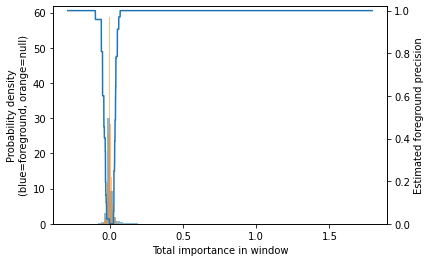

Subsampling!


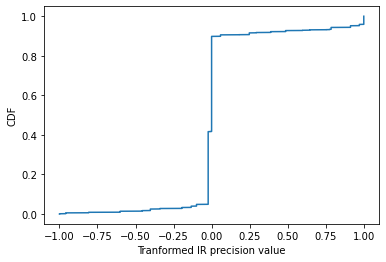

Thresholds from null dist were -0.8  and  0.8 with frac passing 0.06482
Got 143561 coords


In [7]:
from importlib import reload

import modisco
import modisco.util
reload(modisco.util)
reload(modisco.cluster.core)
reload(modisco.coordproducers)
from modisco.visualization import viz_sequence
reload(modisco.aggregator)
from modisco import hit_scoring
reload(modisco.hit_scoring)
from modisco.hit_scoring import densityadapted_hitscoring
reload(modisco.hit_scoring.densityadapted_hitscoring)
reload(densityadapted_hitscoring)
reload(modisco.cluster.core)

orig_patterns = (tfm_results.metacluster_idx_to_submetacluster_results["metacluster_0"]
                 .seqlets_to_patterns_result.patterns)

#The hit-scorer works in two stages:
# (1) Identifying regions of high importance ("seqlets")
# (2) Mapping those seqlets to patterns (motifs)
#(The two stages are independent of each other)

#instantiate the hit_scorer by providing the patterns
# that identified seqlets will be mapped to. The patterns
# will be trimmed to target_seqlet_size
hit_scorer = densityadapted_hitscoring.MakeHitScorer(
    patterns=orig_patterns,
    target_seqlet_size=25,
    bg_freq=np.mean(onehot_data, axis=(0,1)),
    task_names_and_signs=[("task0",1)],
    n_cores=10)

#set the method used to identify coordinates of high importance ("seqlets")
#You have to provide a contribution score track as this will be used
# to calibrate the threshold used for seqlet identification. You
# can also optionally provide an empirical null distribution track via
# the 'null_track' argument, similar to when tf-modisco is first run.
hit_scorer.set_coordproducer(
    contrib_scores={'task0': contrib_scores},
    core_sliding_window_size=7,
    target_fdr=0.2,
    min_passing_windows_frac=0.03,
    max_passing_windows_frac=0.2,
    separate_pos_neg_thresholds=False,                             
    max_seqlets_total=np.inf)


In [8]:
#Now that the hit-scorer is configured, you can call it on some data to
# get the motif hit calls.
#Note that the values provided to contrib_scores below DO NOT have to be
# the same as the values provided to set_coordproducer above.
num_to_score = 30 #the number of sequences to score, for speed
(exampleidx_to_matches, patternidx_to_matches) = hit_scorer(
           contrib_scores={'task0': contrib_scores[:num_to_score]},
           hypothetical_contribs={'task0': hyp_scores[:num_to_score]},
           one_hot=onehot_data[:num_to_score],
           hits_to_return_per_seqlet=1)

Got 125 coords


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    1.8s
[Parallel(n_jobs=10)]: Done 125 out of 125 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.05037832260131836 s
Batching in slices of size 125


[Parallel(n_jobs=1)]: Done 125 out of 125 | elapsed:    0.7s finished
100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


Launching nearest neighbors affmat calculation job
MEMORY 3.913895936
Parallel runs completed
MEMORY 3.913895936
Job completed in: 2.8 s
MEMORY 3.913895936
Launching nearest neighbors affmat calculation job
MEMORY 3.913895936
Parallel runs completed
MEMORY 3.913961472
Job completed in: 2.93 s
MEMORY 3.913961472
Removed 20 duplicates


EXAMPLE IDX 0


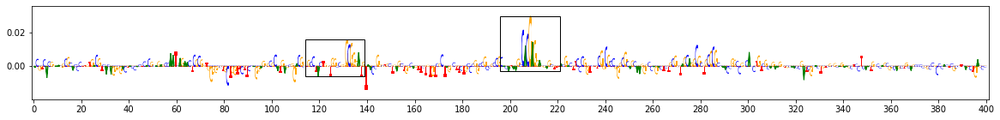

Matches to pattern 0


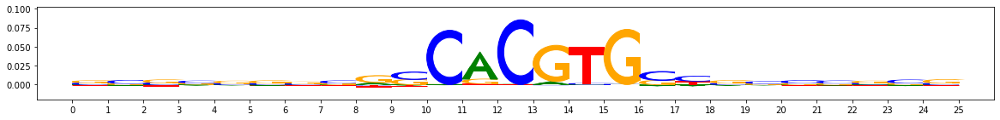

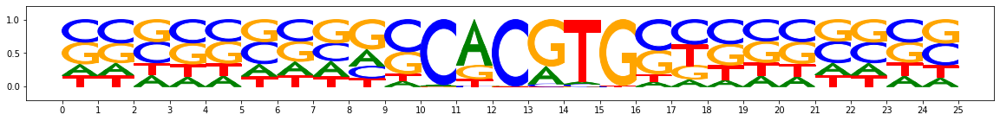

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=0.12410881968867216, exampleidx=0, start=196, end=221, is_revcomp=True, seqlet_orig_start=193, seqlet_orig_end=218, seqlet_orig_revcomp=False, aggregate_sim=0.47236312266837355, mod_delta=0.00017122213117591885, mod_precision=0.8490028490028491, mod_percentile=0.3266733266733267, fann_perclasssum_perc=0.45254745254745254, fann_perclassavg_perc=0.6003996003996004)


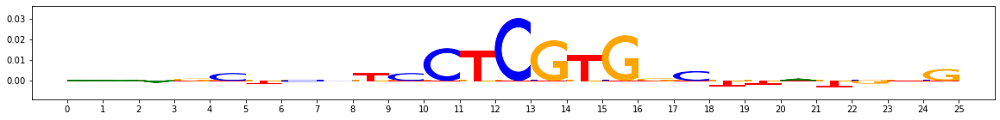

Matches to pattern 1


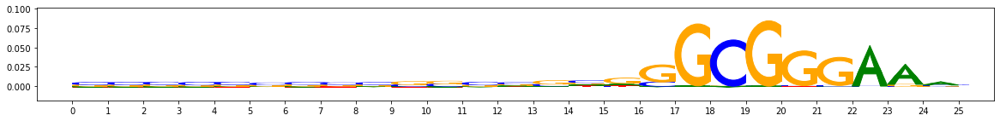

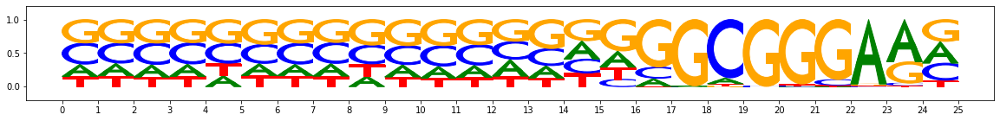

MotifMatchWithImportance(patternidx=1, patternidx_rank=0, total_importance=0.0759928214683896, exampleidx=0, start=114, end=139, is_revcomp=False, seqlet_orig_start=121, seqlet_orig_end=146, seqlet_orig_revcomp=False, aggregate_sim=0.38845637353023377, mod_delta=0.0002363528462730157, mod_precision=0.919047619047619, mod_percentile=0.5486111111111112, fann_perclasssum_perc=0.42638888888888893, fann_perclassavg_perc=0.24305555555555558)


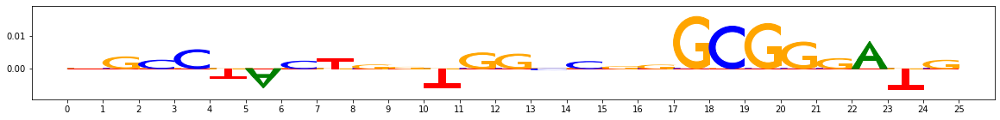

EXAMPLE IDX 1


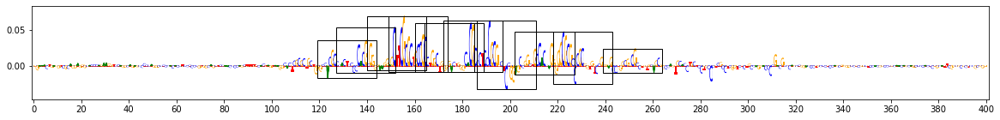

Matches to pattern 0


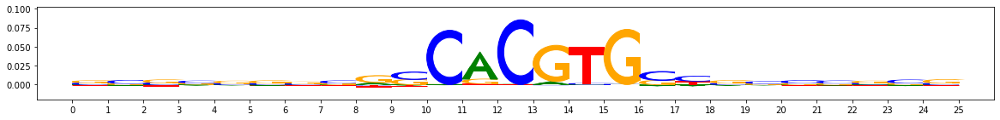

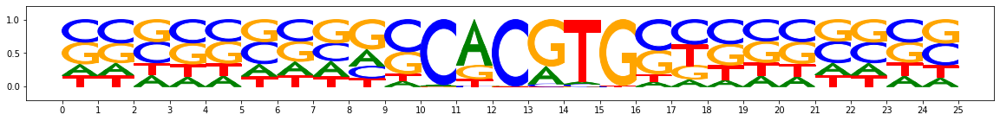

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=0.21967082371702418, exampleidx=1, start=127, end=152, is_revcomp=True, seqlet_orig_start=124, seqlet_orig_end=149, seqlet_orig_revcomp=False, aggregate_sim=0.39086557208366735, mod_delta=0.00011750296533390685, mod_precision=0.7058823529411765, mod_percentile=0.18881118881118886, fann_perclasssum_perc=0.20479520479520474, fann_perclassavg_perc=0.3176823176823177)


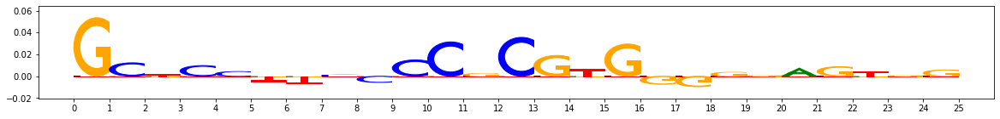

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=0.35778212919831276, exampleidx=1, start=202, end=227, is_revcomp=False, seqlet_orig_start=197, seqlet_orig_end=222, seqlet_orig_revcomp=False, aggregate_sim=0.2386616855073527, mod_delta=6.880333675362685e-05, mod_precision=0.6206896551724138, mod_percentile=0.10189810189810189, fann_perclasssum_perc=0.07392607392607398, fann_perclassavg_perc=0.018981018981019004)


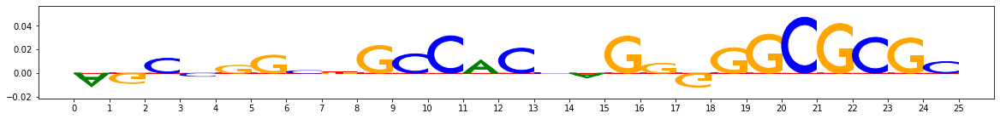

Matches to pattern 1


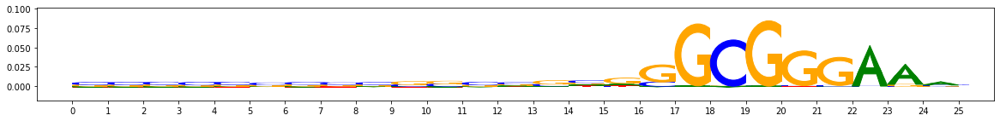

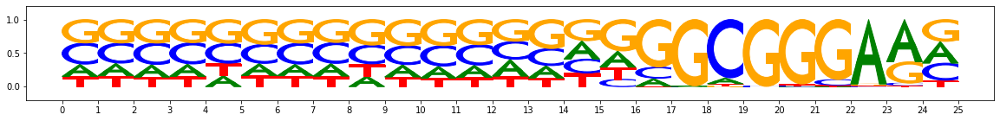

MotifMatchWithImportance(patternidx=1, patternidx_rank=0, total_importance=0.203343921341002, exampleidx=1, start=186, end=211, is_revcomp=True, seqlet_orig_start=186, seqlet_orig_end=211, seqlet_orig_revcomp=False, aggregate_sim=0.3250138257395788, mod_delta=0.00013078996415829064, mod_precision=0.5825242718446602, mod_percentile=0.18055555555555558, fann_perclasssum_perc=0.125, fann_perclassavg_perc=0.06666666666666665)


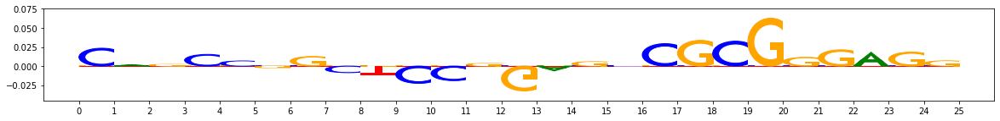

Matches to pattern 2


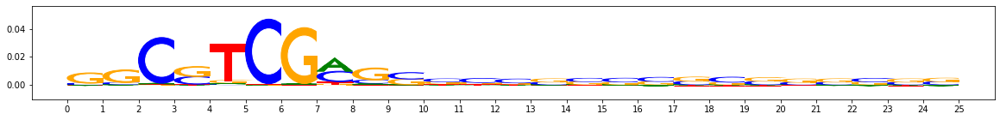

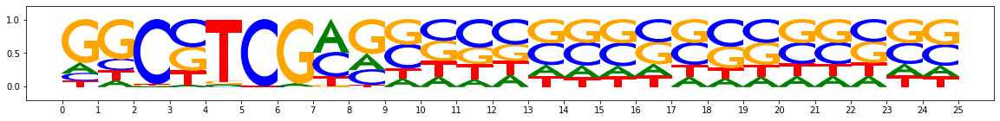

MotifMatchWithImportance(patternidx=2, patternidx_rank=0, total_importance=0.5659187320852652, exampleidx=1, start=149, end=174, is_revcomp=False, seqlet_orig_start=145, seqlet_orig_end=170, seqlet_orig_revcomp=False, aggregate_sim=0.32002864300836376, mod_delta=5.015558511219204e-05, mod_precision=0.22950819672131148, mod_percentile=0.10881542699724522, fann_perclasssum_perc=0.16804407713498626, fann_perclassavg_perc=0.6597796143250689)


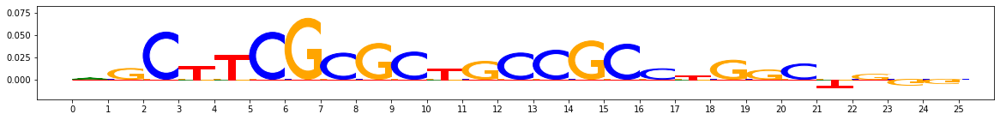

Matches to pattern 3


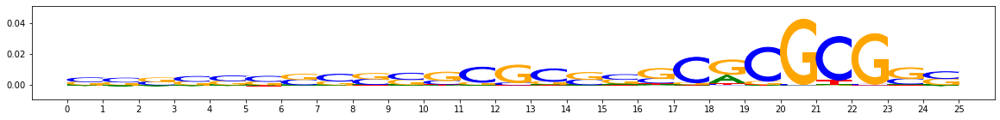

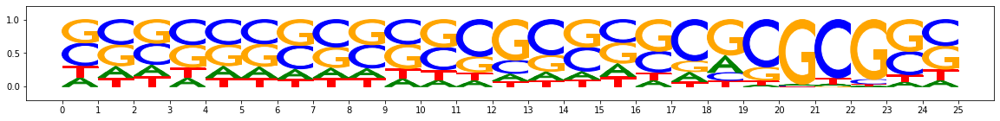

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.17426693363813683, exampleidx=1, start=119, end=144, is_revcomp=False, seqlet_orig_start=115, seqlet_orig_end=140, seqlet_orig_revcomp=False, aggregate_sim=0.26706912783462167, mod_delta=7.846188651737468e-05, mod_precision=0.5158730158730159, mod_percentile=0.6357142857142857, fann_perclasssum_perc=0.45571428571428574, fann_perclassavg_perc=0.02571428571428569)


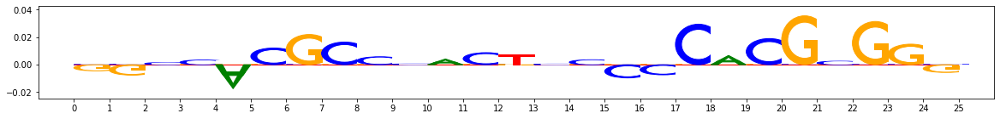

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.3585306671448052, exampleidx=1, start=160, end=185, is_revcomp=True, seqlet_orig_start=153, seqlet_orig_end=178, seqlet_orig_revcomp=False, aggregate_sim=0.32250791730055667, mod_delta=8.340544830607414e-05, mod_precision=0.5636363636363637, mod_percentile=0.6914285714285715, fann_perclasssum_perc=0.6814285714285715, fann_perclassavg_perc=0.28428571428571425)


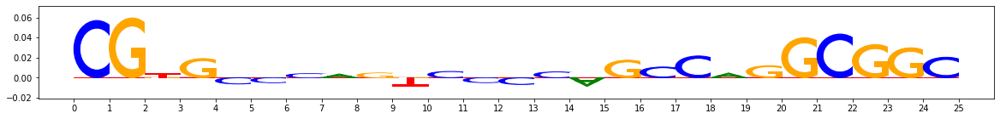

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.29971942864358425, exampleidx=1, start=164, end=189, is_revcomp=False, seqlet_orig_start=168, seqlet_orig_end=193, seqlet_orig_revcomp=False, aggregate_sim=0.31921400681788353, mod_delta=7.956860678736365e-05, mod_precision=0.5158730158730159, mod_percentile=0.6442857142857144, fann_perclasssum_perc=0.6214285714285714, fann_perclassavg_perc=0.3442857142857143)


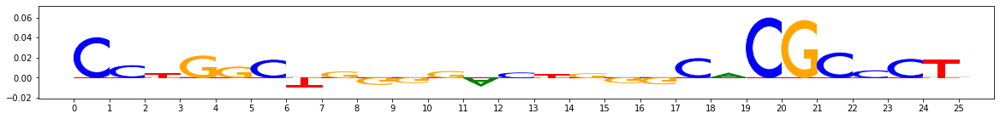

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.3938874308951199, exampleidx=1, start=172, end=197, is_revcomp=False, seqlet_orig_start=176, seqlet_orig_end=201, seqlet_orig_revcomp=False, aggregate_sim=0.3292548033489992, mod_delta=0.00010403172875135143, mod_precision=0.6451612903225806, mod_percentile=0.8542857142857143, fann_perclasssum_perc=0.89, fann_perclassavg_perc=0.49428571428571433)


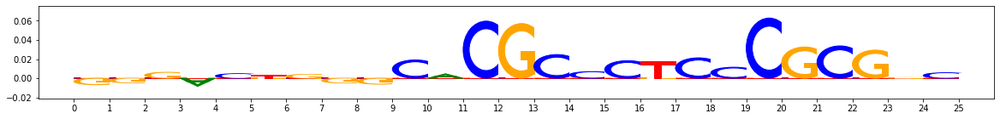

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.2546786000020802, exampleidx=1, start=218, end=243, is_revcomp=True, seqlet_orig_start=214, seqlet_orig_end=239, seqlet_orig_revcomp=False, aggregate_sim=0.32234281527695485, mod_delta=8.757400843076199e-05, mod_precision=0.5789473684210527, mod_percentile=0.7214285714285714, fann_perclasssum_perc=0.7428571428571429, fann_perclassavg_perc=0.40142857142857147)


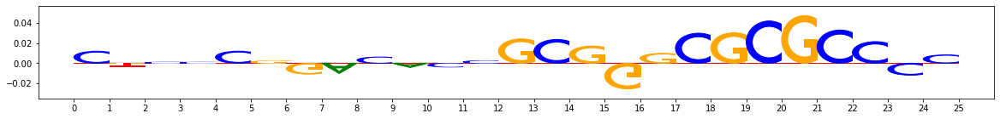

Matches to pattern 5


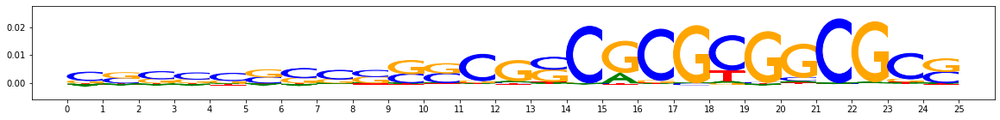

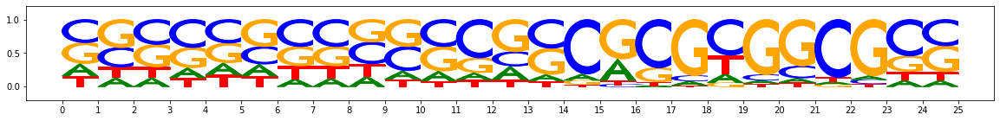

MotifMatchWithImportance(patternidx=5, patternidx_rank=0, total_importance=0.561083798063919, exampleidx=1, start=140, end=165, is_revcomp=False, seqlet_orig_start=137, seqlet_orig_end=162, seqlet_orig_revcomp=False, aggregate_sim=0.291731195235195, mod_delta=5.8607068102981685e-05, mod_precision=0.3557692307692308, mod_percentile=0.5207100591715976, fann_perclasssum_perc=0.3372781065088757, fann_perclassavg_perc=0.10946745562130178)


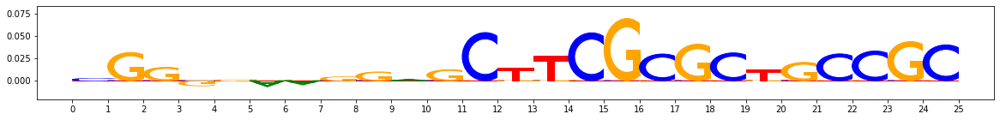

Matches to pattern 6


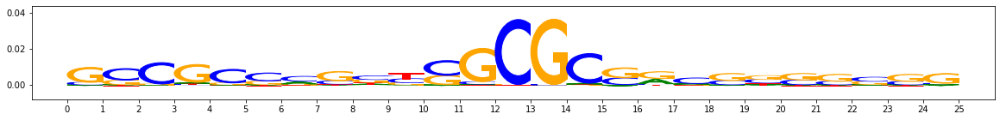

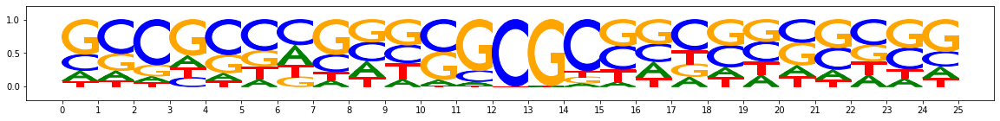

MotifMatchWithImportance(patternidx=6, patternidx_rank=0, total_importance=0.05306646178360097, exampleidx=1, start=239, end=264, is_revcomp=False, seqlet_orig_start=238, seqlet_orig_end=263, seqlet_orig_revcomp=False, aggregate_sim=0.24704890413045708, mod_delta=2.5393828841578903e-05, mod_precision=0.11961722488038277, mod_percentile=0.31189710610932475, fann_perclasssum_perc=0.22186495176848875, fann_perclassavg_perc=0.01607717041800638)


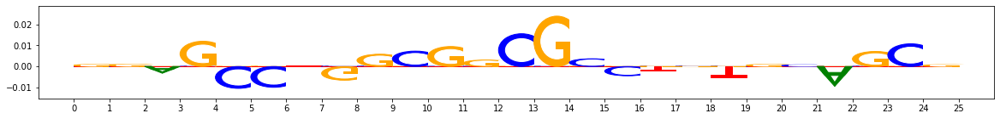

EXAMPLE IDX 2


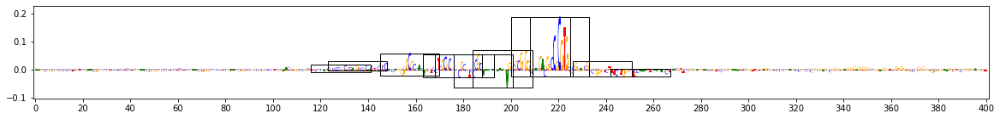

Matches to pattern 0


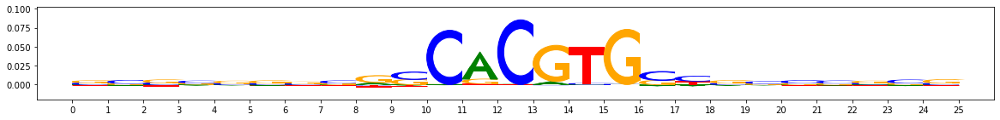

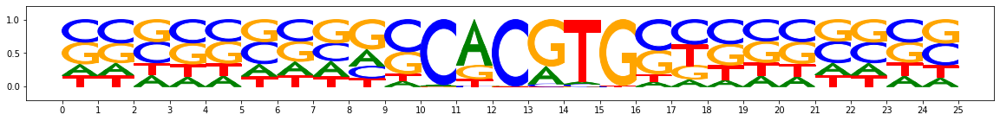

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=0.9489183621481061, exampleidx=2, start=208, end=233, is_revcomp=False, seqlet_orig_start=213, seqlet_orig_end=238, seqlet_orig_revcomp=False, aggregate_sim=0.5074453502159385, mod_delta=0.00018563890337750368, mod_precision=0.8490028490028491, mod_percentile=0.3706293706293706, fann_perclasssum_perc=0.6533466533466534, fann_perclassavg_perc=0.7762237762237763)


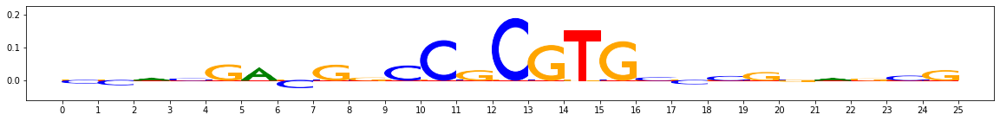

Matches to pattern 2


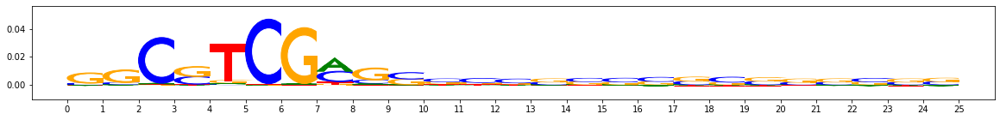

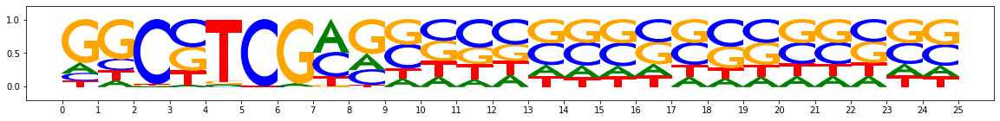

MotifMatchWithImportance(patternidx=2, patternidx_rank=0, total_importance=-0.051216896157711744, exampleidx=2, start=226, end=251, is_revcomp=False, seqlet_orig_start=231, seqlet_orig_end=256, seqlet_orig_revcomp=False, aggregate_sim=0.12840959087110873, mod_delta=0.0001546106630646692, mod_precision=0.8666666666666667, mod_percentile=0.3347107438016529, fann_perclasssum_perc=0.14738292011019283, fann_perclassavg_perc=0.0)


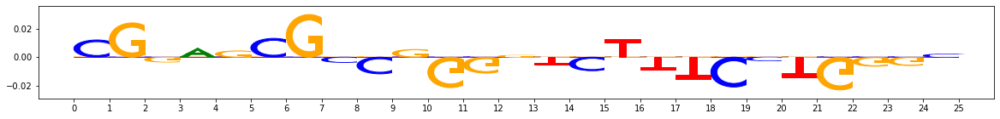

Matches to pattern 3


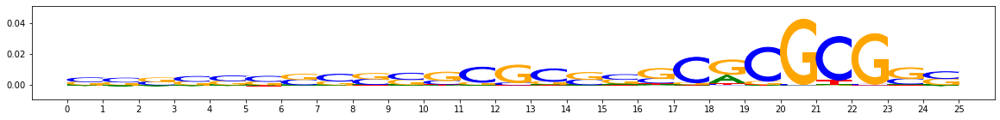

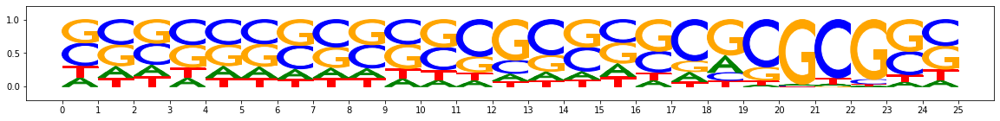

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.246348646338447, exampleidx=2, start=168, end=193, is_revcomp=True, seqlet_orig_start=156, seqlet_orig_end=181, seqlet_orig_revcomp=False, aggregate_sim=0.24278386053393786, mod_delta=3.8743645567209646e-05, mod_precision=0.30434782608695654, mod_percentile=0.3085714285714286, fann_perclasssum_perc=0.22999999999999998, fann_perclassavg_perc=0.03285714285714281)


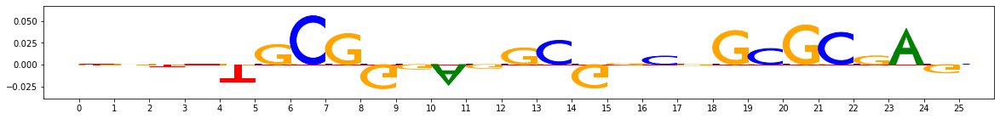

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.2592728535673814, exampleidx=2, start=184, end=209, is_revcomp=False, seqlet_orig_start=189, seqlet_orig_end=214, seqlet_orig_revcomp=False, aggregate_sim=0.33030089989148537, mod_delta=3.995797811314e-05, mod_precision=0.3333333333333333, mod_percentile=0.3157142857142857, fann_perclasssum_perc=0.32999999999999996, fann_perclassavg_perc=0.2528571428571429)


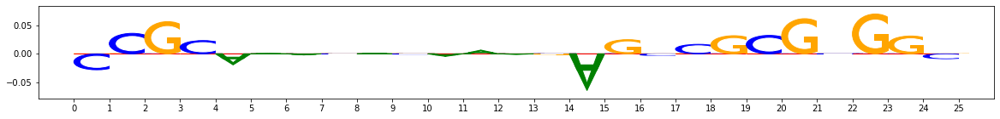

Matches to pattern 4


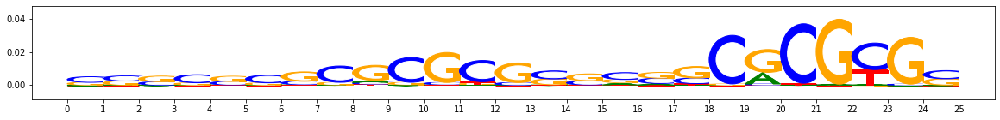

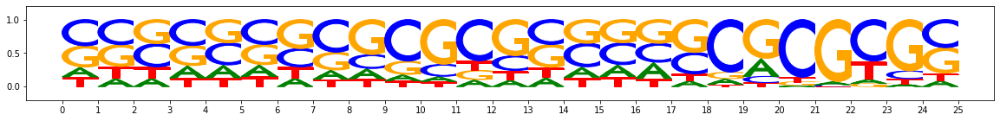

MotifMatchWithImportance(patternidx=4, patternidx_rank=0, total_importance=0.24291536479722708, exampleidx=2, start=163, end=188, is_revcomp=False, seqlet_orig_start=164, seqlet_orig_end=189, seqlet_orig_revcomp=False, aggregate_sim=0.2582357917712044, mod_delta=4.828295903173168e-05, mod_precision=0.24, mod_percentile=0.337037037037037, fann_perclasssum_perc=0.27037037037037037, fann_perclassavg_perc=0.033333333333333326)


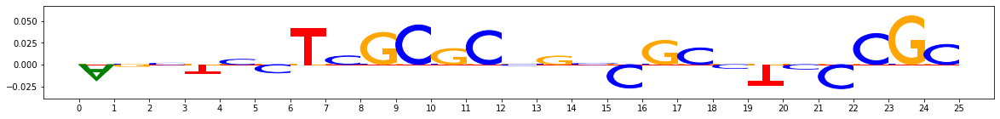

MotifMatchWithImportance(patternidx=4, patternidx_rank=0, total_importance=1.1128426973882597, exampleidx=2, start=200, end=225, is_revcomp=False, seqlet_orig_start=197, seqlet_orig_end=222, seqlet_orig_revcomp=False, aggregate_sim=0.3200474550920934, mod_delta=3.828874717753344e-05, mod_precision=0.2, mod_percentile=0.2925925925925926, fann_perclasssum_perc=0.2407407407407407, fann_perclassavg_perc=0.040740740740740744)


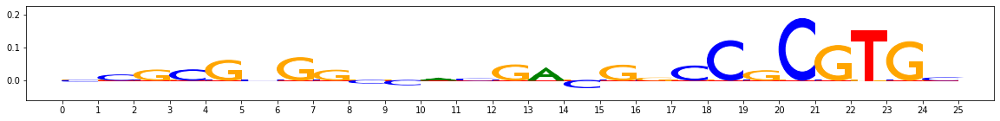

MotifMatchWithImportance(patternidx=4, patternidx_rank=0, total_importance=-0.19296074367593974, exampleidx=2, start=242, end=267, is_revcomp=True, seqlet_orig_start=239, seqlet_orig_end=264, seqlet_orig_revcomp=False, aggregate_sim=0.09151716168052476, mod_delta=0.0001568637249175918, mod_precision=1.0, mod_percentile=0.9981481481481481, fann_perclasssum_perc=0.29814814814814816, fann_perclassavg_perc=0.0)


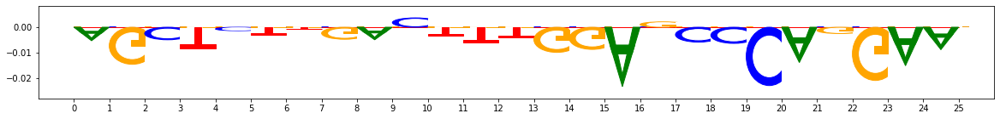

Matches to pattern 5


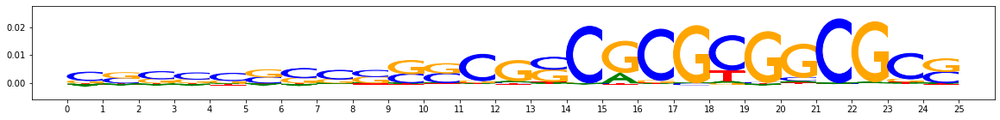

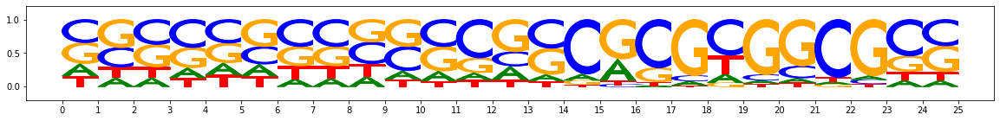

MotifMatchWithImportance(patternidx=5, patternidx_rank=0, total_importance=0.0908039674977772, exampleidx=2, start=116, end=141, is_revcomp=False, seqlet_orig_start=120, seqlet_orig_end=145, seqlet_orig_revcomp=False, aggregate_sim=0.2862964502951252, mod_delta=8.192692629165011e-05, mod_precision=0.6896551724137931, mod_percentile=0.7485207100591715, fann_perclasssum_perc=0.44082840236686394, fann_perclassavg_perc=0.00887573964497046)


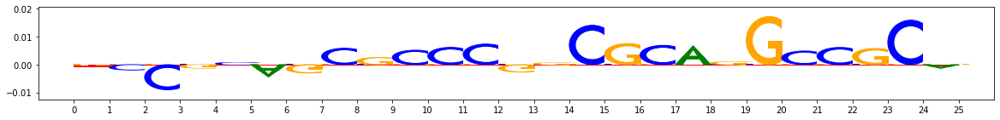

MotifMatchWithImportance(patternidx=5, patternidx_rank=0, total_importance=0.20524670759914443, exampleidx=2, start=123, end=148, is_revcomp=False, seqlet_orig_start=130, seqlet_orig_end=155, seqlet_orig_revcomp=False, aggregate_sim=0.2635662537230295, mod_delta=7.588764149919982e-05, mod_precision=0.4251968503937008, mod_percentile=0.6834319526627219, fann_perclasssum_perc=0.4526627218934911, fann_perclassavg_perc=0.00295857988165682)


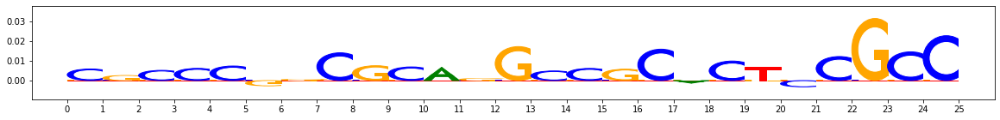

MotifMatchWithImportance(patternidx=5, patternidx_rank=0, total_importance=0.023338157436228357, exampleidx=2, start=176, end=201, is_revcomp=True, seqlet_orig_start=176, seqlet_orig_end=201, seqlet_orig_revcomp=False, aggregate_sim=0.23424173012925217, mod_delta=4.9677555254254094e-05, mod_precision=0.3557692307692308, mod_percentile=0.42899408284023666, fann_perclasssum_perc=0.13313609467455623, fann_perclassavg_perc=0.0)


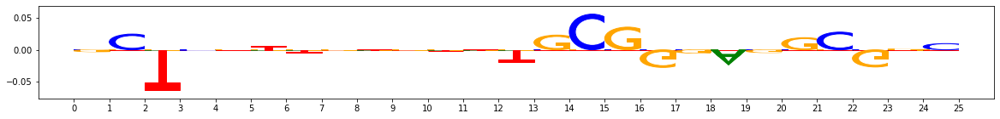

Matches to pattern 6


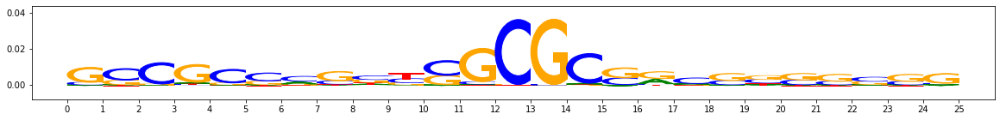

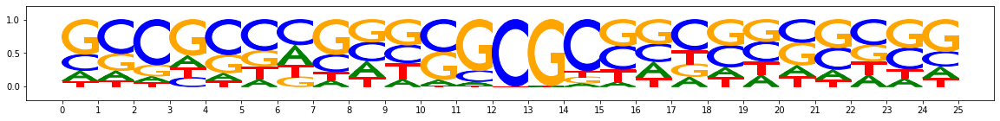

MotifMatchWithImportance(patternidx=6, patternidx_rank=0, total_importance=0.23416710831224918, exampleidx=2, start=145, end=170, is_revcomp=False, seqlet_orig_start=142, seqlet_orig_end=167, seqlet_orig_revcomp=False, aggregate_sim=0.3470748843237292, mod_delta=4.86570324921018e-05, mod_precision=0.40540540540540543, mod_percentile=0.639871382636656, fann_perclasssum_perc=0.7106109324758842, fann_perclassavg_perc=0.2411575562700965)


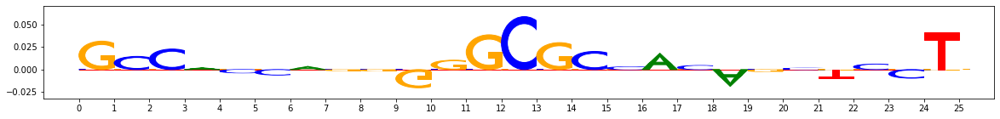

EXAMPLE IDX 3


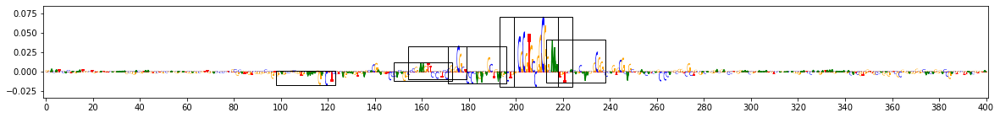

Matches to pattern 0


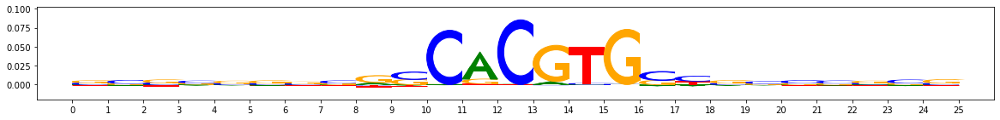

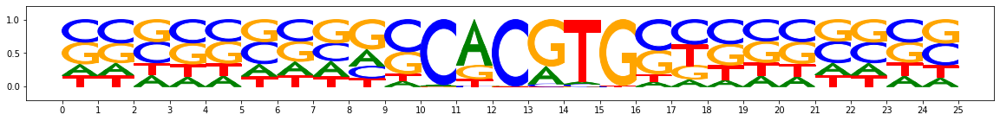

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=0.008479454962071031, exampleidx=3, start=148, end=173, is_revcomp=False, seqlet_orig_start=147, seqlet_orig_end=172, seqlet_orig_revcomp=False, aggregate_sim=0.12381222673396305, mod_delta=7.659213523743903e-05, mod_precision=0.6310415180019551, mod_percentile=0.11288711288711284, fann_perclasssum_perc=0.027972027972028024, fann_perclassavg_perc=0.0)


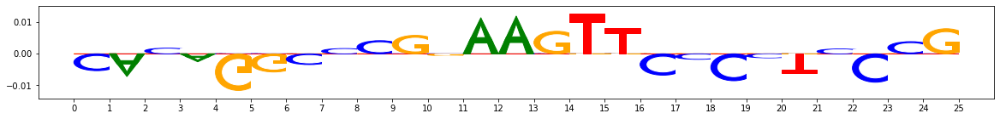

Matches to pattern 1


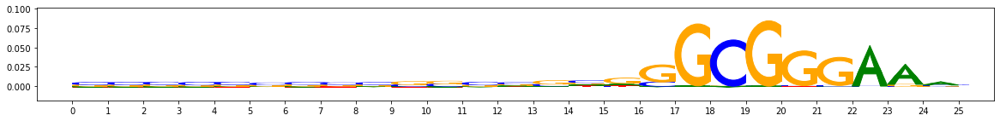

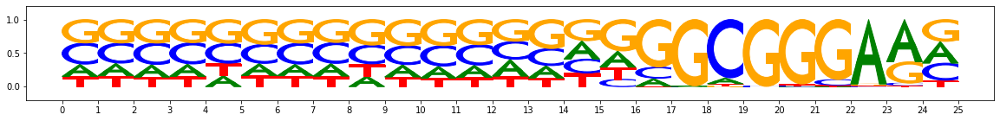

MotifMatchWithImportance(patternidx=1, patternidx_rank=0, total_importance=0.48685158387525007, exampleidx=3, start=193, end=218, is_revcomp=False, seqlet_orig_start=204, seqlet_orig_end=229, seqlet_orig_revcomp=False, aggregate_sim=0.43796608543768606, mod_delta=0.0002412627495539259, mod_precision=0.919047619047619, mod_percentile=0.5819444444444444, fann_perclasssum_perc=0.49444444444444446, fann_perclassavg_perc=0.37777777777777777)


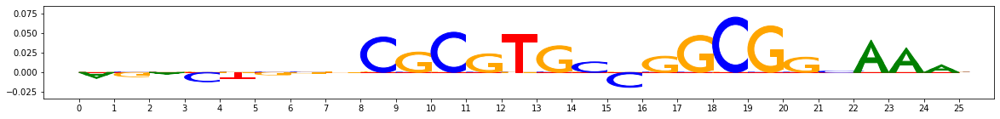

Matches to pattern 3


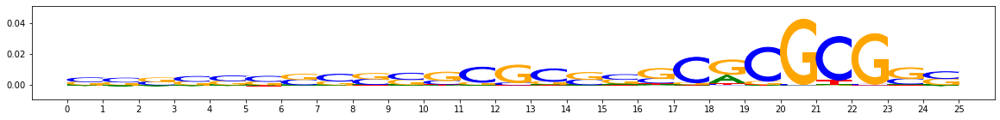

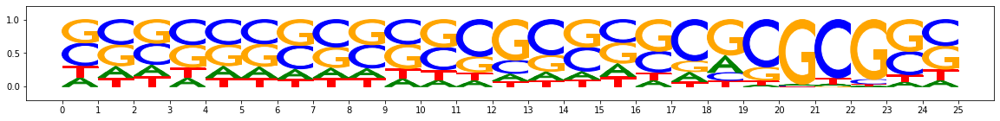

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.11422447877703235, exampleidx=3, start=154, end=179, is_revcomp=False, seqlet_orig_start=162, seqlet_orig_end=187, seqlet_orig_revcomp=False, aggregate_sim=0.250513520738392, mod_delta=6.450009544033586e-05, mod_precision=0.34574468085106386, mod_percentile=0.5, fann_perclasssum_perc=0.32285714285714284, fann_perclassavg_perc=0.017142857142857126)


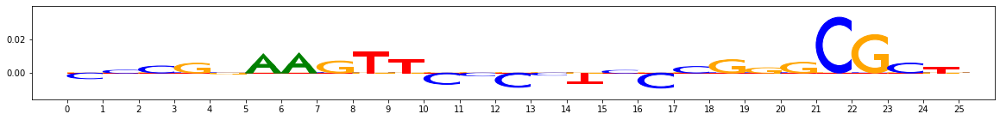

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=-0.0011794848833233118, exampleidx=3, start=171, end=196, is_revcomp=True, seqlet_orig_start=170, seqlet_orig_end=195, seqlet_orig_revcomp=False, aggregate_sim=0.2618075878282061, mod_delta=8.8694823463669e-05, mod_precision=0.5789473684210527, mod_percentile=0.7314285714285714, fann_perclasssum_perc=0.47285714285714286, fann_perclassavg_perc=0.017142857142857126)


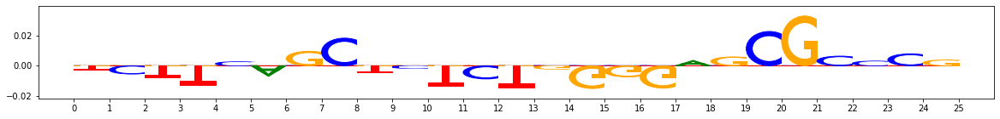

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.5036648702807724, exampleidx=3, start=199, end=224, is_revcomp=True, seqlet_orig_start=188, seqlet_orig_end=213, seqlet_orig_revcomp=False, aggregate_sim=0.36254013603448787, mod_delta=0.00011095110050417793, mod_precision=0.6451612903225806, mod_percentile=0.8942857142857142, fann_perclasssum_perc=0.9585714285714286, fann_perclassavg_perc=0.7471428571428571)


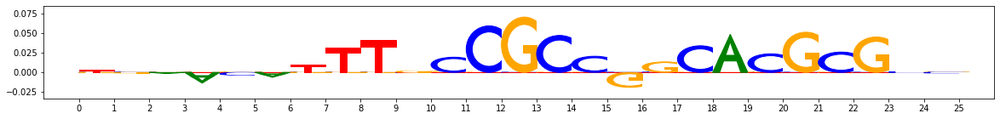

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.1389834116343991, exampleidx=3, start=213, end=238, is_revcomp=False, seqlet_orig_start=221, seqlet_orig_end=246, seqlet_orig_revcomp=False, aggregate_sim=0.3040033293114491, mod_delta=7.720415618376242e-05, mod_precision=0.5158730158730159, mod_percentile=0.6242857142857143, fann_perclasssum_perc=0.5471428571428572, fann_perclassavg_perc=0.30000000000000004)


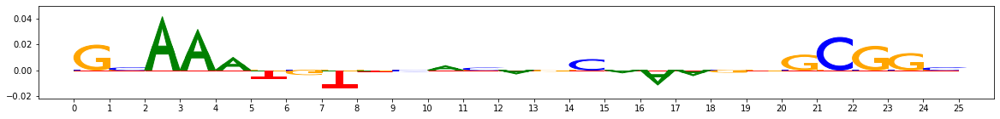

Matches to pattern 4


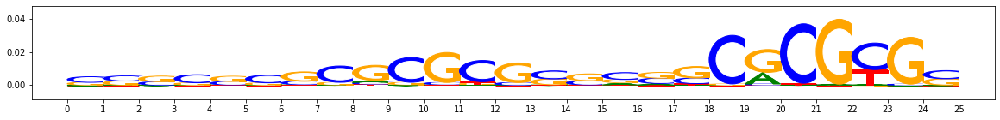

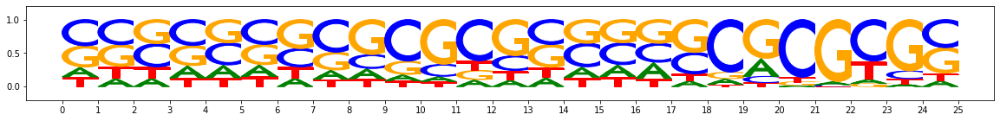

MotifMatchWithImportance(patternidx=4, patternidx_rank=0, total_importance=-0.0898226756544318, exampleidx=3, start=98, end=123, is_revcomp=False, seqlet_orig_start=106, seqlet_orig_end=131, seqlet_orig_revcomp=False, aggregate_sim=0.11042716327494373, mod_delta=0.00015995880969107482, mod_precision=1.0, mod_percentile=1.0, fann_perclasssum_perc=0.3648148148148148, fann_perclassavg_perc=0.0)


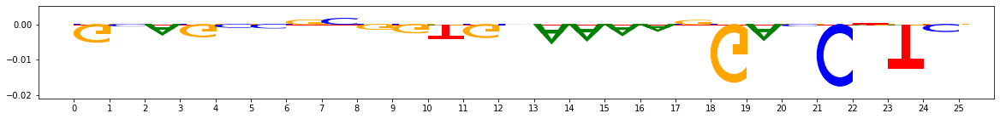

EXAMPLE IDX 4


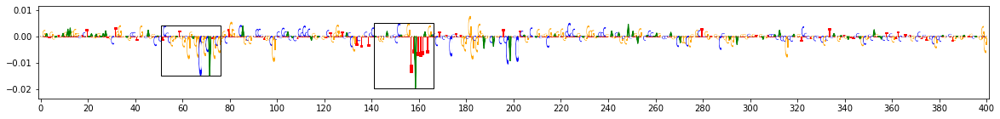

Matches to pattern 0


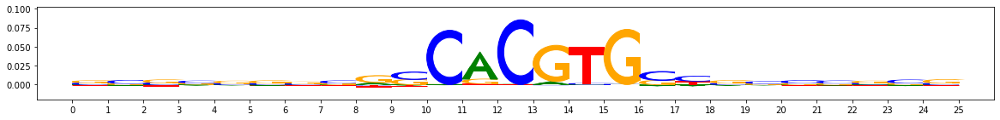

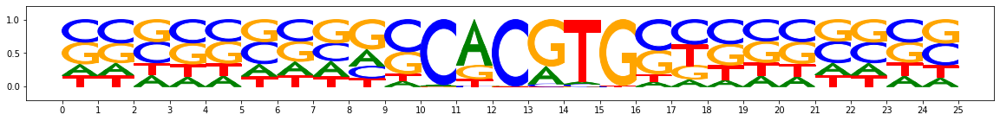

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=-0.054667854198669374, exampleidx=4, start=141, end=166, is_revcomp=True, seqlet_orig_start=147, seqlet_orig_end=172, seqlet_orig_revcomp=False, aggregate_sim=0.033239772451584854, mod_delta=0.0001040778129039906, mod_precision=0.7058823529411765, mod_percentile=0.16583416583416588, fann_perclasssum_perc=0.016983016983016963, fann_perclassavg_perc=0.0)


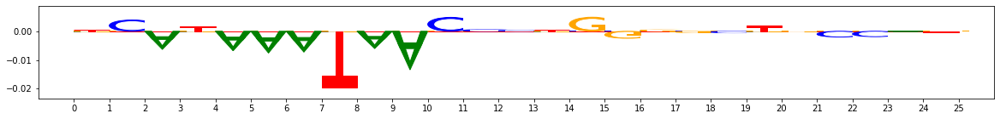

Matches to pattern 4


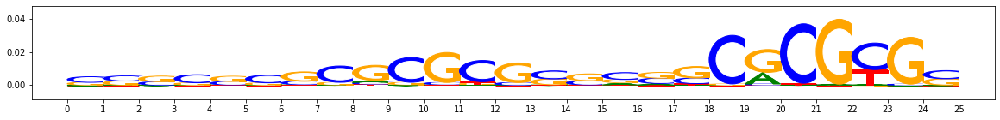

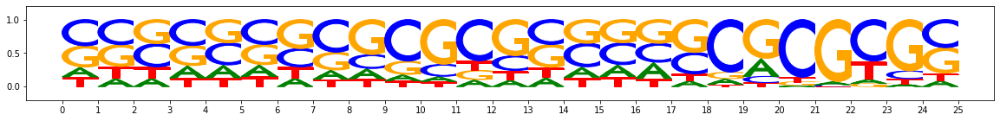

MotifMatchWithImportance(patternidx=4, patternidx_rank=0, total_importance=-0.09041749233438168, exampleidx=4, start=51, end=76, is_revcomp=False, seqlet_orig_start=56, seqlet_orig_end=81, seqlet_orig_revcomp=False, aggregate_sim=0.006716529015891096, mod_delta=0.0001361810789151119, mod_precision=0.8409090909090909, mod_percentile=0.9314814814814815, fann_perclasssum_perc=0.07037037037037042, fann_perclassavg_perc=0.0)


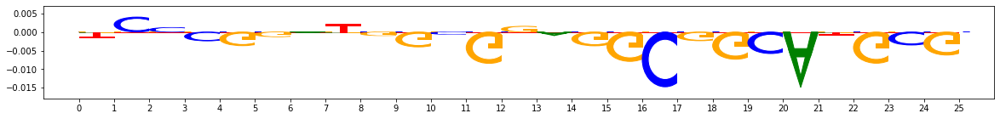

EXAMPLE IDX 6


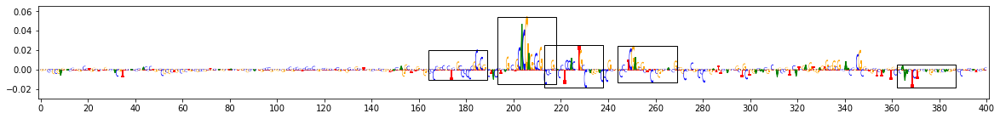

Matches to pattern 0


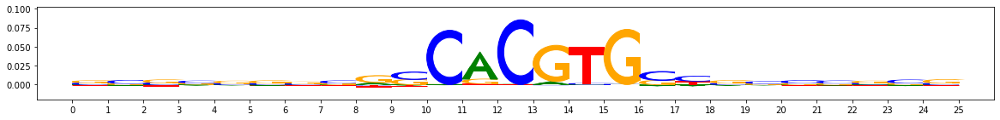

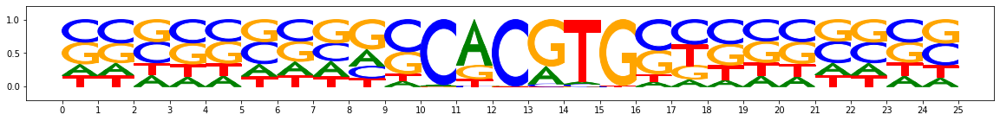

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=0.2620702837884892, exampleidx=6, start=193, end=218, is_revcomp=True, seqlet_orig_start=196, seqlet_orig_end=221, seqlet_orig_revcomp=False, aggregate_sim=0.3862953051963686, mod_delta=0.0001984966449684856, mod_precision=0.8490028490028491, mod_percentile=0.42357642357642356, fann_perclasssum_perc=0.4575424575424576, fann_perclassavg_perc=0.3306693306693307)


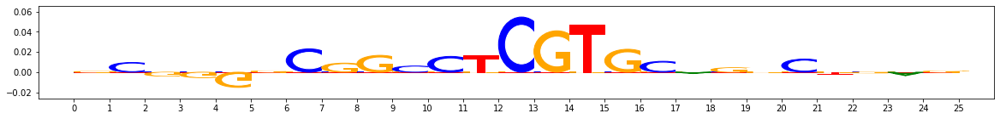

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=0.005936348432442173, exampleidx=6, start=213, end=238, is_revcomp=False, seqlet_orig_start=213, seqlet_orig_end=238, seqlet_orig_revcomp=False, aggregate_sim=0.29618470398832186, mod_delta=0.0002181432908961082, mod_precision=0.8490028490028491, mod_percentile=0.5354645354645355, fann_perclasssum_perc=0.26773226773226777, fann_perclassavg_perc=0.029970029970029954)


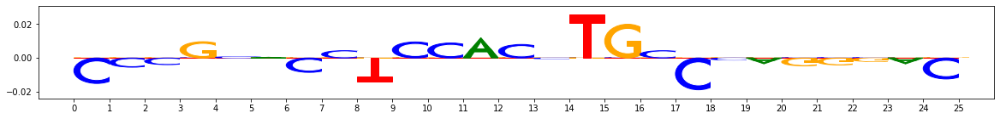

Matches to pattern 2


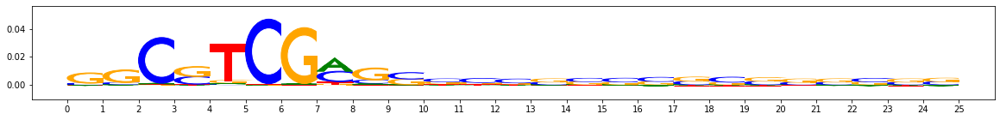

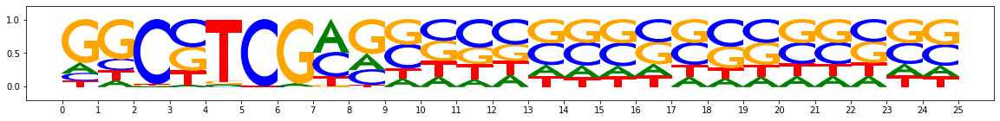

MotifMatchWithImportance(patternidx=2, patternidx_rank=0, total_importance=0.06020683390670456, exampleidx=6, start=244, end=269, is_revcomp=False, seqlet_orig_start=237, seqlet_orig_end=262, seqlet_orig_revcomp=False, aggregate_sim=0.29646049206121294, mod_delta=0.00020912646569100975, mod_precision=0.9776119402985075, mod_percentile=0.5096418732782368, fann_perclasssum_perc=0.4820936639118457, fann_perclassavg_perc=0.04820936639118456)


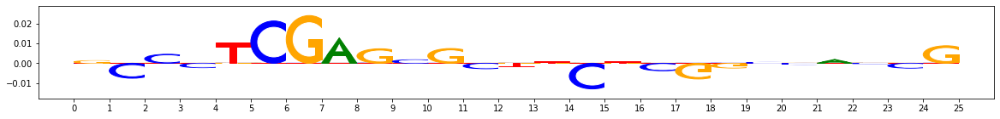

Matches to pattern 4


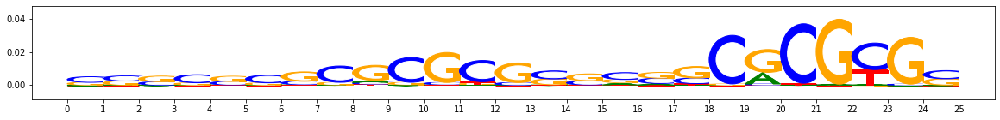

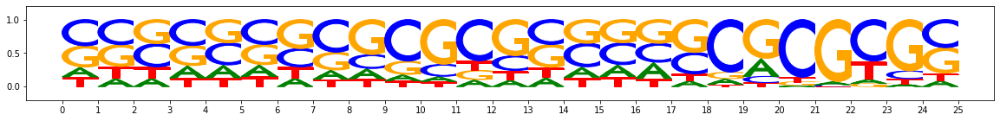

MotifMatchWithImportance(patternidx=4, patternidx_rank=0, total_importance=0.026325067818106618, exampleidx=6, start=164, end=189, is_revcomp=False, seqlet_orig_start=173, seqlet_orig_end=198, seqlet_orig_revcomp=False, aggregate_sim=0.27075081021269676, mod_delta=6.145539338288559e-05, mod_precision=0.3291139240506329, mod_percentile=0.3851851851851852, fann_perclasssum_perc=0.31851851851851853, fann_perclassavg_perc=0.031481481481481444)


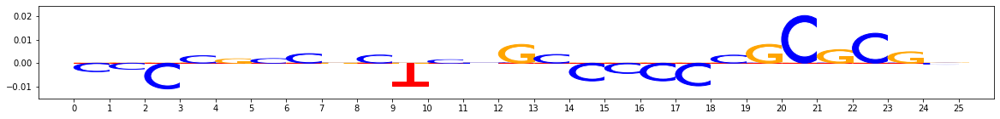

MotifMatchWithImportance(patternidx=4, patternidx_rank=0, total_importance=-0.07671161941834725, exampleidx=6, start=362, end=387, is_revcomp=True, seqlet_orig_start=356, seqlet_orig_end=381, seqlet_orig_revcomp=False, aggregate_sim=0.11926786345770177, mod_delta=0.00015887586563885975, mod_precision=1.0, mod_percentile=1.0, fann_perclasssum_perc=0.36851851851851847, fann_perclassavg_perc=0.0)


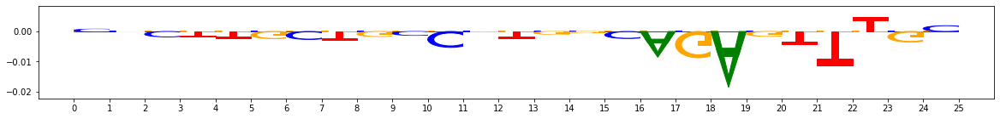

EXAMPLE IDX 7


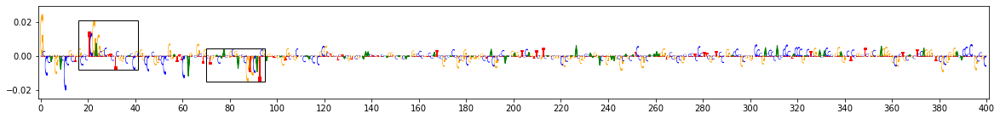

Matches to pattern 2


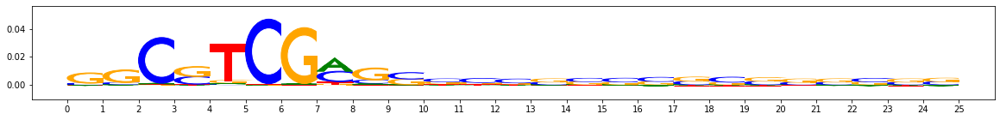

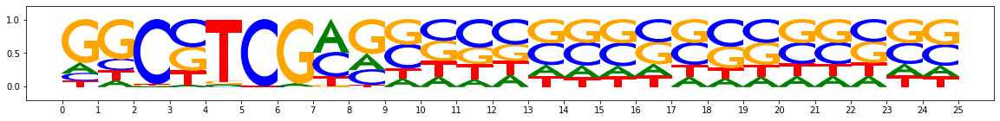

MotifMatchWithImportance(patternidx=2, patternidx_rank=0, total_importance=0.059691422304240405, exampleidx=7, start=16, end=41, is_revcomp=False, seqlet_orig_start=11, seqlet_orig_end=36, seqlet_orig_revcomp=False, aggregate_sim=0.3562979079475429, mod_delta=0.00018078945636630265, mod_precision=0.975609756097561, mod_percentile=0.4118457300275482, fann_perclasssum_perc=0.5055096418732783, fann_perclassavg_perc=0.4366391184573003)


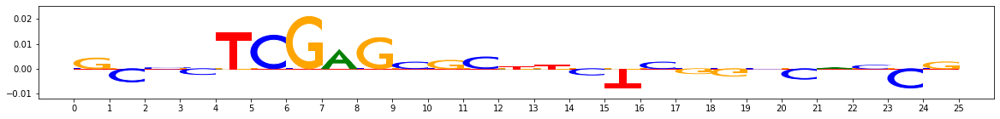

Matches to pattern 3


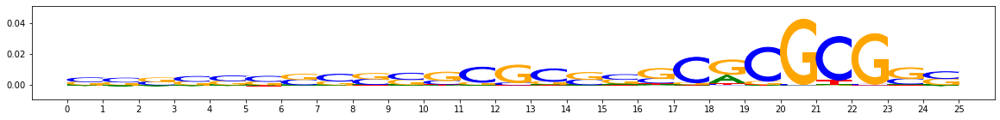

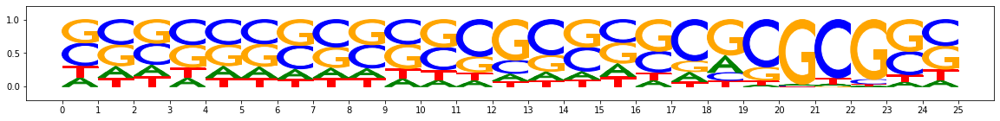

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=-0.07492690975777805, exampleidx=7, start=70, end=95, is_revcomp=False, seqlet_orig_start=76, seqlet_orig_end=101, seqlet_orig_revcomp=False, aggregate_sim=0.16414112629219527, mod_delta=7.664346947325288e-05, mod_precision=0.5158730158730159, mod_percentile=0.6171428571428572, fann_perclasssum_perc=0.1528571428571428, fann_perclassavg_perc=0.0)


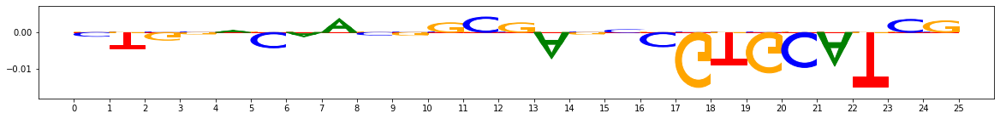

EXAMPLE IDX 8


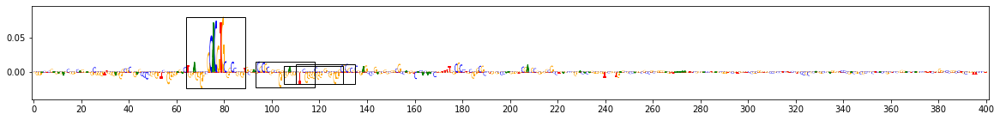

Matches to pattern 0


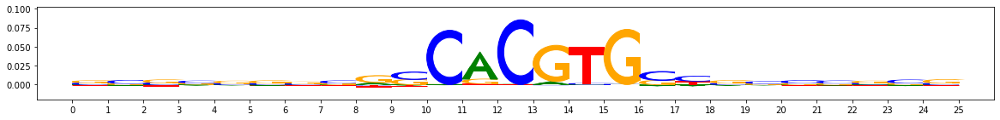

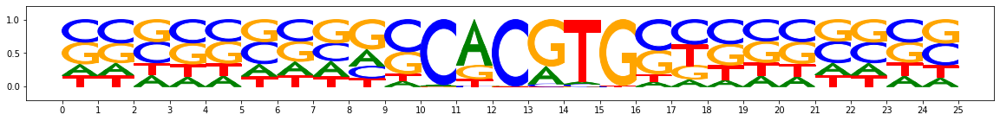

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=0.4037722093053162, exampleidx=8, start=64, end=89, is_revcomp=False, seqlet_orig_start=60, seqlet_orig_end=85, seqlet_orig_revcomp=False, aggregate_sim=0.48332130725191336, mod_delta=0.00021510755148581662, mod_precision=0.8490028490028491, mod_percentile=0.5184815184815185, fann_perclasssum_perc=0.8051948051948052, fann_perclassavg_perc=0.7692307692307692)


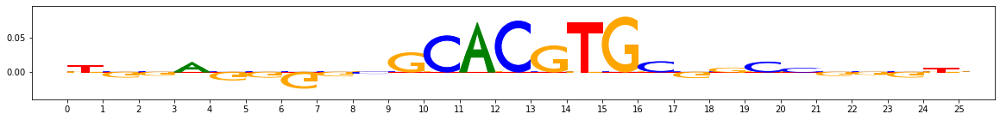

Matches to pattern 3


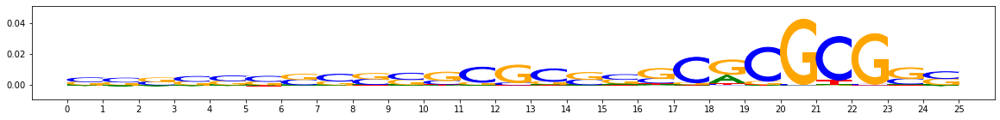

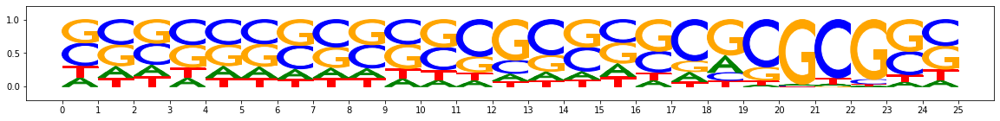

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=-0.050278591838832654, exampleidx=8, start=110, end=135, is_revcomp=False, seqlet_orig_start=120, seqlet_orig_end=145, seqlet_orig_revcomp=False, aggregate_sim=0.2840740388057166, mod_delta=5.583127357881131e-05, mod_precision=0.34574468085106386, mod_percentile=0.44285714285714284, fann_perclasssum_perc=0.34571428571428575, fann_perclassavg_perc=0.07285714285714284)


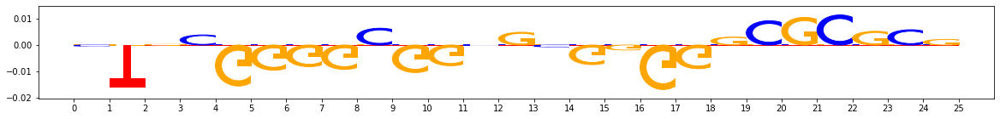

Matches to pattern 4


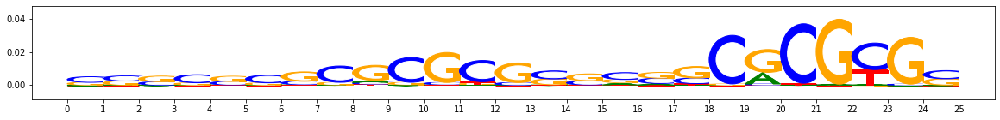

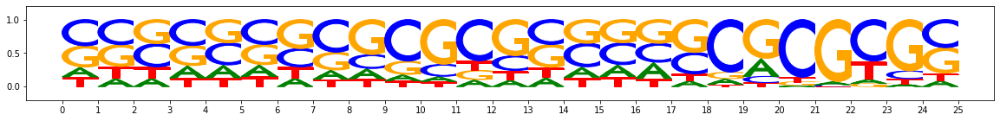

MotifMatchWithImportance(patternidx=4, patternidx_rank=0, total_importance=-0.029275618915562518, exampleidx=8, start=93, end=118, is_revcomp=True, seqlet_orig_start=82, seqlet_orig_end=107, seqlet_orig_revcomp=False, aggregate_sim=0.28154951753659024, mod_delta=4.4046149478807375e-05, mod_precision=0.2, mod_percentile=0.3111111111111111, fann_perclasssum_perc=0.2685185185185185, fann_perclassavg_perc=0.08333333333333337)


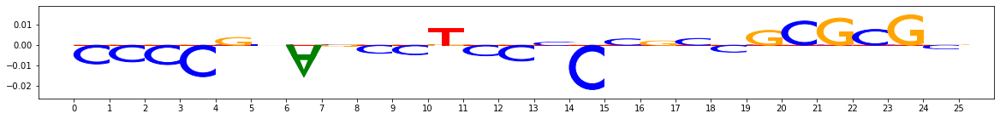

MotifMatchWithImportance(patternidx=4, patternidx_rank=0, total_importance=-0.09837876554502145, exampleidx=8, start=105, end=130, is_revcomp=True, seqlet_orig_start=102, seqlet_orig_end=127, seqlet_orig_revcomp=False, aggregate_sim=0.06820681503283561, mod_delta=0.00015747906668865072, mod_precision=1.0, mod_percentile=0.9981481481481481, fann_perclasssum_perc=0.30740740740740746, fann_perclassavg_perc=0.0)


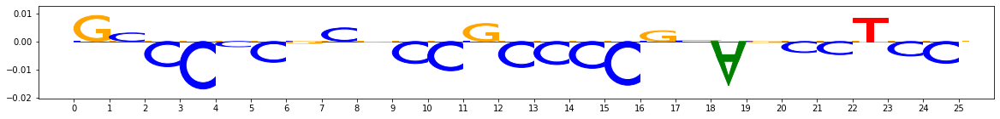

EXAMPLE IDX 9


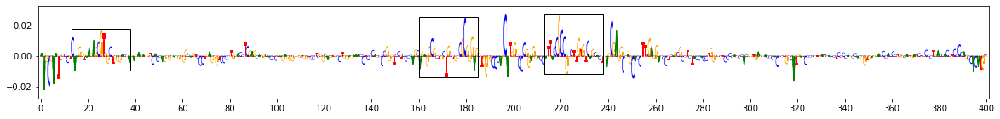

Matches to pattern 0


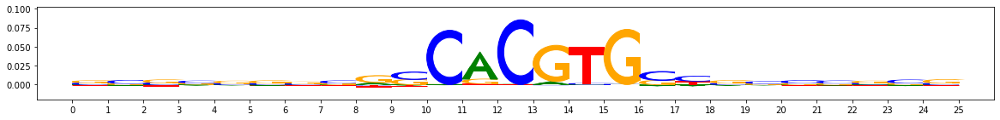

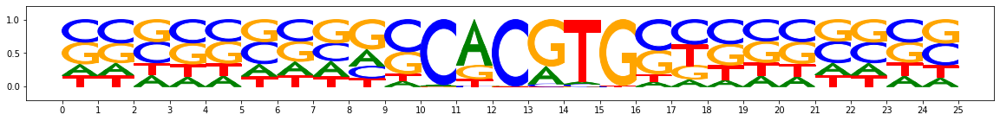

MotifMatchWithImportance(patternidx=0, patternidx_rank=0, total_importance=0.06227843392116483, exampleidx=9, start=13, end=38, is_revcomp=True, seqlet_orig_start=11, seqlet_orig_end=36, seqlet_orig_revcomp=False, aggregate_sim=0.28043758378704803, mod_delta=8.62295377575297e-05, mod_precision=0.7058823529411765, mod_percentile=0.12787212787212787, fann_perclasssum_perc=0.08991008991008986, fann_perclassavg_perc=0.01998001998001997)


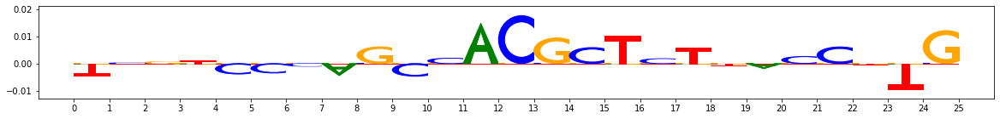

Matches to pattern 1


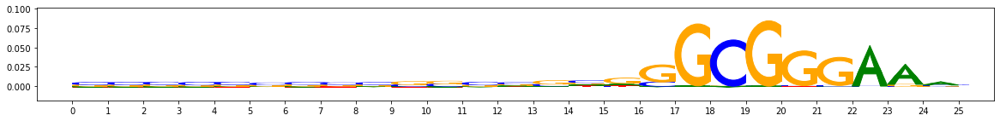

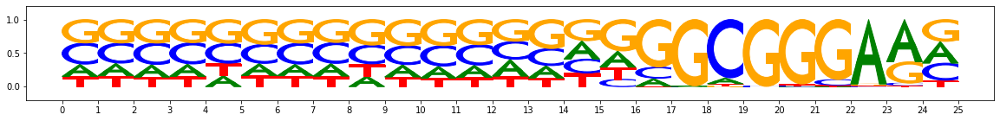

MotifMatchWithImportance(patternidx=1, patternidx_rank=0, total_importance=0.11231798474909738, exampleidx=9, start=213, end=238, is_revcomp=True, seqlet_orig_start=205, seqlet_orig_end=230, seqlet_orig_revcomp=False, aggregate_sim=0.35586975856152314, mod_delta=0.00019671188916363407, mod_precision=0.8333333333333334, mod_percentile=0.32638888888888884, fann_perclasssum_perc=0.25416666666666665, fann_perclassavg_perc=0.11805555555555558)


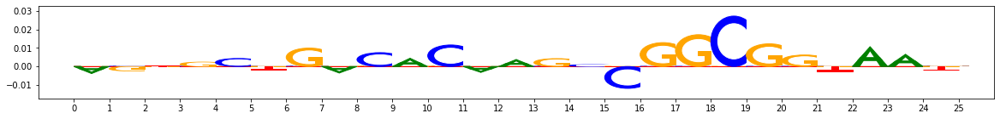

Matches to pattern 3


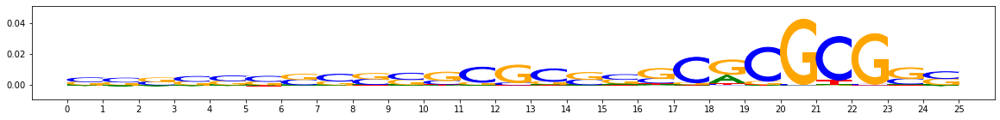

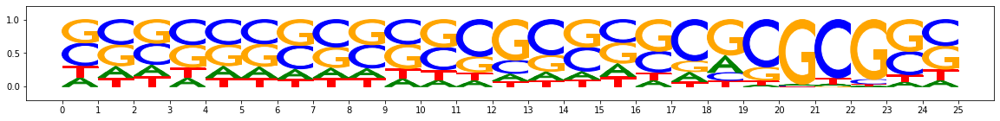

MotifMatchWithImportance(patternidx=3, patternidx_rank=0, total_importance=0.05700893508037552, exampleidx=9, start=160, end=185, is_revcomp=False, seqlet_orig_start=167, seqlet_orig_end=192, seqlet_orig_revcomp=False, aggregate_sim=0.2883849327717491, mod_delta=6.0102659961190855e-05, mod_precision=0.34574468085106386, mod_percentile=0.47571428571428576, fann_perclasssum_perc=0.3928571428571429, fann_perclassavg_perc=0.08714285714285719)


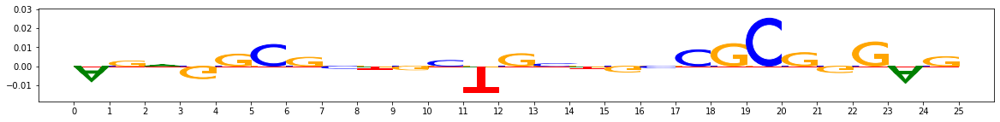

EXAMPLE IDX 12


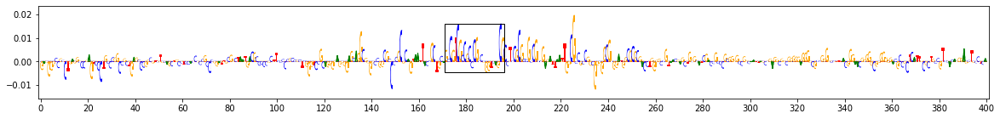

Matches to pattern 2


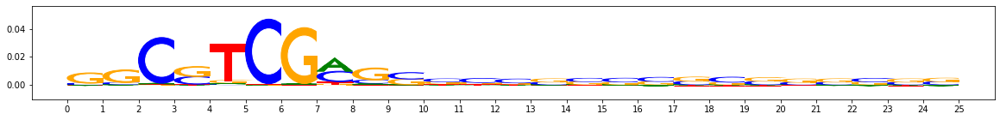

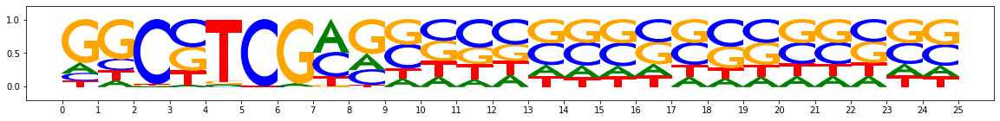

MotifMatchWithImportance(patternidx=2, patternidx_rank=0, total_importance=0.10650617392821005, exampleidx=12, start=171, end=196, is_revcomp=False, seqlet_orig_start=162, seqlet_orig_end=187, seqlet_orig_revcomp=False, aggregate_sim=0.3246593638664781, mod_delta=6.831294058827573e-05, mod_precision=0.38461538461538464, mod_percentile=0.13085399449035817, fann_perclasssum_perc=0.1763085399449036, fann_perclassavg_perc=0.5234159779614325)


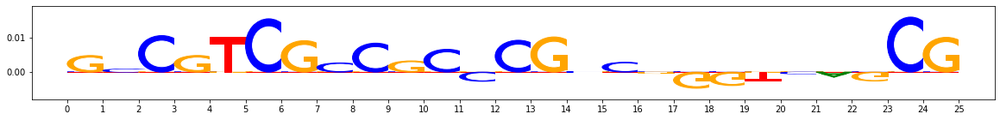

In [9]:
from modisco.visualization import viz_sequence

#visualize the matches
for exampleidx in list(sorted(exampleidx_to_matches.keys()))[:10]:
    print("EXAMPLE IDX",exampleidx)
    matches = exampleidx_to_matches[exampleidx]
    
    viz_sequence.plot_weights(
        contrib_scores[exampleidx],
        highlight={'black': [
            (max(x.start,0), min(x.end,len(contrib_scores[exampleidx])))
             for x in matches]},
        subticks_frequency=20)
    
    for i in range(len(orig_patterns)):
        matches_to_pattern = [x for x in matches if x.patternidx==i]
        if (len(matches_to_pattern) > 0):
            print("Matches to pattern",i)
            viz_sequence.plot_weights(hit_scorer.seqlet_scorer.class_patterns[i]["task0_contrib_scores"].fwd)
            viz_sequence.plot_weights(hit_scorer.seqlet_scorer.class_patterns[i]["sequence"].fwd)
            for match in matches_to_pattern:
                print(match)
                if (match.is_revcomp==False):
                    viz_sequence.plot_weights(contrib_scores[exampleidx][match.start:match.end])
                else:
                    viz_sequence.plot_weights(contrib_scores[exampleidx][match.start:match.end][::-1,::-1])


Pattern idx: 0


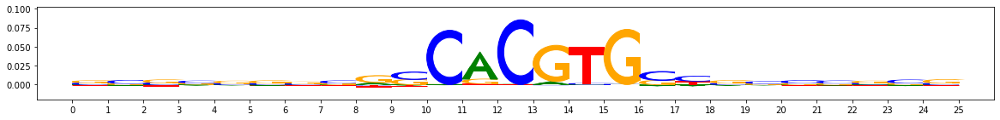

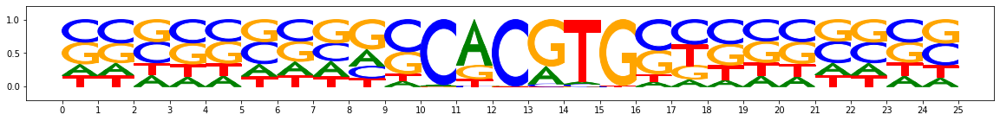

Pattern idx: 1


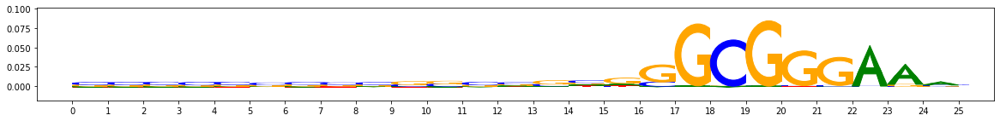

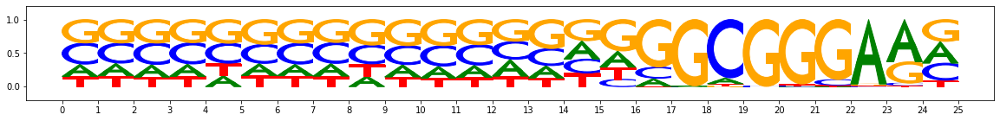

Pattern idx: 2


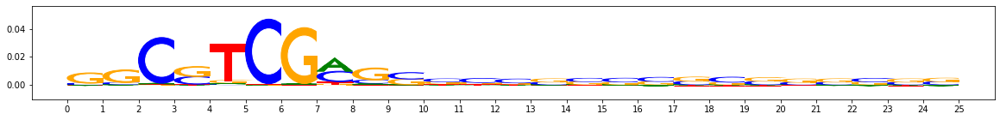

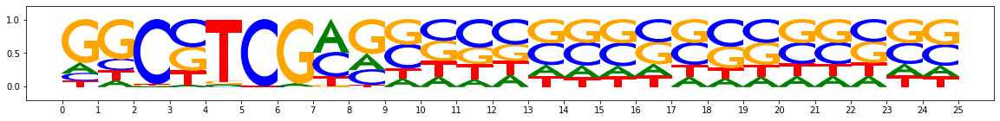

Pattern idx: 3


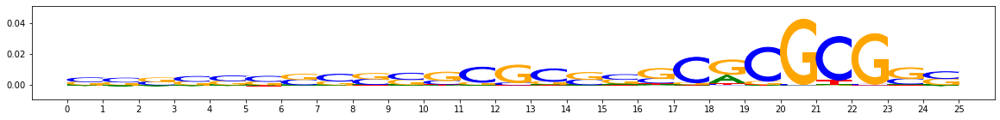

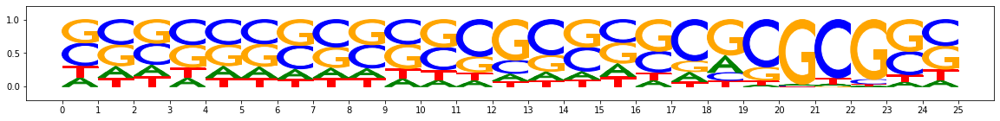

Pattern idx: 4


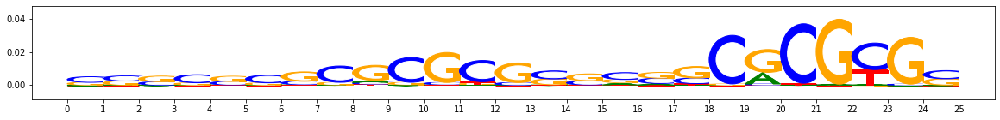

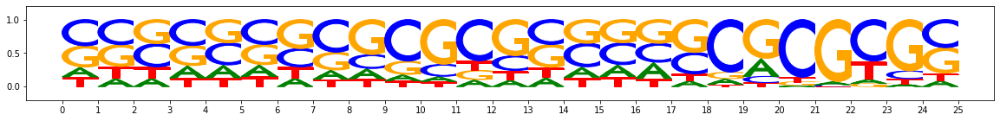

Pattern idx: 5


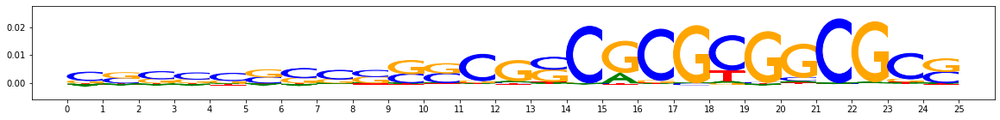

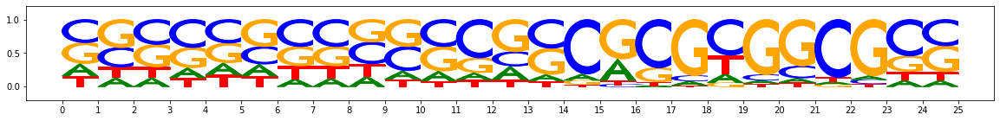

Pattern idx: 6


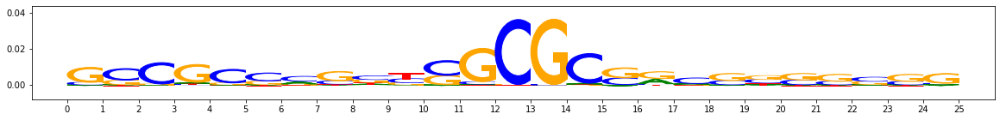

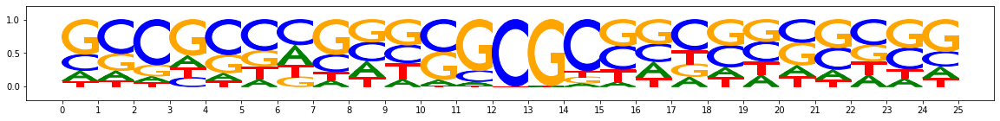

Pattern idx: 7


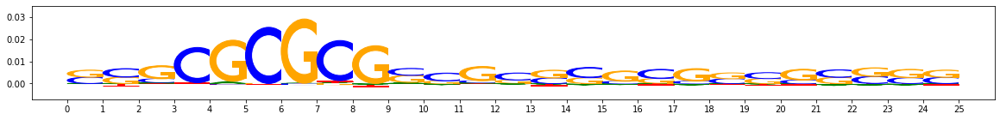

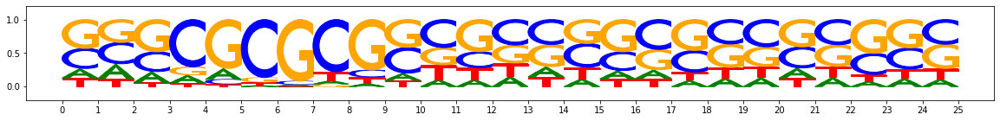

Pattern idx: 8


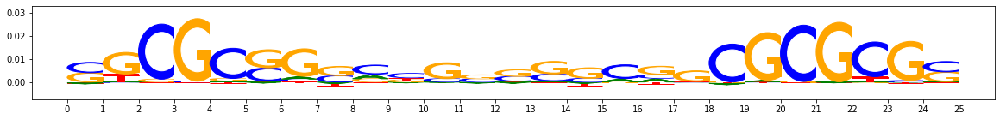

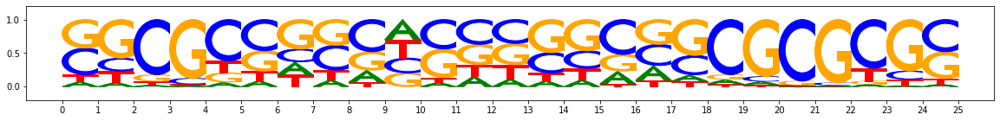

Pattern idx: 9


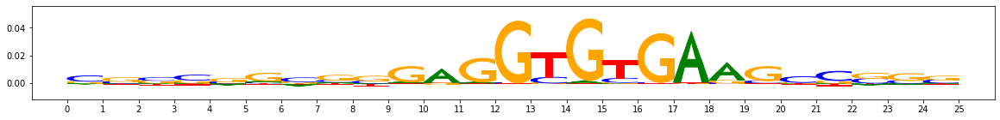

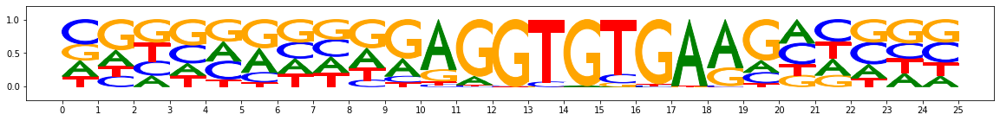

Pattern idx: 10


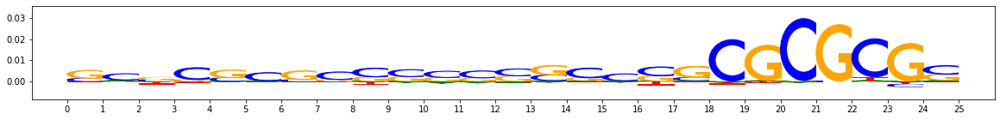

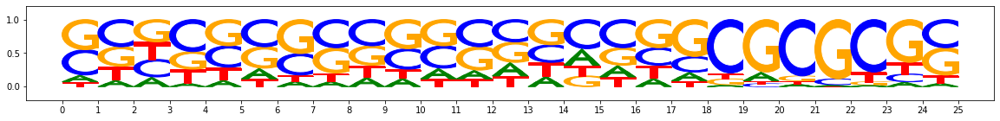

Pattern idx: 11


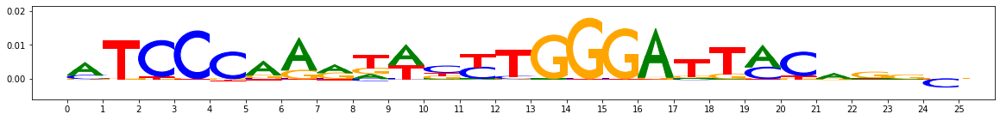

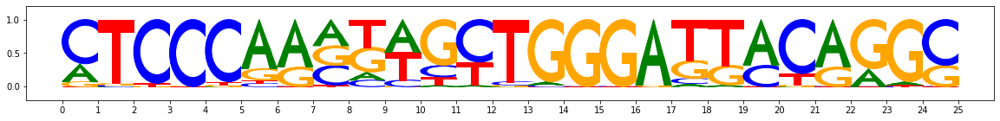

In [10]:
from modisco.visualization import viz_sequence

for patternidx,pattern in enumerate(hit_scorer.seqlet_scorer.class_patterns):
    print("Pattern idx:",patternidx)
    viz_sequence.plot_weights(pattern["task0_contrib_scores"].fwd)
    viz_sequence.plot_weights(pattern["sequence"].fwd)

In [11]:
#Test the seqlet scorer. Let's see what happens to the assignment of seqlets
# from pattern 0

seqletmatches_pattern0,patternidx_to_matches_forpattern0seqlets,_ = hit_scorer.seqlet_scorer(
    hit_scorer.trimmed_subclustered_patterns[0].seqlets)


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:   29.5s
[Parallel(n_jobs=10)]: Done 1230 tasks      | elapsed:   45.7s
[Parallel(n_jobs=10)]: Done 1780 tasks      | elapsed:  1.1min
[Parallel(n_jobs=10)]: Done 2430 tasks      | elapsed:  1.5min
[Parallel(n_jobs=10)]: Done 3180 tasks      | elapsed:  1.9min
[Parallel(n_jobs=10)]: Done 4030 tasks      | elapsed:  2.5min
[Parallel(n_jobs=10)]: Done 4980 tasks      | elapsed:  3.0min
[Parallel(n_jobs=10)]: Done 5156 out of 5156 | elapsed:  3.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 5156 out of 5156 | elapsed:   27.0s finished


Constructing csr matrix...
csr matrix made in 1.8997972011566162 s
Batching in slices of size 5156


100%|██████████| 1/1 [00:10<00:00, 10.04s/it]


Launching nearest neighbors affmat calculation job
MEMORY 4.13923328
Parallel runs completed
MEMORY 4.139986944
Job completed in: 99.58 s
MEMORY 4.052209664
Launching nearest neighbors affmat calculation job
MEMORY 4.052209664
Parallel runs completed
MEMORY 4.063338496
Job completed in: 98.59 s
MEMORY 4.063338496
Removed 4 duplicates


Pattern idx: 0
Num matches: 4753 out of 5156
Original pattern:


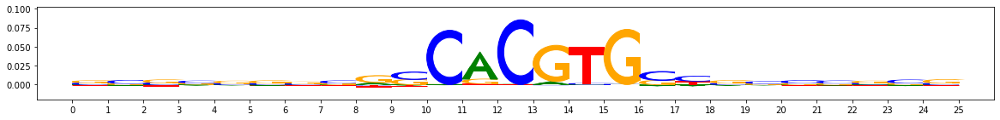

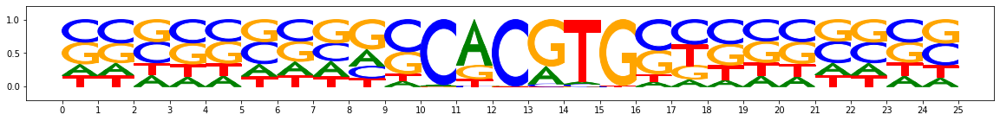

From assigned seqlets:


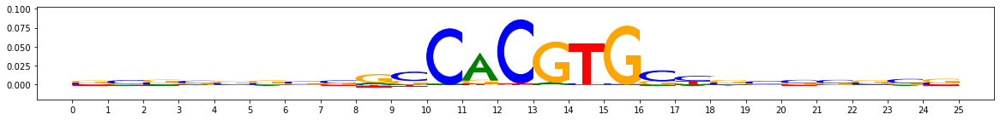

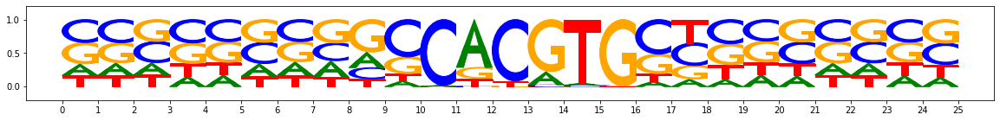

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=2668, start=151, end=176, is_revcomp=True, seqlet_orig_start=151, seqlet_orig_end=176, seqlet_orig_revcomp=True, aggregate_sim=0.46128637732309463, mod_delta=0.00020786518376870574, mod_precision=0.8490028490028491, mod_percentile=0.47452547452547456, fann_perclasssum_perc=0.6413586413586414, fann_perclassavg_perc=0.6373626373626373)
Original seqlet:


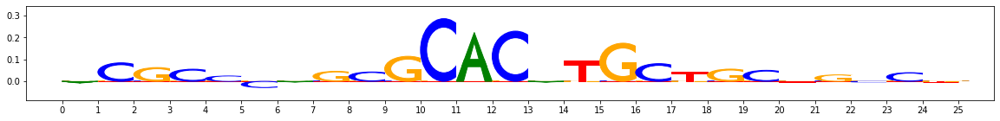

Aligned seqlet


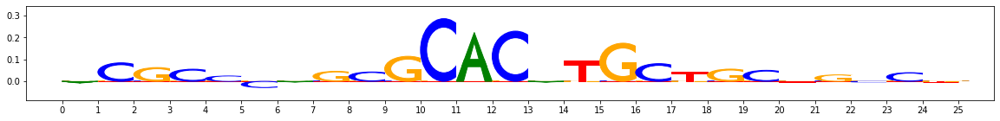

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=3289, start=168, end=193, is_revcomp=True, seqlet_orig_start=168, seqlet_orig_end=193, seqlet_orig_revcomp=True, aggregate_sim=0.5655010429986488, mod_delta=0.00022091557001265431, mod_precision=0.8490028490028491, mod_percentile=0.5584415584415585, fann_perclasssum_perc=0.964035964035964, fann_perclassavg_perc=0.9310689310689311)
Original seqlet:


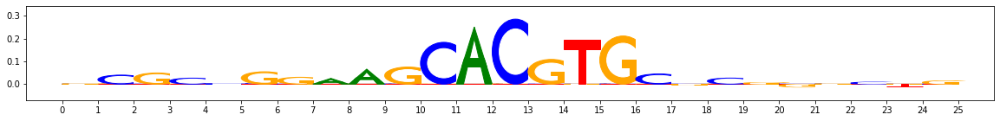

Aligned seqlet


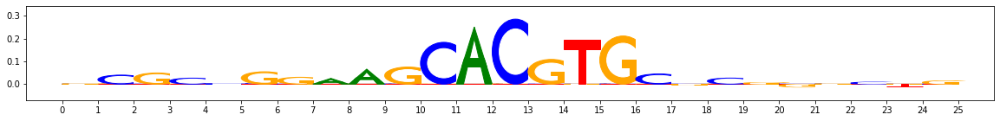

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=9670, start=155, end=180, is_revcomp=True, seqlet_orig_start=155, seqlet_orig_end=180, seqlet_orig_revcomp=True, aggregate_sim=0.4780465924813201, mod_delta=0.0001839343276113523, mod_precision=0.8490028490028491, mod_percentile=0.3646353646353646, fann_perclasssum_perc=0.5794205794205793, fann_perclassavg_perc=0.6943056943056943)
Original seqlet:


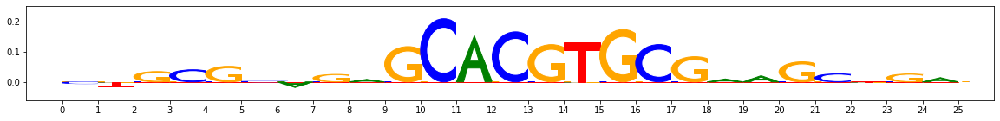

Aligned seqlet


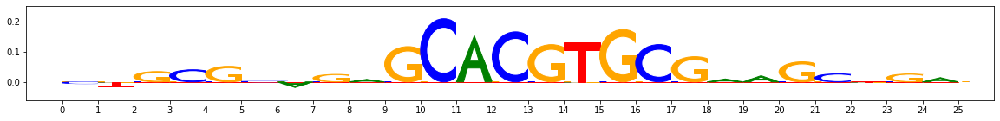

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=471, start=177, end=202, is_revcomp=True, seqlet_orig_start=177, seqlet_orig_end=202, seqlet_orig_revcomp=True, aggregate_sim=0.5221424864843722, mod_delta=0.0002082684769605865, mod_precision=0.8490028490028491, mod_percentile=0.48151848151848153, fann_perclasssum_perc=0.6963036963036964, fann_perclassavg_perc=0.6643356643356644)
Original seqlet:


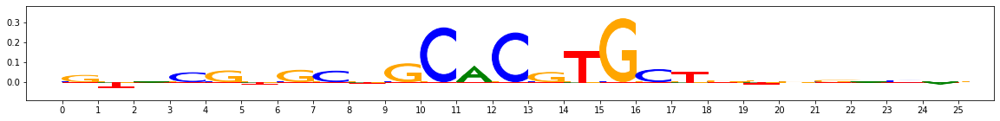

Aligned seqlet


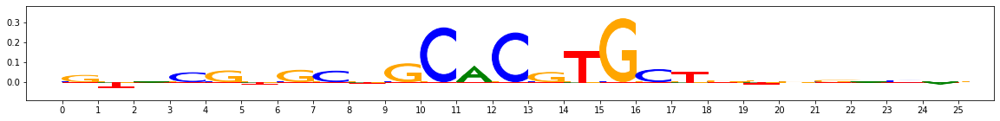

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=12247, start=161, end=186, is_revcomp=True, seqlet_orig_start=160, seqlet_orig_end=185, seqlet_orig_revcomp=False, aggregate_sim=0.4663933972503957, mod_delta=0.0002101272148597537, mod_precision=0.8490028490028491, mod_percentile=0.48651348651348647, fann_perclasssum_perc=0.7592407592407593, fann_perclassavg_perc=0.7232767232767232)
Original seqlet:


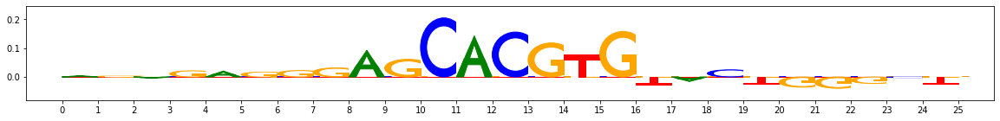

Aligned seqlet


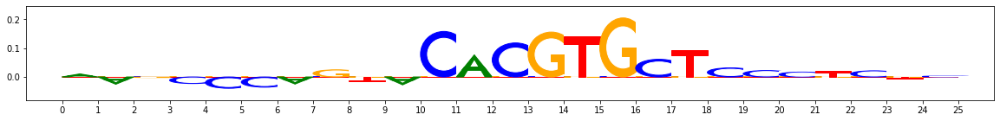

Pattern idx: 1
Num matches: 31 out of 5156
Original pattern:


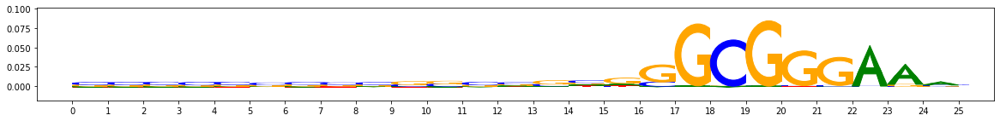

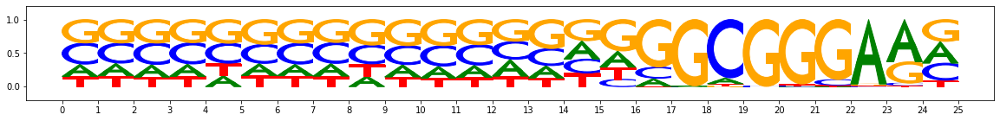

From assigned seqlets:


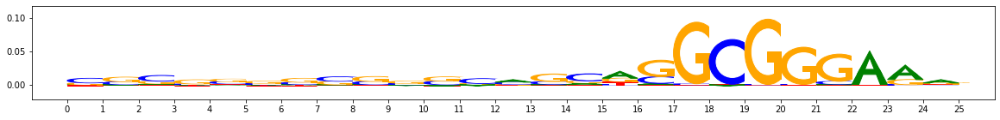

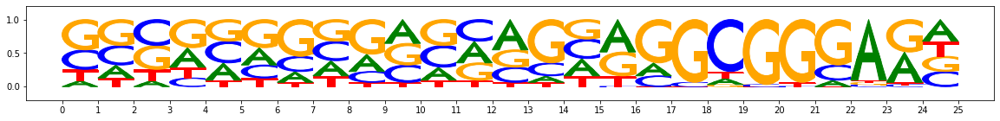

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=5001, start=224, end=249, is_revcomp=True, seqlet_orig_start=223, seqlet_orig_end=248, seqlet_orig_revcomp=True, aggregate_sim=0.4005481630279295, mod_delta=0.00023525138375167525, mod_precision=0.919047619047619, mod_percentile=0.5375, fann_perclasssum_perc=0.38611111111111107, fann_perclassavg_perc=0.19444444444444442)
Original seqlet:


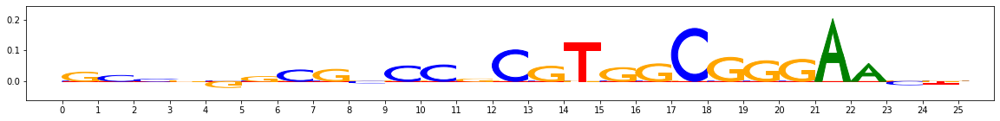

Aligned seqlet


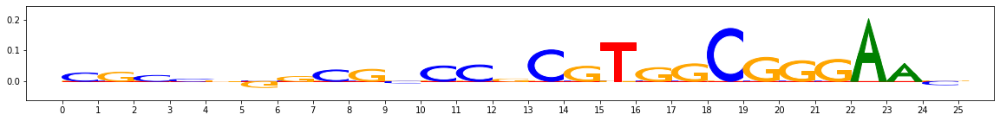

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=199, start=176, end=201, is_revcomp=False, seqlet_orig_start=183, seqlet_orig_end=208, seqlet_orig_revcomp=True, aggregate_sim=0.5498040258874666, mod_delta=0.0002694280062555113, mod_precision=0.9484536082474226, mod_percentile=0.8388888888888889, fann_perclasssum_perc=0.8694444444444445, fann_perclassavg_perc=0.8402777777777778)
Original seqlet:


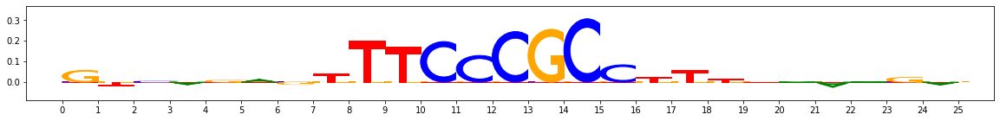

Aligned seqlet


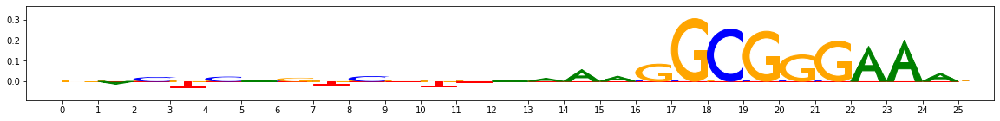

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=1252, start=203, end=228, is_revcomp=False, seqlet_orig_start=210, seqlet_orig_end=235, seqlet_orig_revcomp=True, aggregate_sim=0.4232681465318013, mod_delta=0.00011500748702460061, mod_precision=0.5454545454545454, mod_percentile=0.14166666666666672, fann_perclasssum_perc=0.13749999999999996, fann_perclassavg_perc=0.3305555555555556)
Original seqlet:


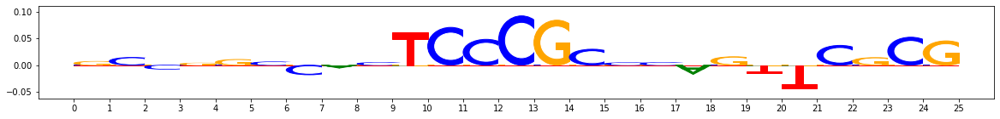

Aligned seqlet


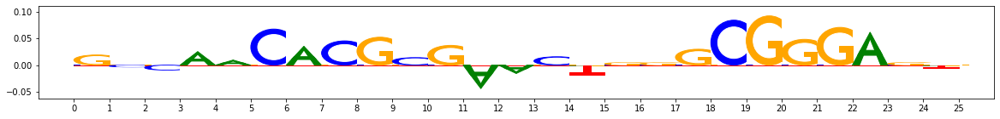

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=12931, start=175, end=200, is_revcomp=False, seqlet_orig_start=182, seqlet_orig_end=207, seqlet_orig_revcomp=True, aggregate_sim=0.5227028097144018, mod_delta=0.0002520416147483685, mod_precision=0.9484536082474226, mod_percentile=0.675, fann_perclasssum_perc=0.6819444444444445, fann_perclassavg_perc=0.6305555555555555)
Original seqlet:


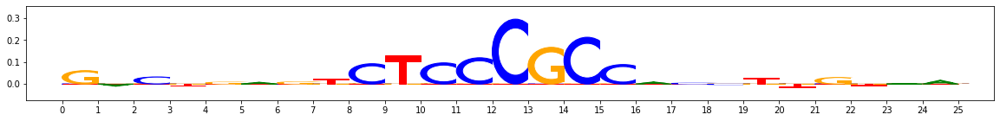

Aligned seqlet


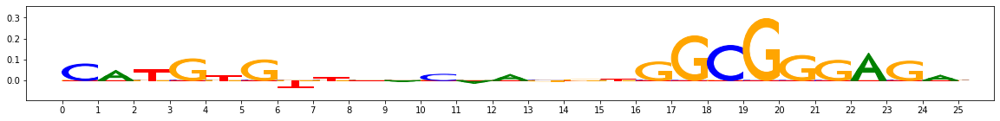

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=14148, start=225, end=250, is_revcomp=False, seqlet_orig_start=231, seqlet_orig_end=256, seqlet_orig_revcomp=False, aggregate_sim=0.5517572058297998, mod_delta=0.00024096300769781915, mod_precision=0.919047619047619, mod_percentile=0.5805555555555555, fann_perclasssum_perc=0.7680555555555555, fann_perclassavg_perc=0.8611111111111112)
Original seqlet:


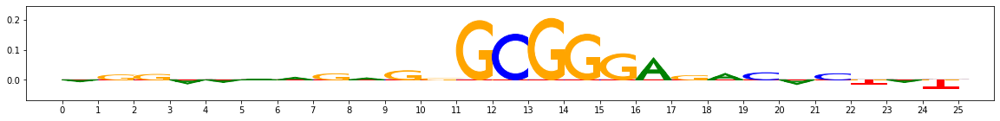

Aligned seqlet


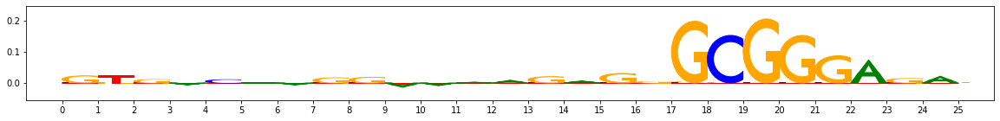

Pattern idx: 2
Num matches: 37 out of 5156
Original pattern:


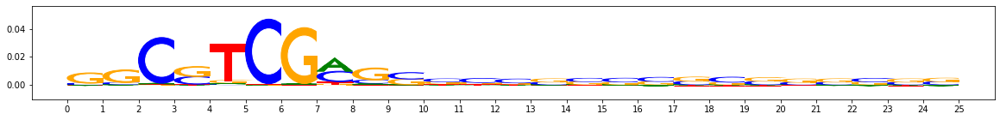

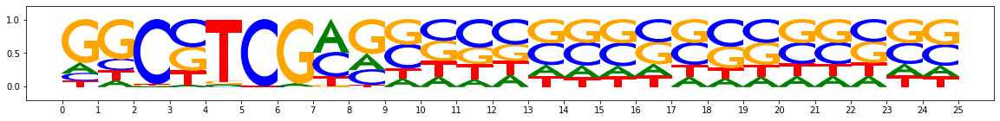

From assigned seqlets:


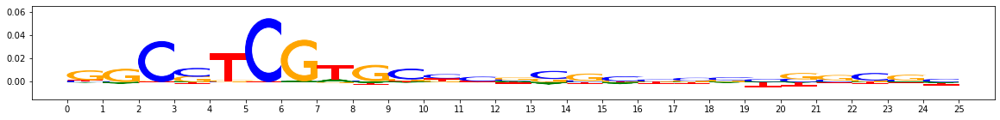

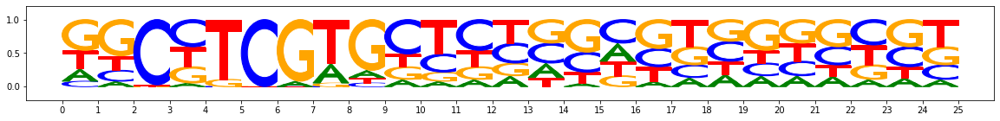

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=902, start=136, end=161, is_revcomp=False, seqlet_orig_start=122, seqlet_orig_end=147, seqlet_orig_revcomp=True, aggregate_sim=0.27691026674255576, mod_delta=9.698059878938291e-05, mod_precision=0.6470588235294118, mod_percentile=0.18595041322314054, fann_perclasssum_perc=0.19834710743801653, fann_perclassavg_perc=0.04820936639118456)
Original seqlet:


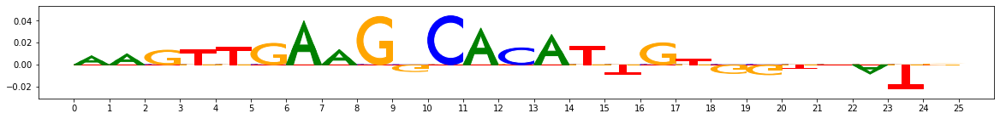

Aligned seqlet


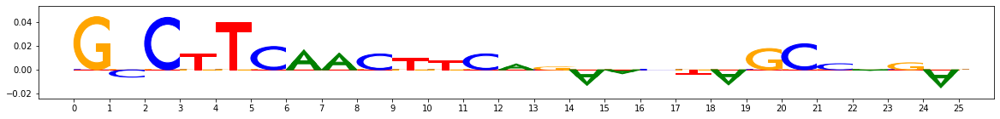

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=17039, start=170, end=195, is_revcomp=True, seqlet_orig_start=177, seqlet_orig_end=202, seqlet_orig_revcomp=True, aggregate_sim=0.4274815496561406, mod_delta=0.0002843660194968519, mod_precision=0.9948186528497409, mod_percentile=0.8429752066115702, fann_perclasssum_perc=0.940771349862259, fann_perclassavg_perc=0.7988980716253443)
Original seqlet:


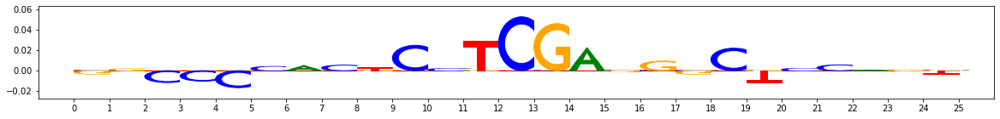

Aligned seqlet


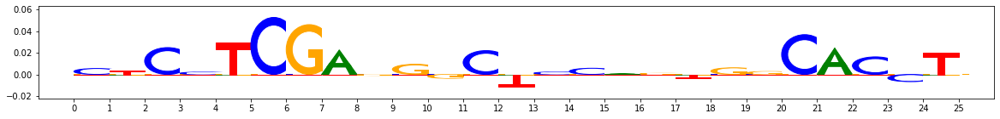

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=9479, start=186, end=211, is_revcomp=False, seqlet_orig_start=184, seqlet_orig_end=209, seqlet_orig_revcomp=False, aggregate_sim=0.3068895992385024, mod_delta=0.0001335414433565304, mod_precision=0.8666666666666667, mod_percentile=0.27685950413223137, fann_perclasssum_perc=0.31818181818181823, fann_perclassavg_perc=0.18181818181818177)
Original seqlet:


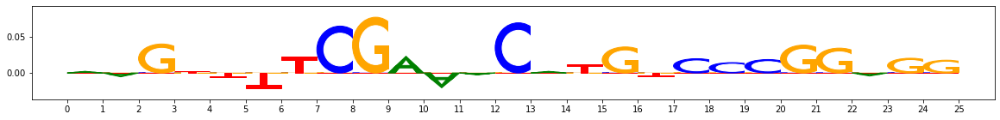

Aligned seqlet


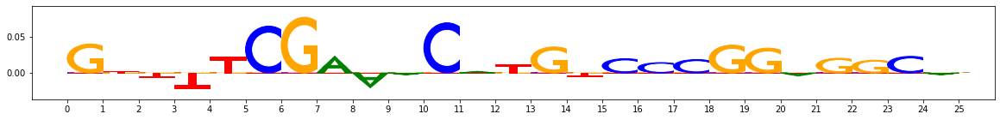

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=3190, start=188, end=213, is_revcomp=False, seqlet_orig_start=174, seqlet_orig_end=199, seqlet_orig_revcomp=True, aggregate_sim=0.3702522480213984, mod_delta=4.038736897465256e-05, mod_precision=0.20588235294117646, mod_percentile=0.09641873278236912, fann_perclasssum_perc=0.14325068870523416, fann_perclassavg_perc=0.6707988980716253)
Original seqlet:


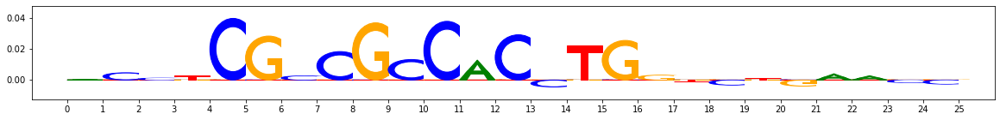

Aligned seqlet


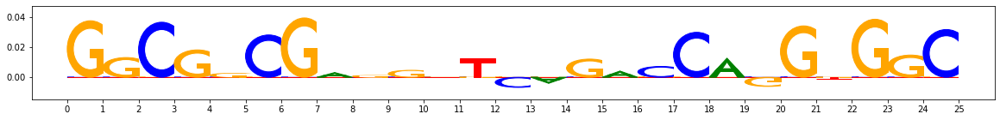

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=3811, start=230, end=255, is_revcomp=False, seqlet_orig_start=223, seqlet_orig_end=248, seqlet_orig_revcomp=False, aggregate_sim=0.312500364616832, mod_delta=2.9213560928499253e-05, mod_precision=0.10526315789473684, mod_percentile=0.07851239669421484, fann_perclasssum_perc=0.11157024793388426, fann_perclassavg_perc=0.31818181818181823)
Original seqlet:


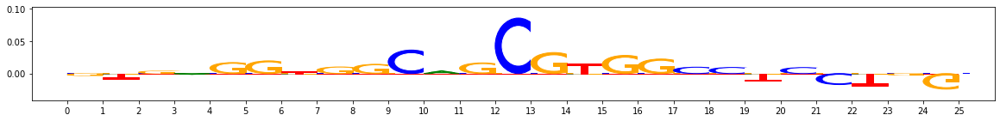

Aligned seqlet


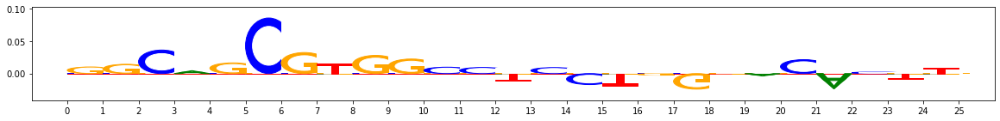

Pattern idx: 3
Num matches: 150 out of 5156
Original pattern:


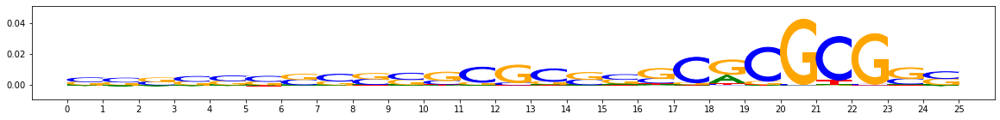

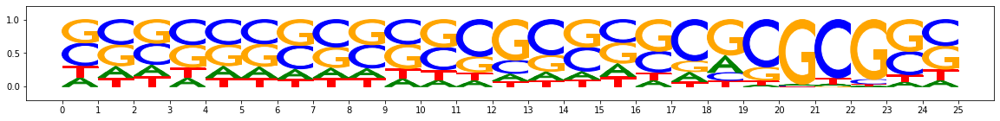

From assigned seqlets:


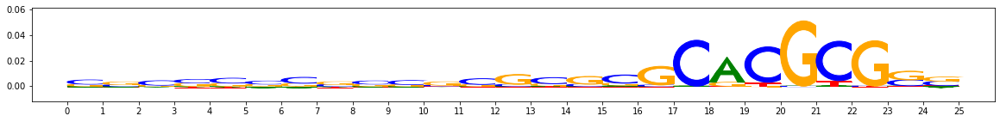

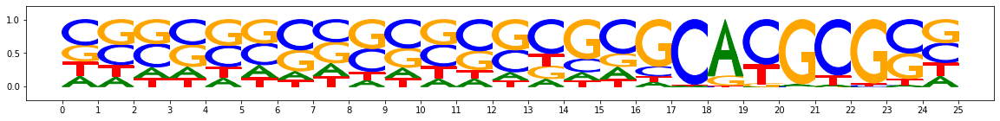

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=8188, start=230, end=255, is_revcomp=True, seqlet_orig_start=230, seqlet_orig_end=255, seqlet_orig_revcomp=False, aggregate_sim=0.292531807619797, mod_delta=4.995430798781767e-05, mod_precision=0.34574468085106386, mod_percentile=0.3985714285714286, fann_perclasssum_perc=0.32999999999999996, fann_perclassavg_perc=0.13714285714285712)
Original seqlet:


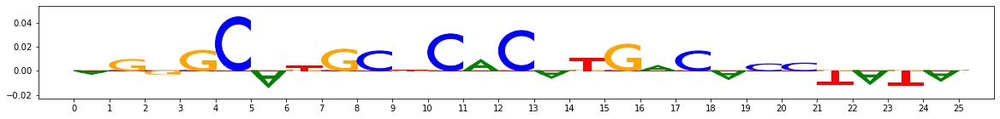

Aligned seqlet


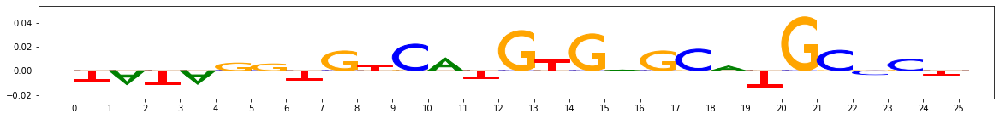

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=3289, start=218, end=243, is_revcomp=False, seqlet_orig_start=226, seqlet_orig_end=251, seqlet_orig_revcomp=True, aggregate_sim=0.3818892254797937, mod_delta=7.839134676282232e-05, mod_precision=0.5158730158730159, mod_percentile=0.6357142857142857, fann_perclasssum_perc=0.7, fann_perclassavg_perc=0.5828571428571429)
Original seqlet:


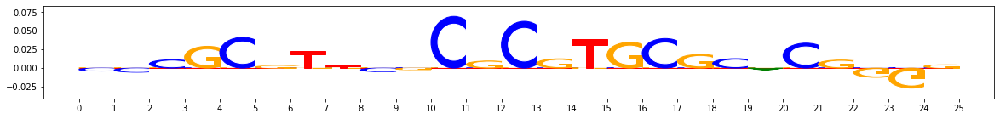

Aligned seqlet


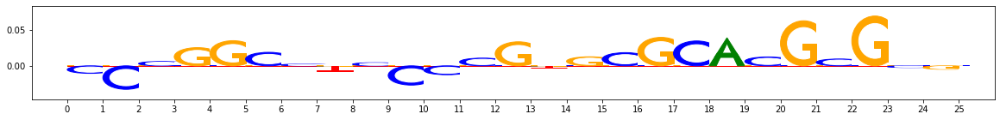

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=11508, start=171, end=196, is_revcomp=True, seqlet_orig_start=163, seqlet_orig_end=188, seqlet_orig_revcomp=False, aggregate_sim=0.3484871015193695, mod_delta=6.251105361270215e-05, mod_precision=0.34574468085106386, mod_percentile=0.48857142857142855, fann_perclasssum_perc=0.44571428571428573, fann_perclassavg_perc=0.15428571428571425)
Original seqlet:


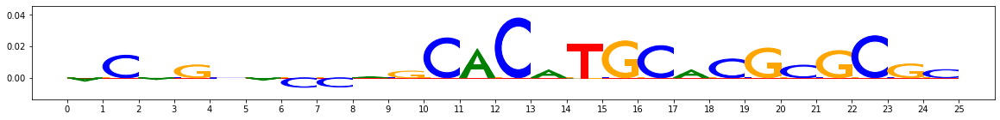

Aligned seqlet


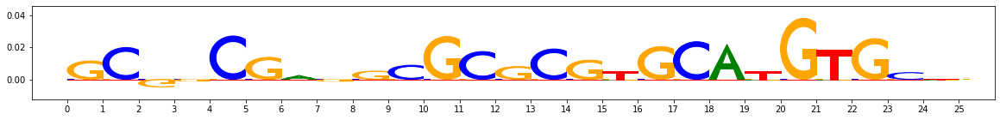

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=7648, start=174, end=199, is_revcomp=False, seqlet_orig_start=182, seqlet_orig_end=207, seqlet_orig_revcomp=True, aggregate_sim=0.4012864237242529, mod_delta=5.922116021030635e-05, mod_precision=0.34574468085106386, mod_percentile=0.47285714285714286, fann_perclasssum_perc=0.5514285714285714, fann_perclassavg_perc=0.6557142857142857)
Original seqlet:


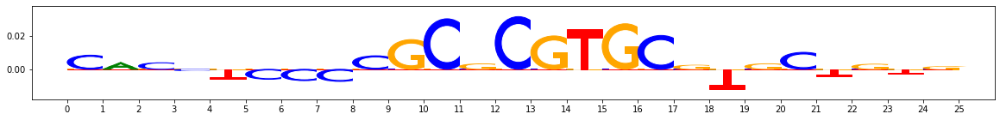

Aligned seqlet


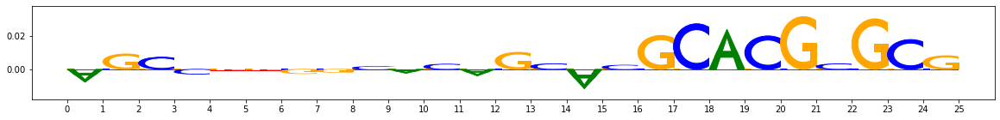

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=7980, start=191, end=216, is_revcomp=True, seqlet_orig_start=182, seqlet_orig_end=207, seqlet_orig_revcomp=True, aggregate_sim=0.3805334032571509, mod_delta=8.976128508066647e-05, mod_precision=0.5789473684210527, mod_percentile=0.7442857142857142, fann_perclasssum_perc=0.8028571428571428, fann_perclassavg_perc=0.3442857142857143)
Original seqlet:


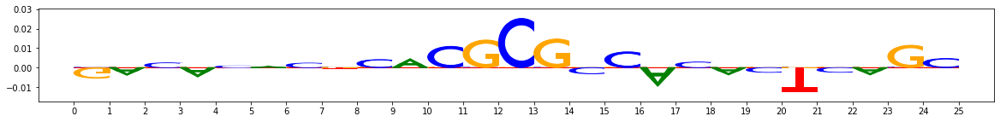

Aligned seqlet


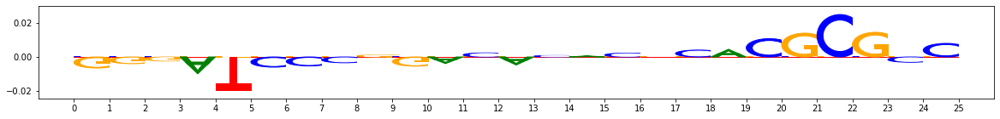

Pattern idx: 4
Num matches: 125 out of 5156
Original pattern:


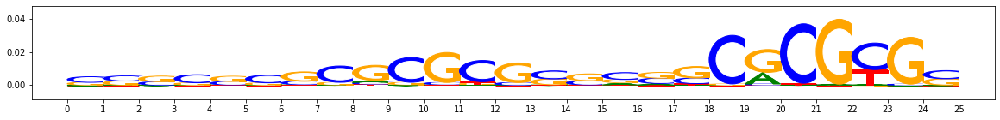

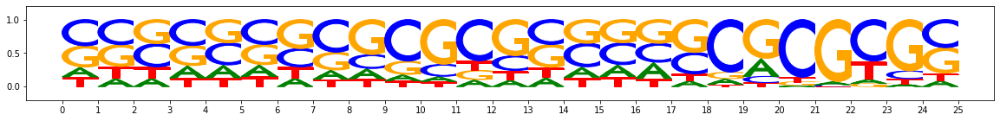

From assigned seqlets:


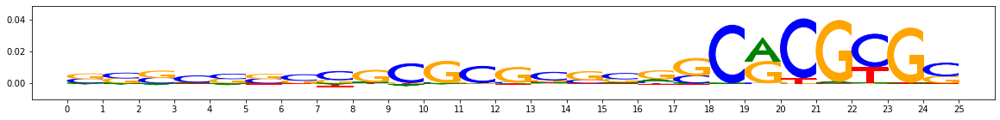

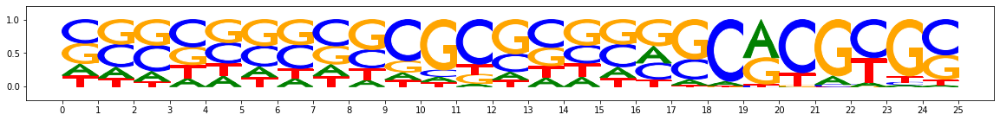

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=14933, start=260, end=285, is_revcomp=False, seqlet_orig_start=268, seqlet_orig_end=293, seqlet_orig_revcomp=False, aggregate_sim=0.43006660211736086, mod_delta=0.00012402593724116607, mod_precision=0.726027397260274, mod_percentile=0.8481481481481481, fann_perclasssum_perc=0.8481481481481481, fann_perclassavg_perc=0.42407407407407405)
Original seqlet:


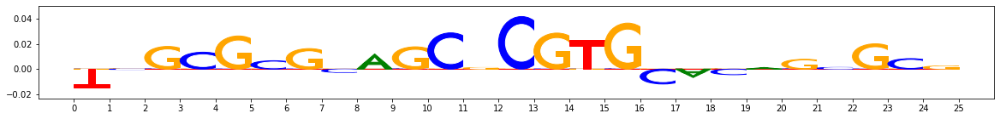

Aligned seqlet


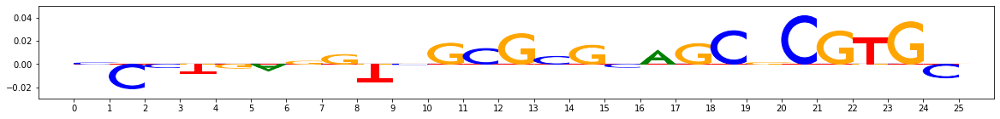

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=57, start=115, end=140, is_revcomp=False, seqlet_orig_start=122, seqlet_orig_end=147, seqlet_orig_revcomp=True, aggregate_sim=0.30205787354602553, mod_delta=4.35546932738066e-05, mod_precision=0.2, mod_percentile=0.30925925925925923, fann_perclasssum_perc=0.29814814814814816, fann_perclassavg_perc=0.12962962962962965)
Original seqlet:


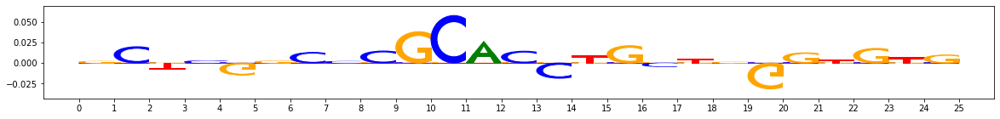

Aligned seqlet


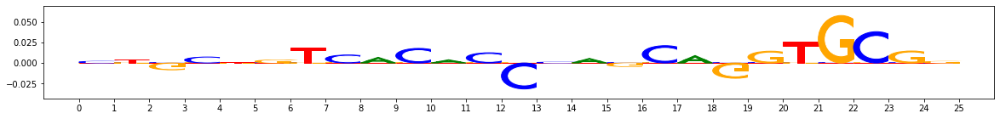

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=16689, start=102, end=127, is_revcomp=True, seqlet_orig_start=94, seqlet_orig_end=119, seqlet_orig_revcomp=True, aggregate_sim=0.32346992050516155, mod_delta=4.807487251236008e-05, mod_precision=0.24, mod_percentile=0.337037037037037, fann_perclasssum_perc=0.30925925925925923, fann_perclassavg_perc=0.18888888888888888)
Original seqlet:


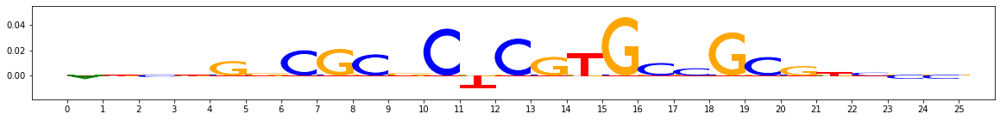

Aligned seqlet


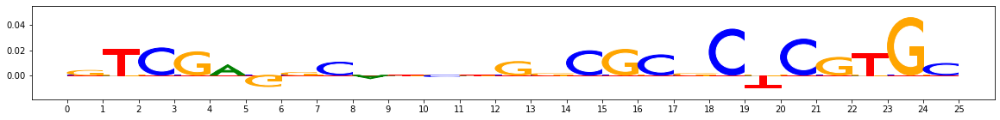

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=16188, start=137, end=162, is_revcomp=False, seqlet_orig_start=146, seqlet_orig_end=171, seqlet_orig_revcomp=True, aggregate_sim=0.34930080745179226, mod_delta=3.176921610524438e-05, mod_precision=0.12883435582822086, mod_percentile=0.26296296296296295, fann_perclasssum_perc=0.26296296296296295, fann_perclassavg_perc=0.31666666666666665)
Original seqlet:


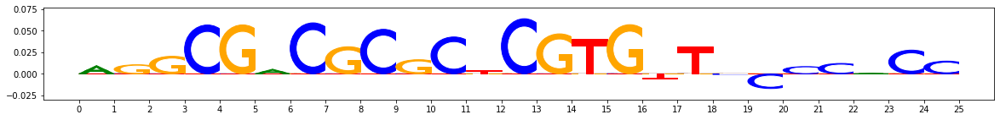

Aligned seqlet


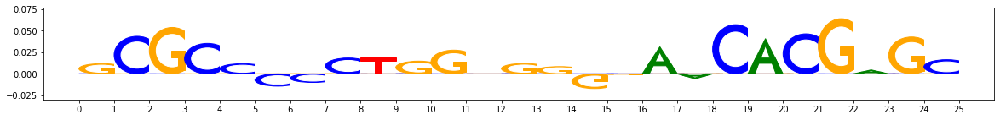

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=9653, start=187, end=212, is_revcomp=True, seqlet_orig_start=178, seqlet_orig_end=203, seqlet_orig_revcomp=False, aggregate_sim=0.44236972535664165, mod_delta=7.235318264501621e-05, mod_precision=0.4, mod_percentile=0.43518518518518523, fann_perclasssum_perc=0.512962962962963, fann_perclassavg_perc=0.6462962962962964)
Original seqlet:


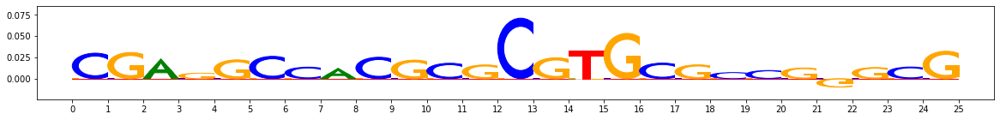

Aligned seqlet


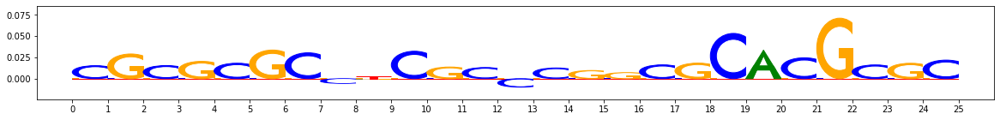

Pattern idx: 5
Num matches: 52 out of 5156
Original pattern:


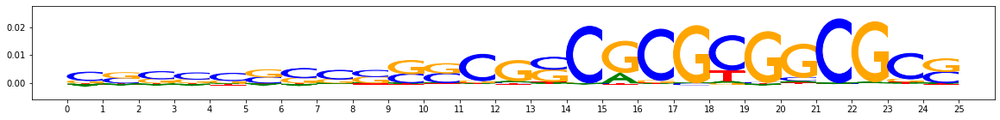

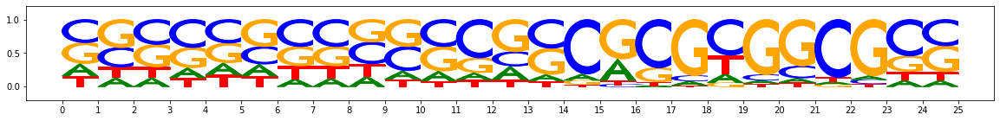

From assigned seqlets:


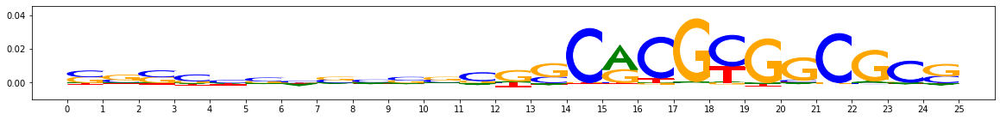

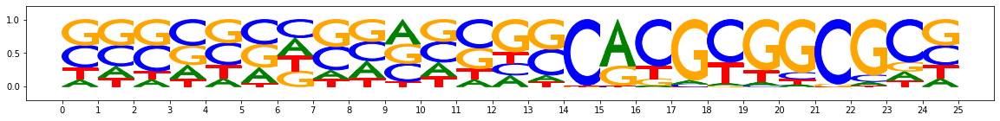

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=6598, start=180, end=205, is_revcomp=True, seqlet_orig_start=176, seqlet_orig_end=201, seqlet_orig_revcomp=True, aggregate_sim=0.37372983479029004, mod_delta=4.0117958861322125e-05, mod_precision=0.3037037037037037, mod_percentile=0.31656804733727806, fann_perclasssum_perc=0.272189349112426, fann_perclassavg_perc=0.242603550295858)
Original seqlet:


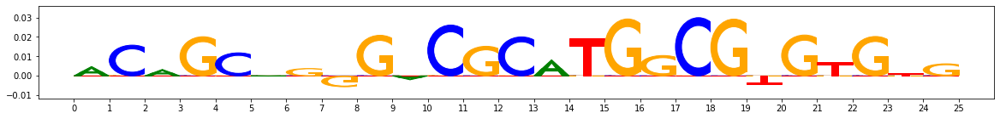

Aligned seqlet


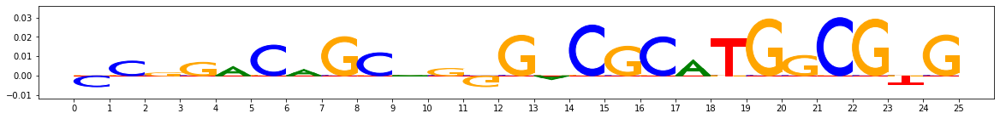

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=7157, start=239, end=264, is_revcomp=True, seqlet_orig_start=235, seqlet_orig_end=260, seqlet_orig_revcomp=True, aggregate_sim=0.3774971645830972, mod_delta=5.874549904129085e-05, mod_precision=0.3557692307692308, mod_percentile=0.5207100591715976, fann_perclasssum_perc=0.6124260355029586, fann_perclassavg_perc=0.16863905325443784)
Original seqlet:


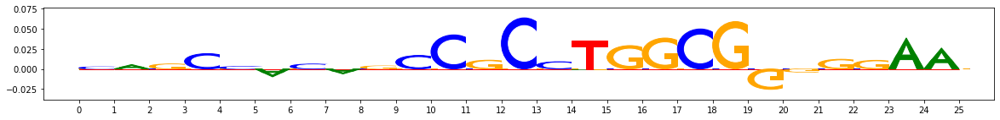

Aligned seqlet


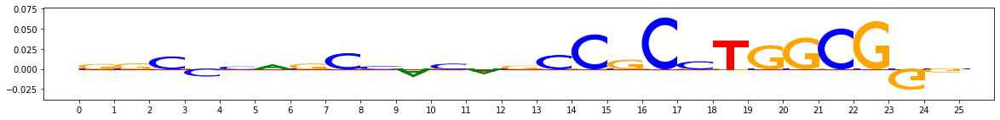

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=10557, start=119, end=144, is_revcomp=False, seqlet_orig_start=124, seqlet_orig_end=149, seqlet_orig_revcomp=True, aggregate_sim=0.388096036619413, mod_delta=5.9796611864690175e-05, mod_precision=0.4, mod_percentile=0.5266272189349113, fann_perclasssum_perc=0.6272189349112426, fann_perclassavg_perc=0.22781065088757402)
Original seqlet:


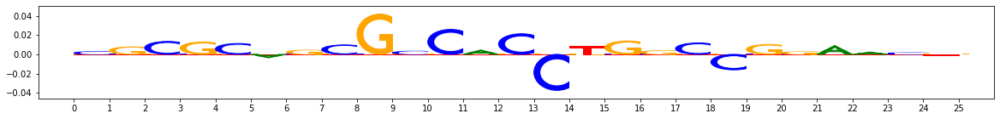

Aligned seqlet


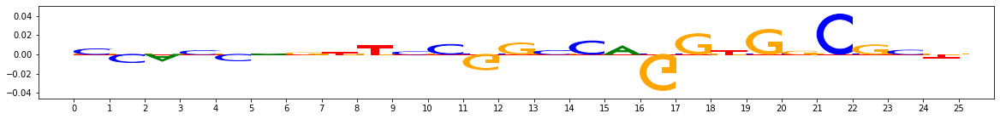

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=11628, start=184, end=209, is_revcomp=False, seqlet_orig_start=188, seqlet_orig_end=213, seqlet_orig_revcomp=False, aggregate_sim=0.46188873980966527, mod_delta=6.919518352216264e-05, mod_precision=0.4251968503937008, mod_percentile=0.6272189349112426, fann_perclasssum_perc=0.8550295857988166, fann_perclassavg_perc=0.7633136094674556)
Original seqlet:


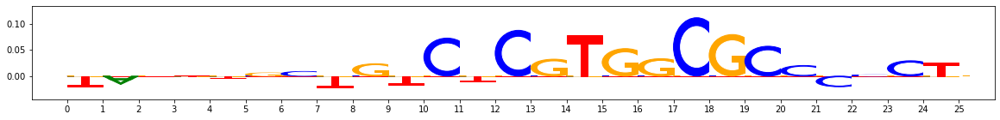

Aligned seqlet


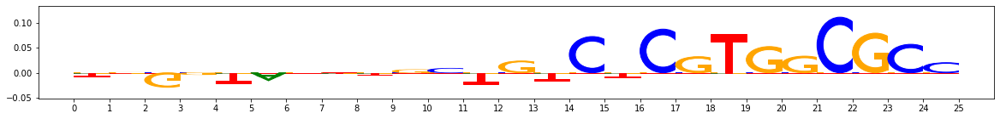

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=7580, start=271, end=296, is_revcomp=True, seqlet_orig_start=267, seqlet_orig_end=292, seqlet_orig_revcomp=True, aggregate_sim=0.4017580160731074, mod_delta=3.3659485918462454e-05, mod_precision=0.20967741935483872, mod_percentile=0.21301775147928992, fann_perclasssum_perc=0.44082840236686394, fann_perclassavg_perc=0.49408284023668636)
Original seqlet:


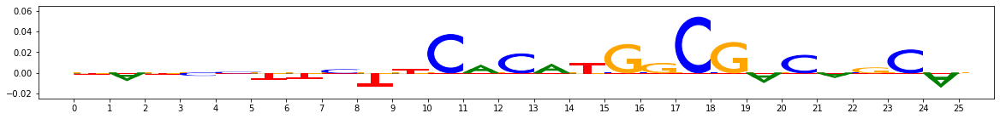

Aligned seqlet


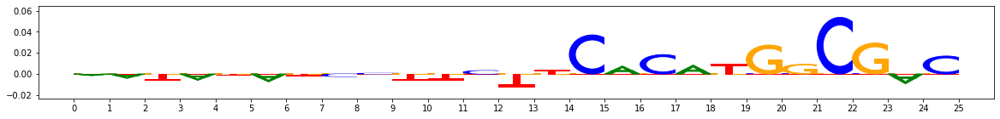

Pattern idx: 6
Num matches: 3 out of 5156
Original pattern:


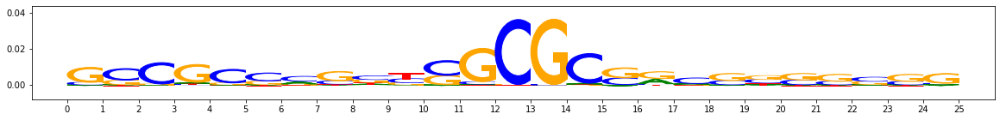

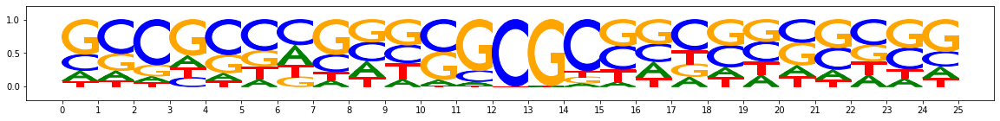

From assigned seqlets:


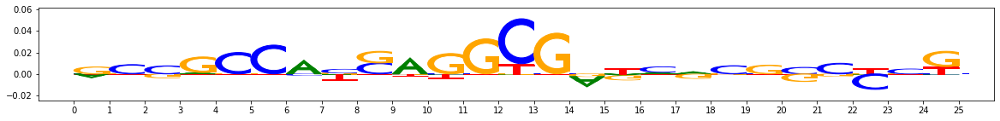

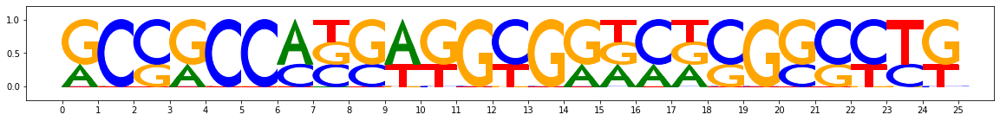

MotifMatch(patternidx=6, patternidx_rank=0, exampleidx=2741, start=173, end=198, is_revcomp=False, seqlet_orig_start=172, seqlet_orig_end=197, seqlet_orig_revcomp=True, aggregate_sim=0.29227012860024854, mod_delta=2.8894855836882674e-05, mod_precision=0.1702127659574468, mod_percentile=0.3472668810289389, fann_perclasssum_perc=0.28938906752411575, fann_perclassavg_perc=0.025723472668810254)
Original seqlet:


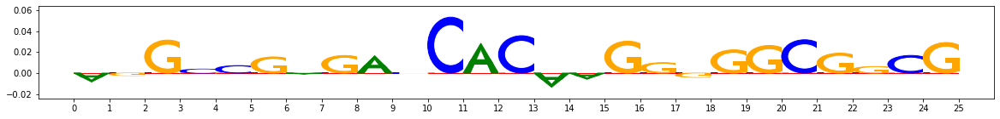

Aligned seqlet


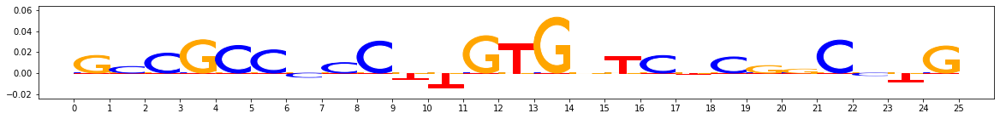

MotifMatch(patternidx=6, patternidx_rank=0, exampleidx=13505, start=225, end=250, is_revcomp=True, seqlet_orig_start=226, seqlet_orig_end=251, seqlet_orig_revcomp=False, aggregate_sim=0.3066719859574116, mod_delta=3.640308975320057e-05, mod_precision=0.22784810126582278, mod_percentile=0.46302250803858525, fann_perclasssum_perc=0.517684887459807, fann_perclassavg_perc=0.16398713826366562)
Original seqlet:


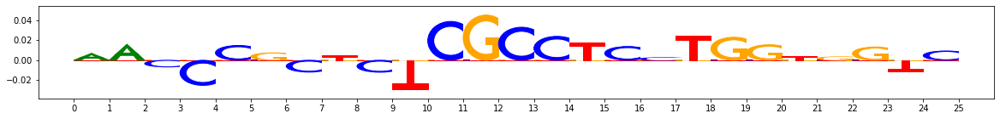

Aligned seqlet


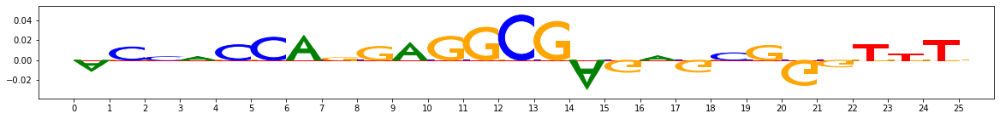

MotifMatch(patternidx=6, patternidx_rank=0, exampleidx=860, start=136, end=161, is_revcomp=True, seqlet_orig_start=136, seqlet_orig_end=161, seqlet_orig_revcomp=True, aggregate_sim=0.29876900663138106, mod_delta=3.5503555440406894e-05, mod_precision=0.22784810126582278, mod_percentile=0.4533762057877814, fann_perclasssum_perc=0.4662379421221865, fann_perclassavg_perc=0.10289389067524113)
Original seqlet:


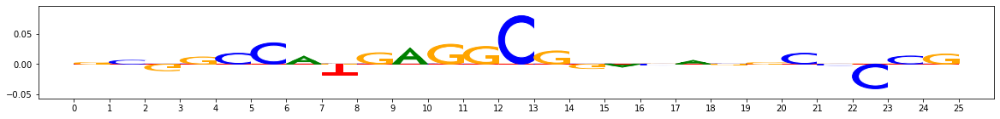

Aligned seqlet


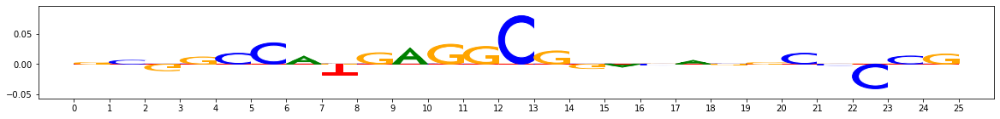

Pattern idx: 7
Num matches: 1 out of 5156
Original pattern:


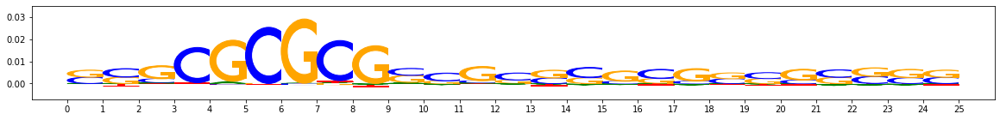

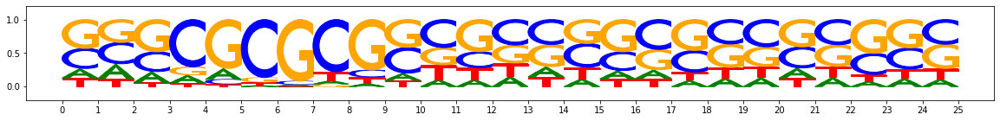

From assigned seqlets:


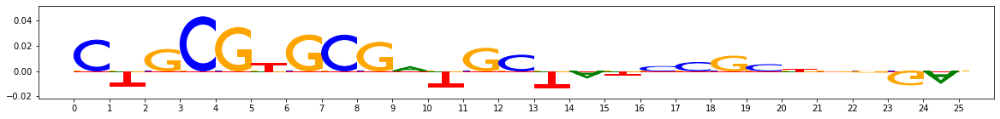

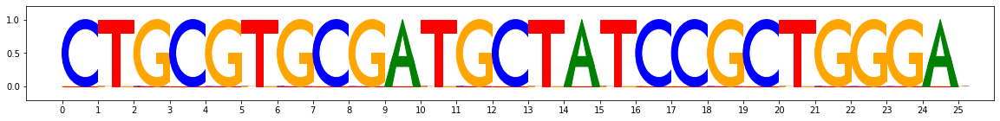

MotifMatch(patternidx=7, patternidx_rank=0, exampleidx=2506, start=155, end=180, is_revcomp=False, seqlet_orig_start=146, seqlet_orig_end=171, seqlet_orig_revcomp=False, aggregate_sim=0.3453422372466082, mod_delta=2.4208826836165374e-05, mod_precision=0.14847161572052403, mod_percentile=0.6937984496124031, fann_perclasssum_perc=0.6434108527131783, fann_perclassavg_perc=0.38372093023255816)
Original seqlet:


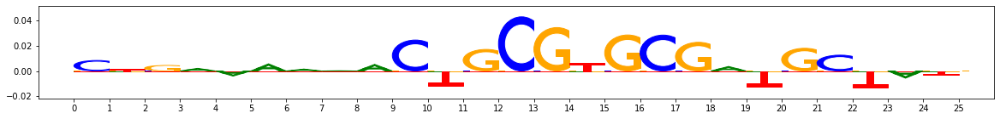

Aligned seqlet


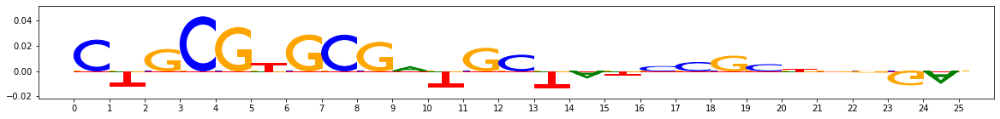

In [13]:
for patternidx,pattern in enumerate(hit_scorer.seqlet_scorer.class_patterns):
    matches = patternidx_to_matches_forpattern0seqlets[patternidx]
    if (len(matches) > 0):
        print("Pattern idx:",patternidx)
        print("Num matches:",len(matches),"out of",len(seqletmatches_pattern0))
        print("Original pattern:")
        viz_sequence.plot_weights(pattern["task0_contrib_scores"].fwd)
        viz_sequence.plot_weights(pattern["sequence"].fwd)
        print("From assigned seqlets:")
        avg_contrib = np.mean([(contrib_scores[match.exampleidx][match.start:match.end][::-1,::-1] if match.is_revcomp
                                else contrib_scores[match.exampleidx][match.start:match.end])
                               for match in matches], axis=0)
        viz_sequence.plot_weights(avg_contrib)
        onehot_seq = np.mean([(onehot_data[match.exampleidx][match.start:match.end][::-1,::-1] if match.is_revcomp
                                else onehot_data[match.exampleidx][match.start:match.end])
                               for match in matches], axis=0)
        viz_sequence.plot_weights(onehot_seq)

        for match in matches[:5]:
            print(match)
            print("Original seqlet:")
            if (match.seqlet_orig_revcomp==False):
                viz_sequence.plot_weights(contrib_scores[match.exampleidx][
                    match.seqlet_orig_start:match.seqlet_orig_end])
            else:
                viz_sequence.plot_weights(contrib_scores[match.exampleidx][
                    match.seqlet_orig_start:match.seqlet_orig_end][::-1,::-1])
            print("Aligned seqlet")
            if (match.is_revcomp==False):
                viz_sequence.plot_weights(contrib_scores[match.exampleidx][match.start:match.end])
            else:
                viz_sequence.plot_weights(contrib_scores[match.exampleidx][match.start:match.end][::-1,::-1])

In [14]:
#Test the seqlet scorer. Let's see what happens to the assignment of seqlets
# from pattern 4

seqletmatches_pattern4,patternidx_to_matches_forpattern4seqlets,_ = hit_scorer.seqlet_scorer(
    hit_scorer.trimmed_subclustered_patterns[4].seqlets)


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:   15.7s
[Parallel(n_jobs=10)]: Done 602 out of 602 | elapsed:   19.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 602 out of 602 | elapsed:    2.2s finished


Constructing csr matrix...
csr matrix made in 0.18044662475585938 s
Batching in slices of size 602


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


Launching nearest neighbors affmat calculation job
MEMORY 4.061986816
Parallel runs completed
MEMORY 4.061986816
Job completed in: 7.06 s
MEMORY 4.061986816
Launching nearest neighbors affmat calculation job
MEMORY 4.061986816
Parallel runs completed
MEMORY 4.074852352
Job completed in: 6.63 s
MEMORY 4.074852352
Removed 1 duplicates


Pattern idx: 0
Num matches: 78 out of 602
Original pattern:


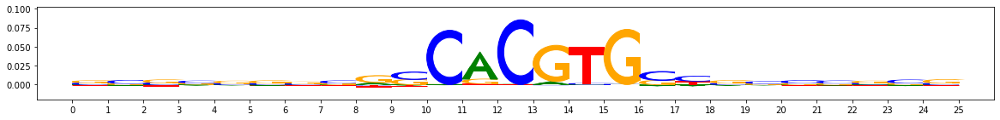

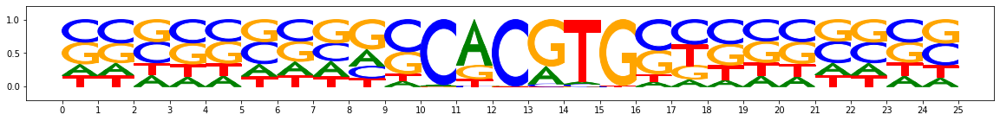

From assigned seqlets:


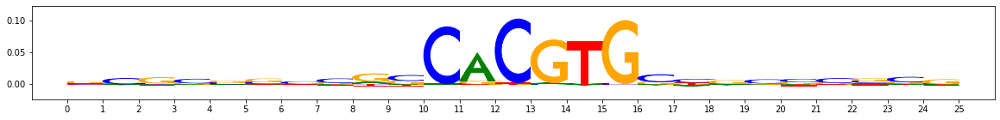

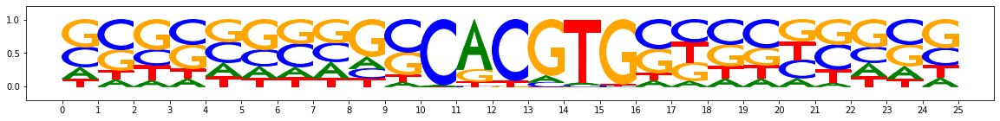

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=15992, start=165, end=190, is_revcomp=True, seqlet_orig_start=173, seqlet_orig_end=198, seqlet_orig_revcomp=True, aggregate_sim=0.4718381379530996, mod_delta=0.00015444639170295727, mod_precision=0.8490028490028491, mod_percentile=0.2697302697302697, fann_perclasssum_perc=0.4055944055944056, fann_perclassavg_perc=0.6563436563436563)
Original seqlet:


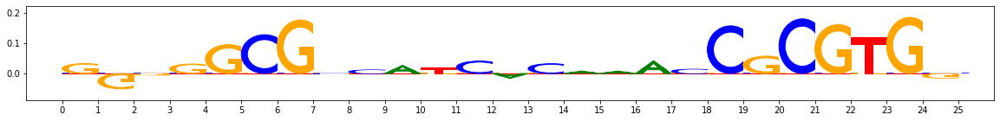

Aligned seqlet


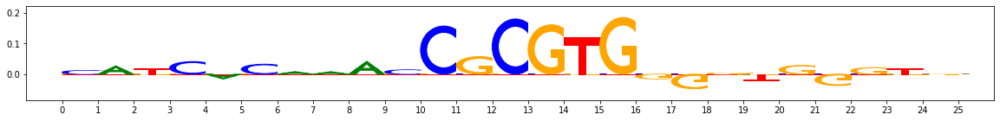

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=8007, start=207, end=232, is_revcomp=False, seqlet_orig_start=199, seqlet_orig_end=224, seqlet_orig_revcomp=False, aggregate_sim=0.41259727850716904, mod_delta=0.0001831071799545349, mod_precision=0.8490028490028491, mod_percentile=0.36363636363636365, fann_perclasssum_perc=0.5084915084915085, fann_perclassavg_perc=0.5754245754245755)
Original seqlet:


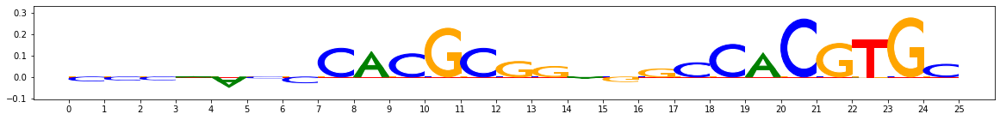

Aligned seqlet


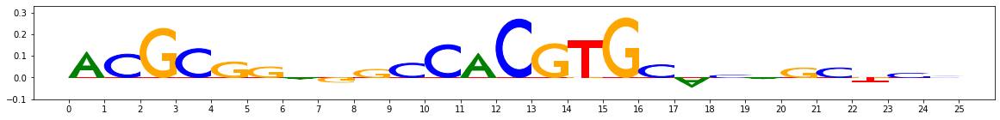

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=9115, start=218, end=243, is_revcomp=True, seqlet_orig_start=226, seqlet_orig_end=251, seqlet_orig_revcomp=True, aggregate_sim=0.5040909950495567, mod_delta=0.000206882110143228, mod_precision=0.8490028490028491, mod_percentile=0.46553446553446554, fann_perclasssum_perc=0.8121878121878122, fann_perclassavg_perc=0.8211788211788211)
Original seqlet:


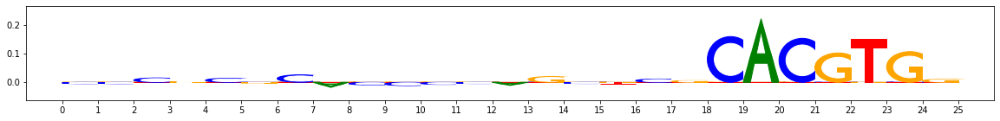

Aligned seqlet


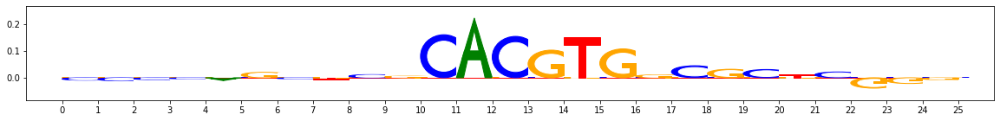

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=9587, start=194, end=219, is_revcomp=True, seqlet_orig_start=202, seqlet_orig_end=227, seqlet_orig_revcomp=True, aggregate_sim=0.5942808793245624, mod_delta=0.00021838203965922966, mod_precision=0.8490028490028491, mod_percentile=0.5394605394605394, fann_perclasssum_perc=0.997002997002997, fann_perclassavg_perc=0.982017982017982)
Original seqlet:


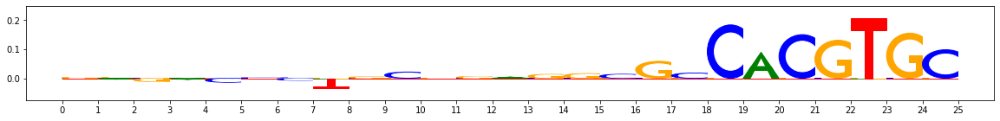

Aligned seqlet


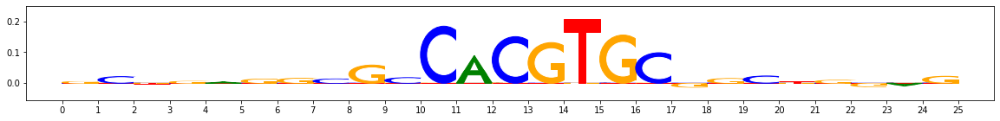

MotifMatch(patternidx=0, patternidx_rank=0, exampleidx=13326, start=198, end=223, is_revcomp=False, seqlet_orig_start=192, seqlet_orig_end=217, seqlet_orig_revcomp=False, aggregate_sim=0.5924654702445721, mod_delta=0.00020532174949693794, mod_precision=0.8490028490028491, mod_percentile=0.4565434565434565, fann_perclasssum_perc=0.9250749250749251, fann_perclassavg_perc=0.9600399600399601)
Original seqlet:


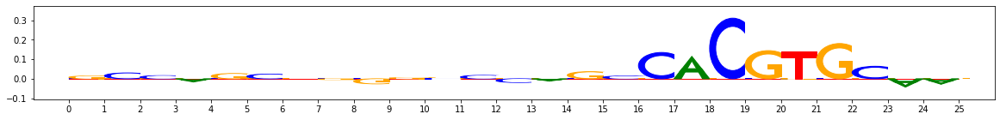

Aligned seqlet


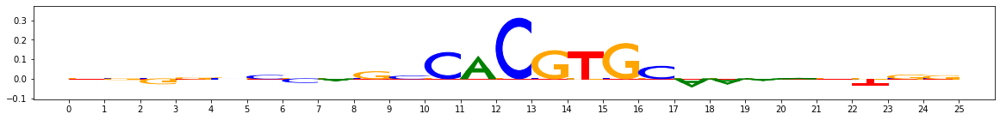

Pattern idx: 1
Num matches: 23 out of 602
Original pattern:


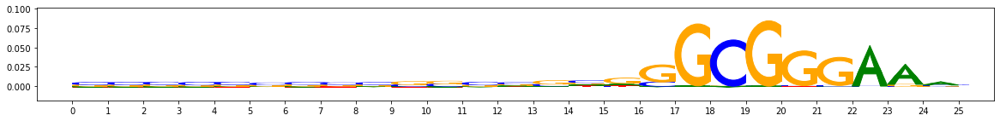

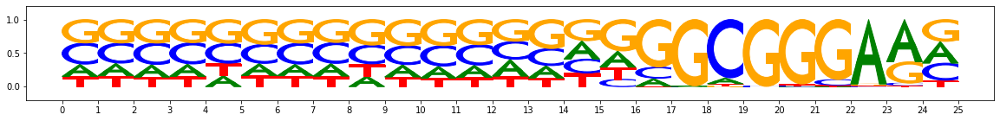

From assigned seqlets:


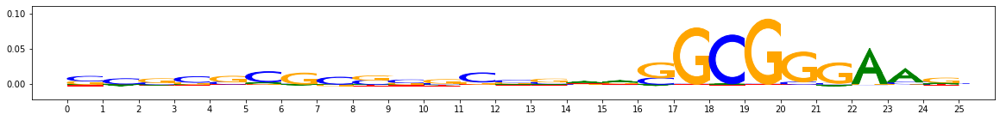

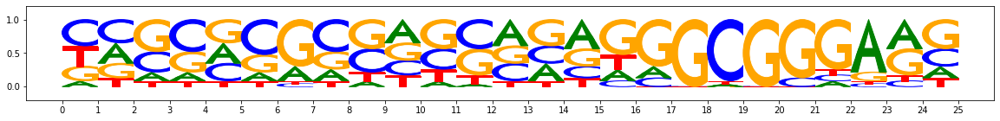

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=15296, start=176, end=201, is_revcomp=True, seqlet_orig_start=172, seqlet_orig_end=197, seqlet_orig_revcomp=False, aggregate_sim=0.4903056961572847, mod_delta=0.0002576833189970768, mod_precision=0.9484536082474226, mod_percentile=0.7305555555555556, fann_perclasssum_perc=0.6680555555555556, fann_perclassavg_perc=0.5888888888888889)
Original seqlet:


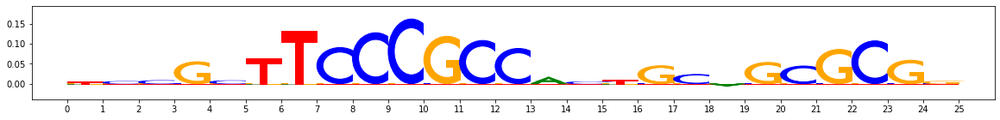

Aligned seqlet


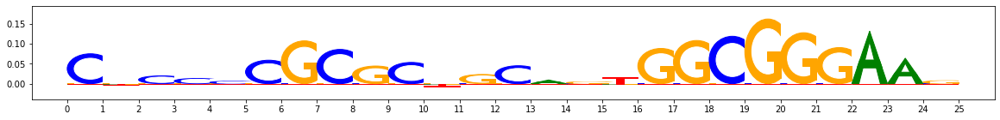

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=6959, start=225, end=250, is_revcomp=True, seqlet_orig_start=210, seqlet_orig_end=235, seqlet_orig_revcomp=False, aggregate_sim=0.19035429515544044, mod_delta=0.00011892719135022945, mod_precision=0.5454545454545454, mod_percentile=0.14583333333333337, fann_perclasssum_perc=0.0625, fann_perclassavg_perc=0.001388888888888884)
Original seqlet:


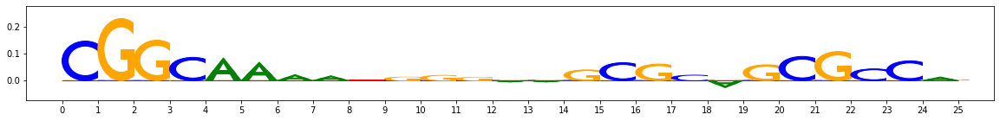

Aligned seqlet


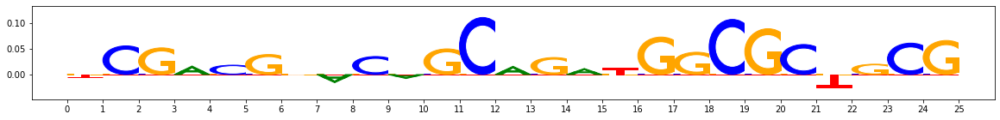

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=6786, start=204, end=229, is_revcomp=True, seqlet_orig_start=197, seqlet_orig_end=222, seqlet_orig_revcomp=True, aggregate_sim=0.381025718166876, mod_delta=9.49545768706383e-05, mod_precision=0.488888888888889, mod_percentile=0.10972222222222228, fann_perclasssum_perc=0.10972222222222228, fann_perclassavg_perc=0.2236111111111111)
Original seqlet:


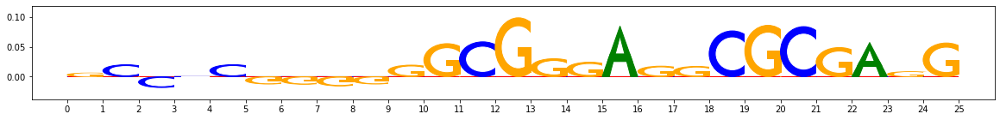

Aligned seqlet


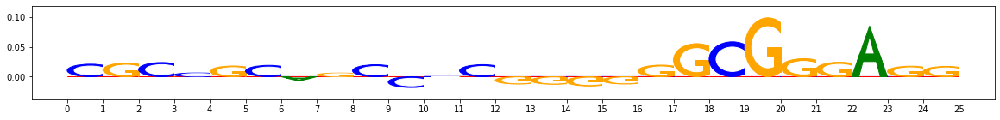

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=3071, start=156, end=181, is_revcomp=False, seqlet_orig_start=162, seqlet_orig_end=187, seqlet_orig_revcomp=True, aggregate_sim=0.34724568398586086, mod_delta=6.998039935002275e-05, mod_precision=0.25, mod_percentile=0.0805555555555556, fann_perclasssum_perc=0.08333333333333337, fann_perclassavg_perc=0.25555555555555554)
Original seqlet:


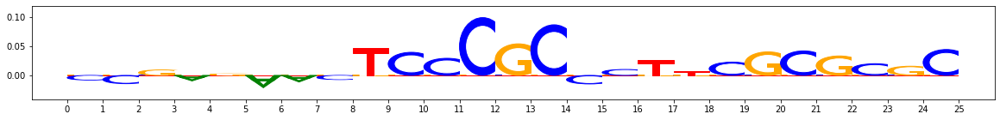

Aligned seqlet


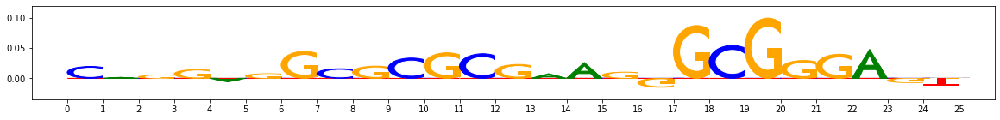

MotifMatch(patternidx=1, patternidx_rank=0, exampleidx=2902, start=205, end=230, is_revcomp=True, seqlet_orig_start=197, seqlet_orig_end=222, seqlet_orig_revcomp=False, aggregate_sim=0.526261795510284, mod_delta=0.00027223734838425595, mod_precision=0.9484536082474226, mod_percentile=0.8625, fann_perclasssum_perc=0.8347222222222223, fann_perclassavg_perc=0.7569444444444444)
Original seqlet:


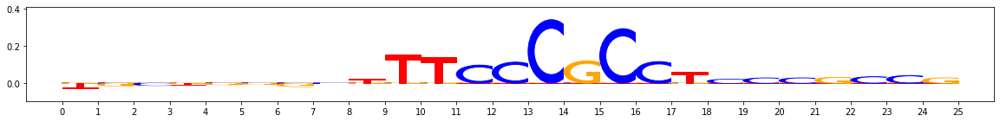

Aligned seqlet


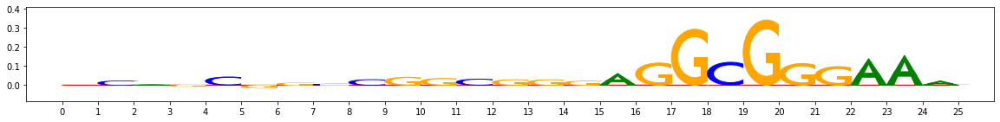

Pattern idx: 2
Num matches: 12 out of 602
Original pattern:


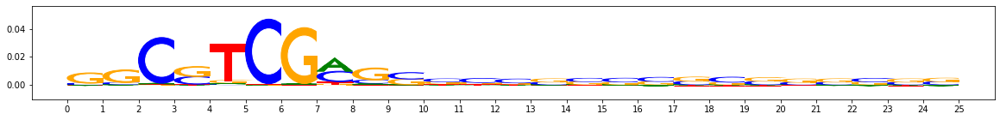

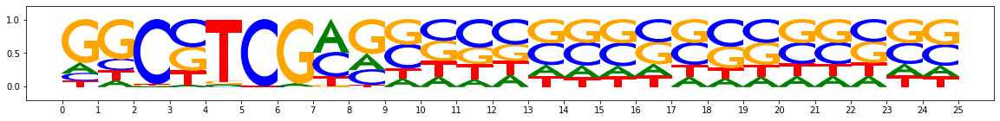

From assigned seqlets:


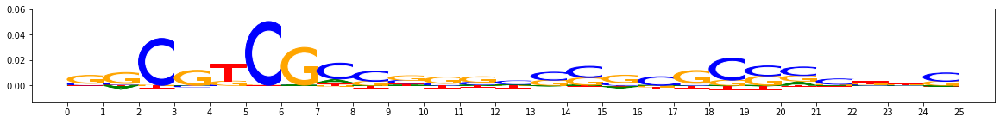

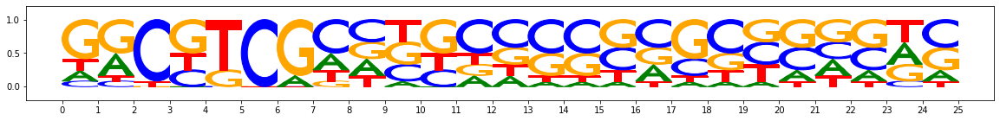

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=3304, start=161, end=186, is_revcomp=False, seqlet_orig_start=163, seqlet_orig_end=188, seqlet_orig_revcomp=True, aggregate_sim=0.2878923368391312, mod_delta=0.00012211538188669979, mod_precision=0.8666666666666667, mod_percentile=0.24931129476584024, fann_perclasssum_perc=0.24517906336088158, fann_perclassavg_perc=0.02203856749311295)
Original seqlet:


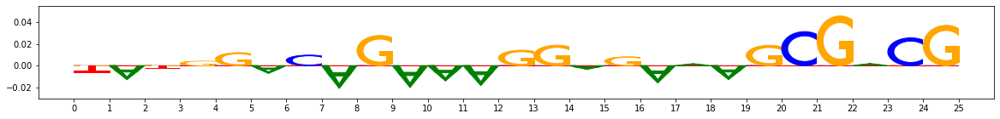

Aligned seqlet


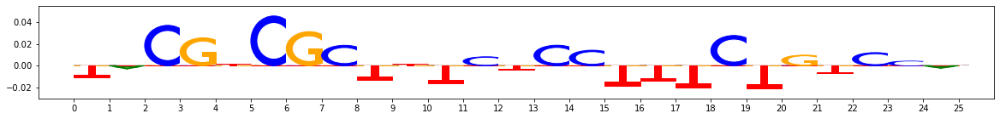

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=13655, start=139, end=164, is_revcomp=False, seqlet_orig_start=126, seqlet_orig_end=151, seqlet_orig_revcomp=False, aggregate_sim=0.34682083437128297, mod_delta=6.324891662078576e-05, mod_precision=0.22950819672131148, mod_percentile=0.1198347107438017, fann_perclasssum_perc=0.1707988980716253, fann_perclassavg_perc=0.2961432506887053)
Original seqlet:


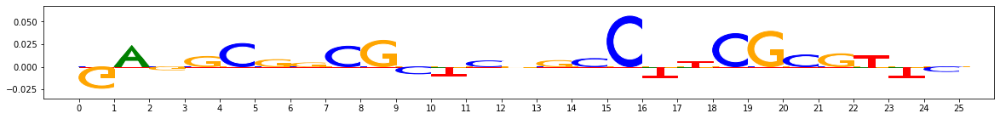

Aligned seqlet


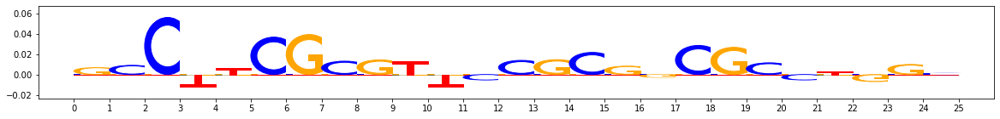

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=10950, start=154, end=179, is_revcomp=False, seqlet_orig_start=139, seqlet_orig_end=164, seqlet_orig_revcomp=False, aggregate_sim=0.3189257992805328, mod_delta=8.643609540129037e-05, mod_precision=0.5172413793103449, mod_percentile=0.16666666666666663, fann_perclasssum_perc=0.21349862258953167, fann_perclassavg_perc=0.2272727272727273)
Original seqlet:


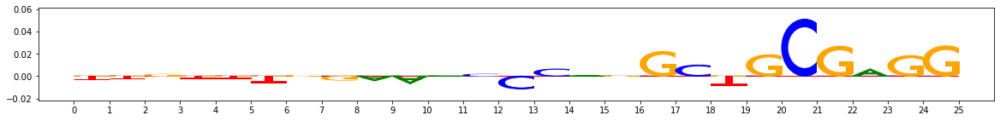

Aligned seqlet


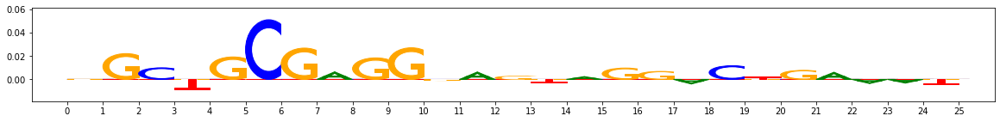

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=452, start=206, end=231, is_revcomp=True, seqlet_orig_start=210, seqlet_orig_end=235, seqlet_orig_revcomp=True, aggregate_sim=0.21559570716346874, mod_delta=5.007998763405809e-05, mod_precision=0.22950819672131148, mod_percentile=0.10881542699724522, fann_perclasssum_perc=0.1267217630853994, fann_perclassavg_perc=0.052341597796143224)
Original seqlet:


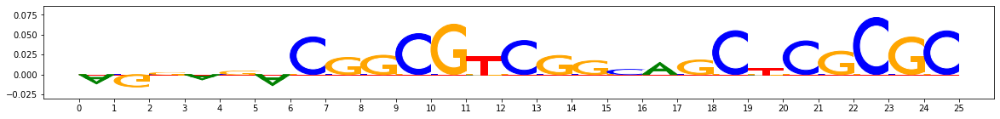

Aligned seqlet


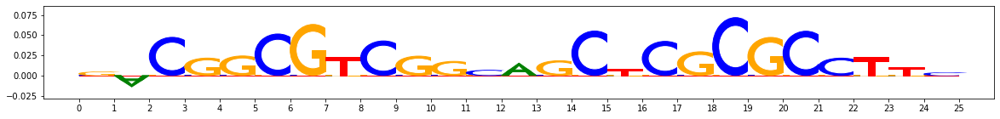

MotifMatch(patternidx=2, patternidx_rank=0, exampleidx=14769, start=189, end=214, is_revcomp=False, seqlet_orig_start=174, seqlet_orig_end=199, seqlet_orig_revcomp=False, aggregate_sim=0.3588702852034691, mod_delta=0.00011231675215812323, mod_precision=0.6842105263157895, mod_percentile=0.22038567493112948, fann_perclasssum_perc=0.2672176308539945, fann_perclassavg_perc=0.27548209366391185)
Original seqlet:


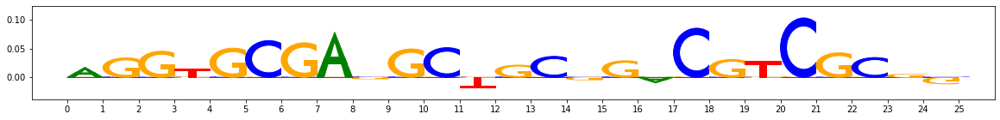

Aligned seqlet


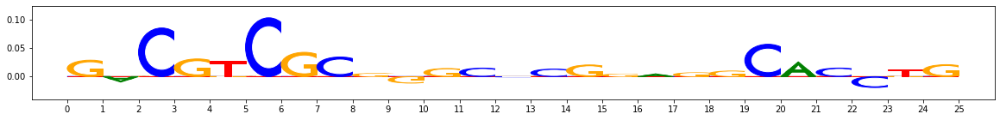

Pattern idx: 3
Num matches: 56 out of 602
Original pattern:


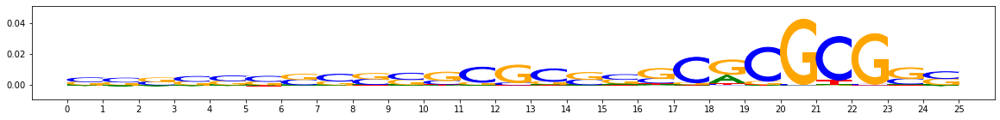

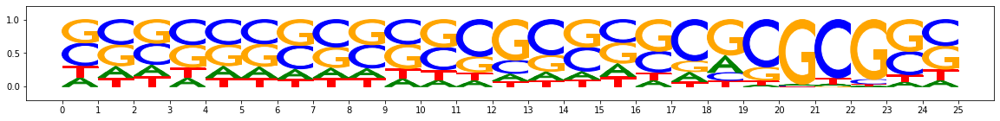

From assigned seqlets:


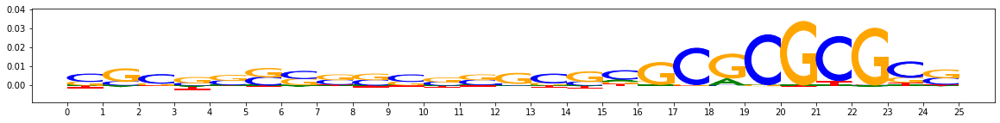

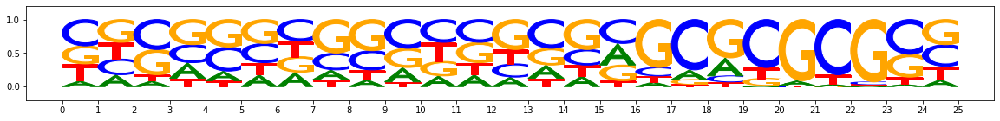

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=14266, start=190, end=215, is_revcomp=True, seqlet_orig_start=191, seqlet_orig_end=216, seqlet_orig_revcomp=True, aggregate_sim=0.29479405106015805, mod_delta=6.133179558182707e-05, mod_precision=0.34574468085106386, mod_percentile=0.48142857142857143, fann_perclasssum_perc=0.51, fann_perclassavg_perc=0.42714285714285716)
Original seqlet:


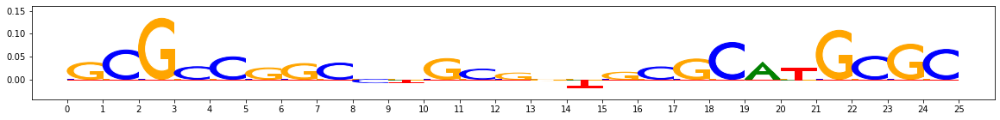

Aligned seqlet


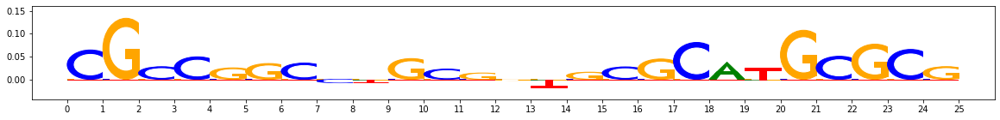

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=16337, start=196, end=221, is_revcomp=False, seqlet_orig_start=195, seqlet_orig_end=220, seqlet_orig_revcomp=False, aggregate_sim=0.4048877072576295, mod_delta=7.101202625042283e-05, mod_precision=0.46908092268123364, mod_percentile=0.5585714285714285, fann_perclasssum_perc=0.7685714285714286, fann_perclassavg_perc=0.8942857142857142)
Original seqlet:


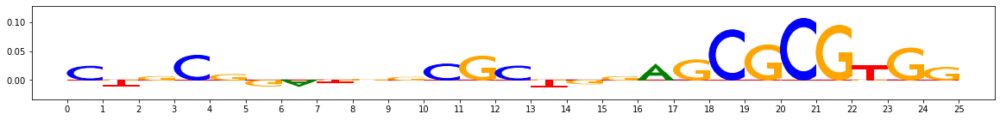

Aligned seqlet


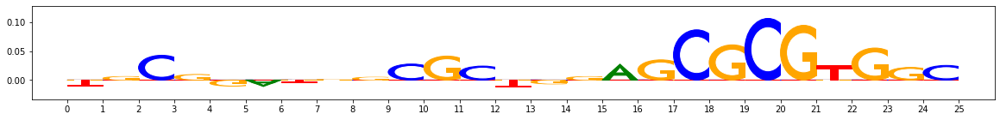

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=1698, start=183, end=208, is_revcomp=True, seqlet_orig_start=184, seqlet_orig_end=209, seqlet_orig_revcomp=True, aggregate_sim=0.3105617363643814, mod_delta=6.672041817886869e-05, mod_precision=0.449438202247191, mod_percentile=0.5228571428571429, fann_perclasssum_perc=0.5671428571428572, fann_perclassavg_perc=0.4085714285714286)
Original seqlet:


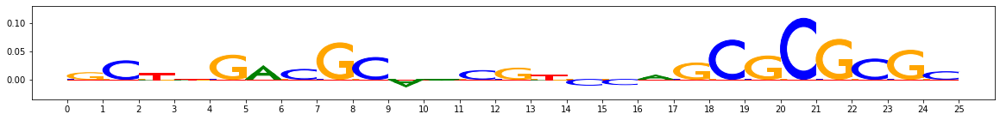

Aligned seqlet


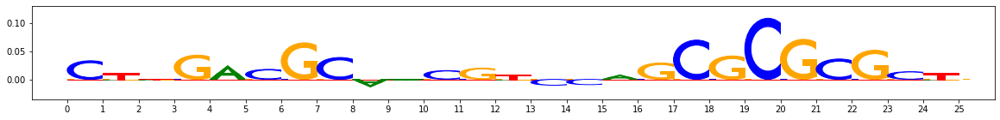

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=13341, start=189, end=214, is_revcomp=True, seqlet_orig_start=190, seqlet_orig_end=215, seqlet_orig_revcomp=True, aggregate_sim=0.30732005800209433, mod_delta=5.495833495053266e-05, mod_precision=0.34574468085106386, mod_percentile=0.43999999999999995, fann_perclasssum_perc=0.43999999999999995, fann_perclassavg_perc=0.3928571428571429)
Original seqlet:


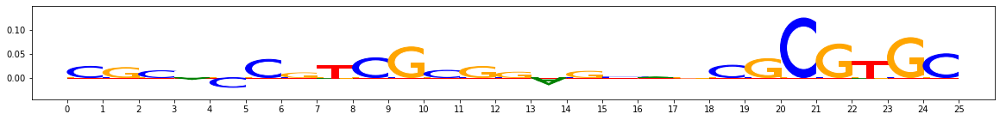

Aligned seqlet


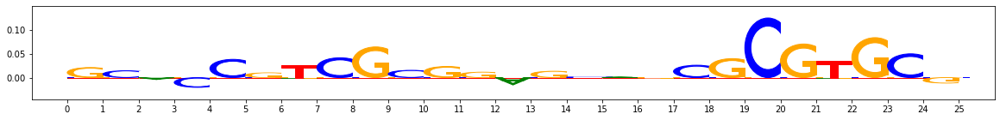

MotifMatch(patternidx=3, patternidx_rank=0, exampleidx=14092, start=155, end=180, is_revcomp=True, seqlet_orig_start=156, seqlet_orig_end=181, seqlet_orig_revcomp=True, aggregate_sim=0.2903271741278728, mod_delta=0.00010640584381852297, mod_precision=0.6451612903225806, mod_percentile=0.8714285714285714, fann_perclasssum_perc=0.7314285714285714, fann_perclassavg_perc=0.07285714285714284)
Original seqlet:


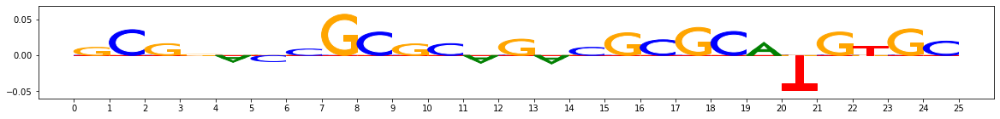

Aligned seqlet


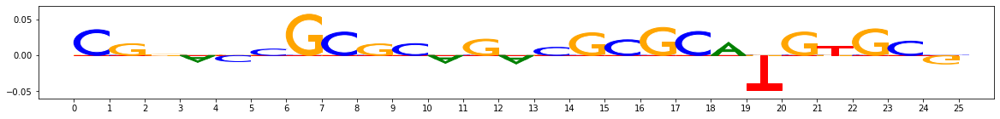

Pattern idx: 4
Num matches: 401 out of 602
Original pattern:


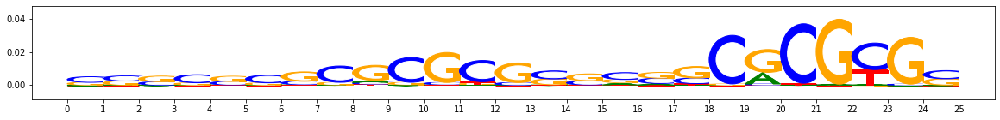

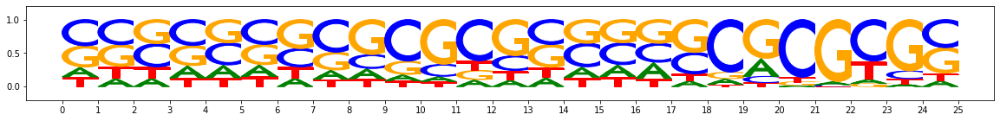

From assigned seqlets:


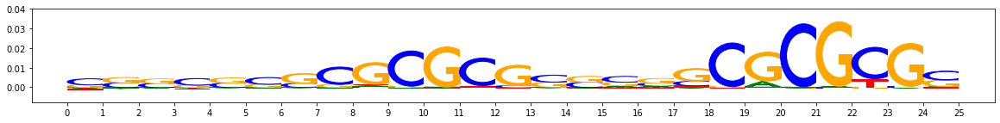

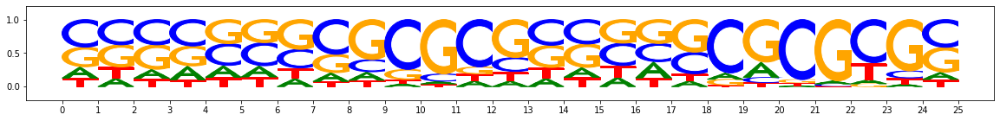

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=8281, start=149, end=174, is_revcomp=False, seqlet_orig_start=155, seqlet_orig_end=180, seqlet_orig_revcomp=True, aggregate_sim=0.3852383483119612, mod_delta=6.006348309778479e-05, mod_precision=0.3291139240506329, mod_percentile=0.3759259259259259, fann_perclasssum_perc=0.4388888888888889, fann_perclassavg_perc=0.6833333333333333)
Original seqlet:


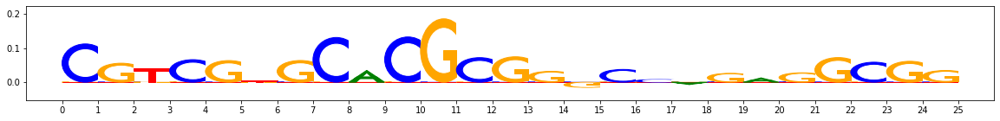

Aligned seqlet


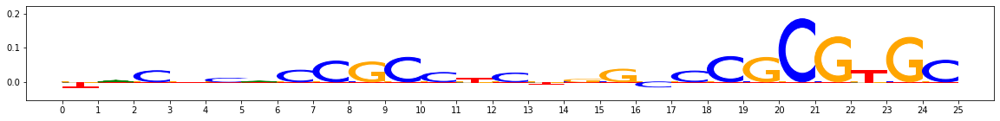

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=3811, start=194, end=219, is_revcomp=True, seqlet_orig_start=186, seqlet_orig_end=211, seqlet_orig_revcomp=False, aggregate_sim=0.28991508609145816, mod_delta=8.68749251699965e-05, mod_precision=0.6, mod_percentile=0.5425925925925925, fann_perclasssum_perc=0.537037037037037, fann_perclassavg_perc=0.22777777777777775)
Original seqlet:


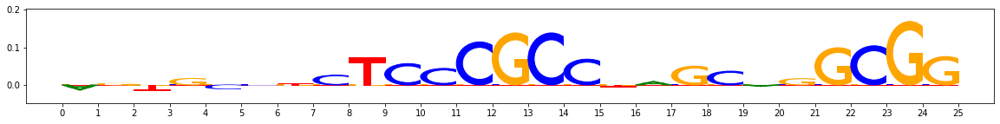

Aligned seqlet


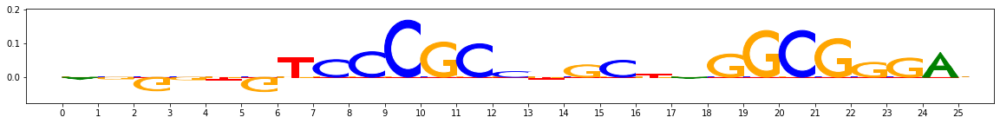

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=995, start=138, end=163, is_revcomp=True, seqlet_orig_start=138, seqlet_orig_end=163, seqlet_orig_revcomp=True, aggregate_sim=0.45525083246403736, mod_delta=8.679690605245588e-05, mod_precision=0.6, mod_percentile=0.5407407407407407, fann_perclasssum_perc=0.6666666666666667, fann_perclassavg_perc=0.8685185185185185)
Original seqlet:


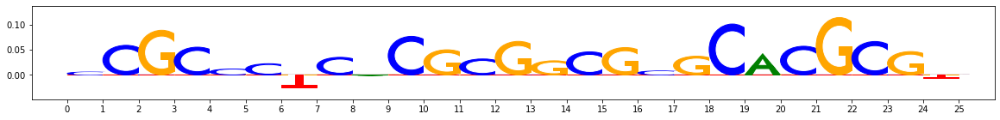

Aligned seqlet


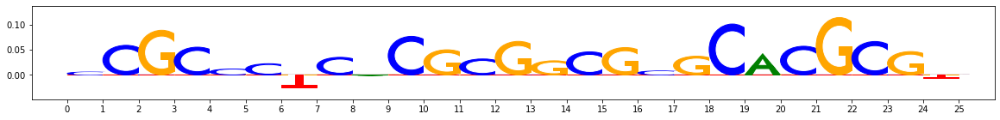

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=8309, start=198, end=223, is_revcomp=True, seqlet_orig_start=192, seqlet_orig_end=217, seqlet_orig_revcomp=False, aggregate_sim=0.33722333987063824, mod_delta=0.00010093889848615508, mod_precision=0.6818181818181818, mod_percentile=0.6814814814814815, fann_perclasssum_perc=0.6981481481481482, fann_perclassavg_perc=0.6055555555555556)
Original seqlet:


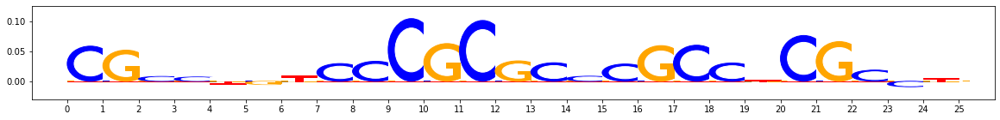

Aligned seqlet


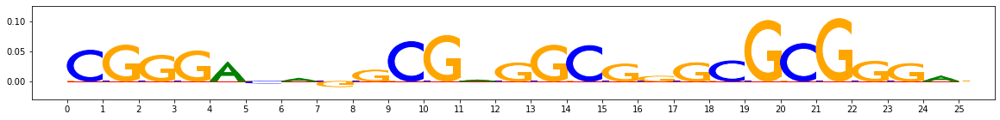

MotifMatch(patternidx=4, patternidx_rank=0, exampleidx=15227, start=202, end=227, is_revcomp=True, seqlet_orig_start=202, seqlet_orig_end=227, seqlet_orig_revcomp=True, aggregate_sim=0.4775896885404444, mod_delta=0.00012193383961951863, mod_precision=0.726027397260274, mod_percentile=0.8351851851851853, fann_perclasssum_perc=0.95, fann_perclassavg_perc=0.9092592592592592)
Original seqlet:


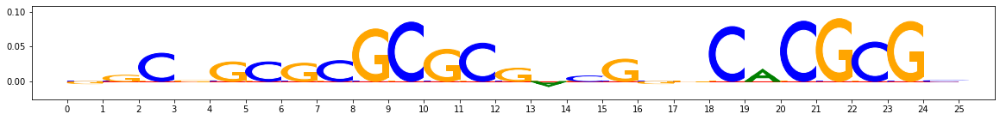

Aligned seqlet


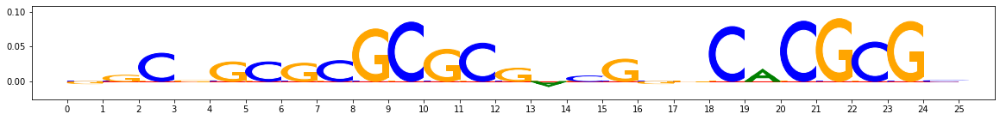

Pattern idx: 5
Num matches: 26 out of 602
Original pattern:


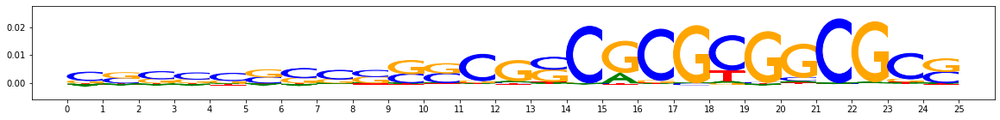

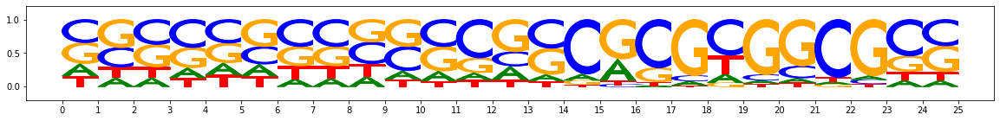

From assigned seqlets:


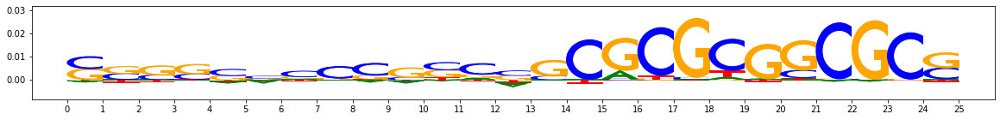

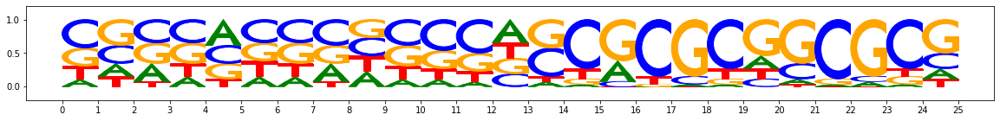

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=3696, start=141, end=166, is_revcomp=True, seqlet_orig_start=128, seqlet_orig_end=153, seqlet_orig_revcomp=False, aggregate_sim=0.3124319514286637, mod_delta=4.440752056991442e-05, mod_precision=0.3037037037037037, mod_percentile=0.37573964497041423, fann_perclasssum_perc=0.23668639053254437, fann_perclassavg_perc=0.3224852071005917)
Original seqlet:


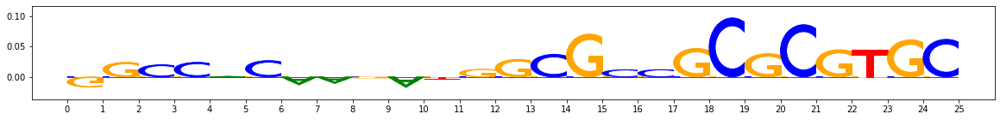

Aligned seqlet


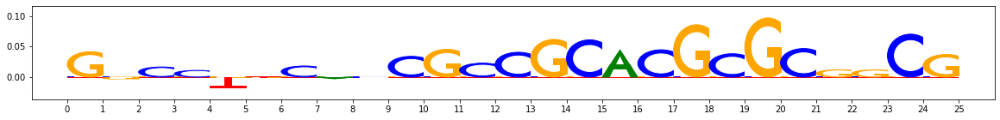

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=10540, start=176, end=201, is_revcomp=True, seqlet_orig_start=163, seqlet_orig_end=188, seqlet_orig_revcomp=False, aggregate_sim=0.32942754459741225, mod_delta=9.296956499919386e-05, mod_precision=0.7647058823529411, mod_percentile=0.8757396449704142, fann_perclasssum_perc=0.7781065088757396, fann_perclassavg_perc=0.242603550295858)
Original seqlet:


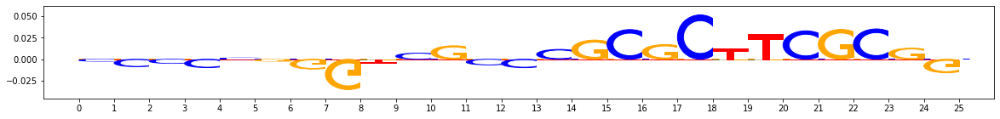

Aligned seqlet


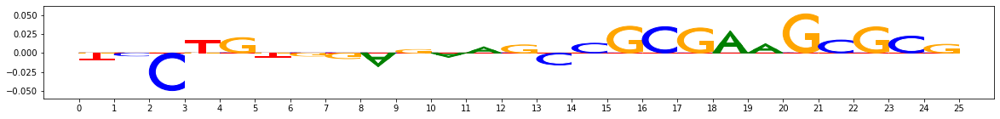

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=8743, start=173, end=198, is_revcomp=True, seqlet_orig_start=160, seqlet_orig_end=185, seqlet_orig_revcomp=False, aggregate_sim=0.39788167644836253, mod_delta=5.3387890610140536e-05, mod_precision=0.3557692307692308, mod_percentile=0.48816568047337283, fann_perclasssum_perc=0.45857988165680474, fann_perclassavg_perc=0.849112426035503)
Original seqlet:


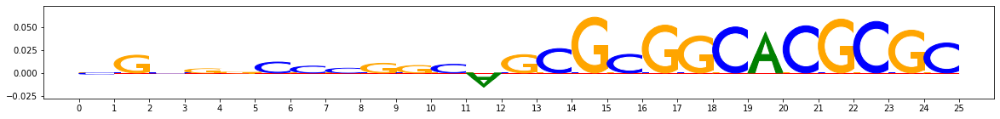

Aligned seqlet


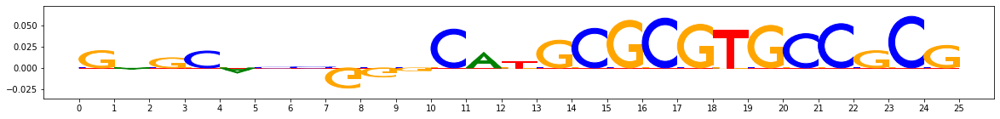

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=14873, start=209, end=234, is_revcomp=True, seqlet_orig_start=196, seqlet_orig_end=221, seqlet_orig_revcomp=False, aggregate_sim=0.3269949446288812, mod_delta=6.16594696803754e-05, mod_precision=0.4251968503937008, mod_percentile=0.5591715976331362, fann_perclasssum_perc=0.4556213017751479, fann_perclassavg_perc=0.050295857988165715)
Original seqlet:


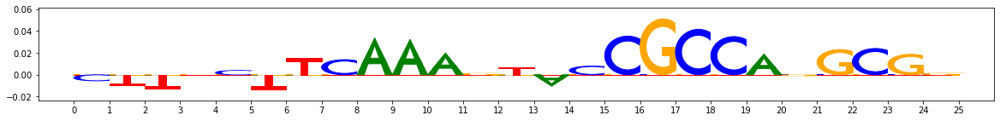

Aligned seqlet


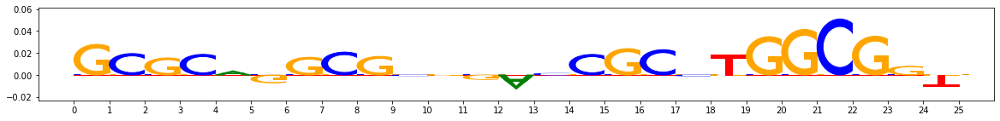

MotifMatch(patternidx=5, patternidx_rank=0, exampleidx=2685, start=208, end=233, is_revcomp=True, seqlet_orig_start=207, seqlet_orig_end=232, seqlet_orig_revcomp=True, aggregate_sim=0.30990150670978506, mod_delta=7.216939443965084e-05, mod_precision=0.4251968503937008, mod_percentile=0.650887573964497, fann_perclasssum_perc=0.5177514792899408, fann_perclassavg_perc=0.056213017751479244)
Original seqlet:


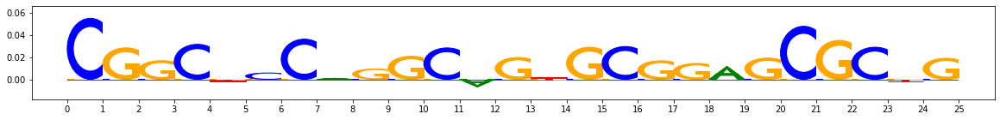

Aligned seqlet


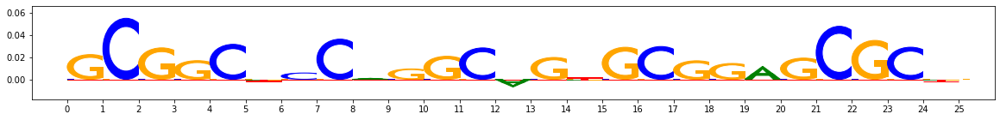

Pattern idx: 6
Num matches: 5 out of 602
Original pattern:


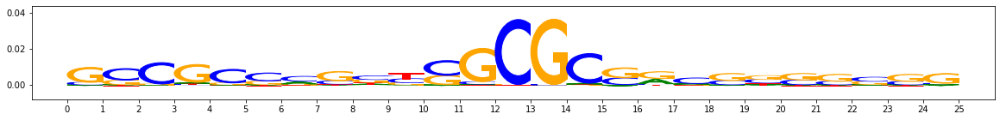

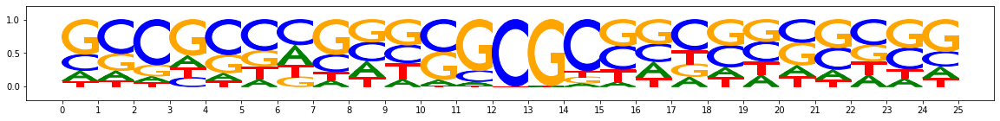

From assigned seqlets:


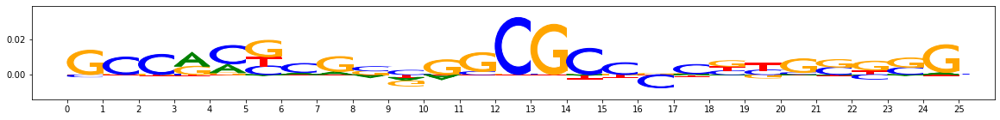

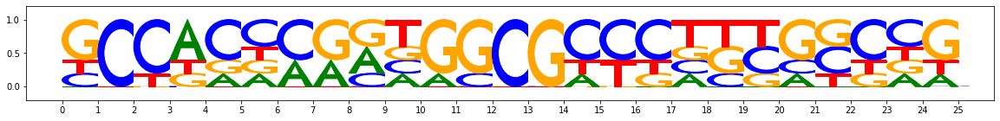

MotifMatch(patternidx=6, patternidx_rank=0, exampleidx=4594, start=144, end=169, is_revcomp=False, seqlet_orig_start=136, seqlet_orig_end=161, seqlet_orig_revcomp=False, aggregate_sim=0.19703261890153878, mod_delta=2.9788616209797398e-05, mod_precision=0.22534344278715085, mod_percentile=0.35691318327974275, fann_perclasssum_perc=0.1511254019292605, fann_perclassavg_perc=0.0)
Original seqlet:


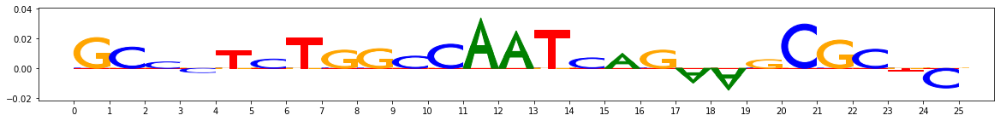

Aligned seqlet


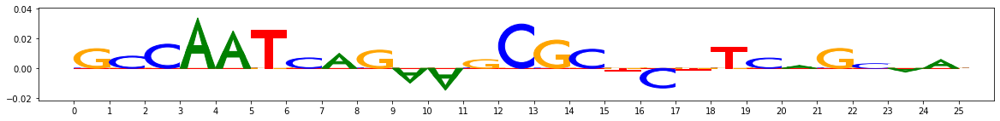

MotifMatch(patternidx=6, patternidx_rank=0, exampleidx=10342, start=165, end=190, is_revcomp=True, seqlet_orig_start=164, seqlet_orig_end=189, seqlet_orig_revcomp=True, aggregate_sim=0.29302300828999306, mod_delta=3.443140233586995e-05, mod_precision=0.22784810126582278, mod_percentile=0.4501607717041801, fann_perclasssum_perc=0.4565916398713826, fann_perclassavg_perc=0.12218649517684887)
Original seqlet:


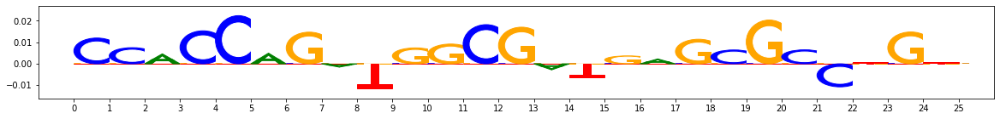

Aligned seqlet


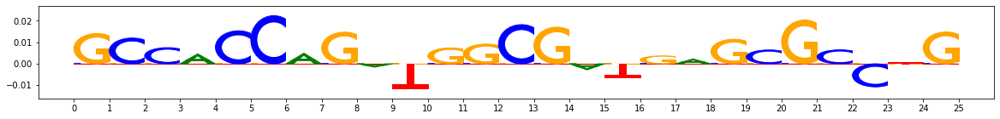

MotifMatch(patternidx=6, patternidx_rank=0, exampleidx=15260, start=259, end=284, is_revcomp=False, seqlet_orig_start=253, seqlet_orig_end=278, seqlet_orig_revcomp=True, aggregate_sim=0.3325346293807221, mod_delta=5.028367040212125e-05, mod_precision=0.40540540540540543, mod_percentile=0.6784565916398714, fann_perclasssum_perc=0.6816720257234727, fann_perclassavg_perc=0.16398713826366562)
Original seqlet:


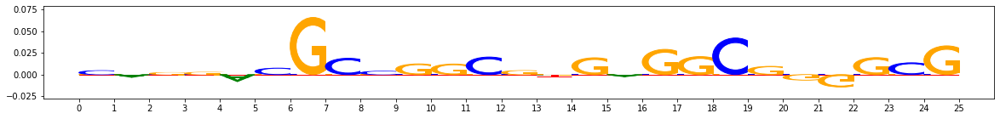

Aligned seqlet


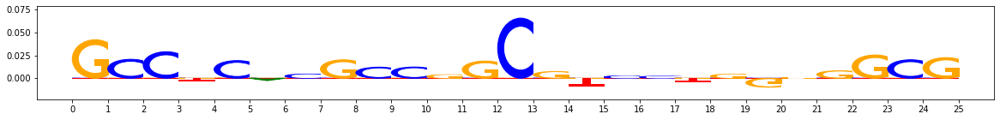

MotifMatch(patternidx=6, patternidx_rank=0, exampleidx=11170, start=186, end=211, is_revcomp=False, seqlet_orig_start=178, seqlet_orig_end=203, seqlet_orig_revcomp=False, aggregate_sim=0.3099417054247104, mod_delta=7.34505788298721e-05, mod_precision=0.6153846153846154, mod_percentile=0.954983922829582, fann_perclasssum_perc=0.9163987138263665, fann_perclassavg_perc=0.1061093247588425)
Original seqlet:


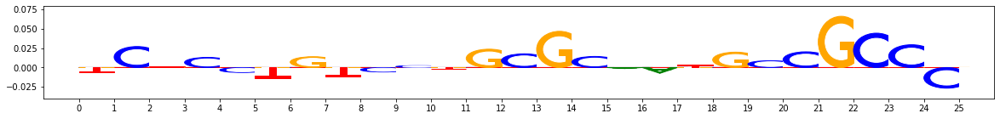

Aligned seqlet


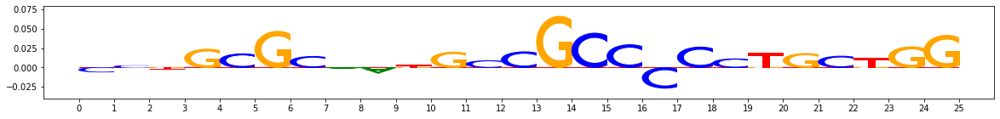

MotifMatch(patternidx=6, patternidx_rank=0, exampleidx=14049, start=205, end=230, is_revcomp=False, seqlet_orig_start=197, seqlet_orig_end=222, seqlet_orig_revcomp=False, aggregate_sim=0.3876935708451932, mod_delta=5.36610334352735e-05, mod_precision=0.48, mod_percentile=0.7331189710610932, fann_perclasssum_perc=0.8745980707395499, fann_perclassavg_perc=0.7556270096463023)
Original seqlet:


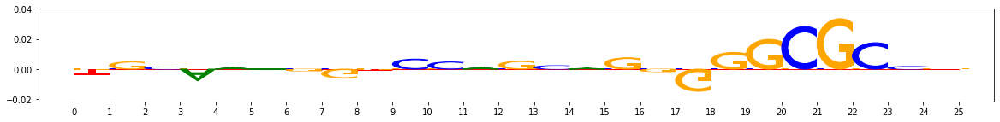

Aligned seqlet


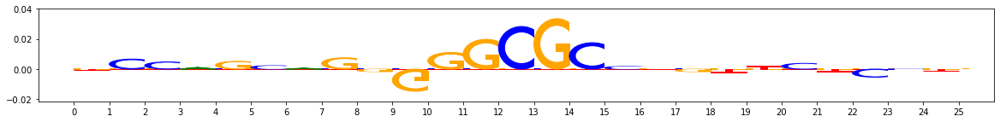

In [15]:
for patternidx,pattern in enumerate(hit_scorer.seqlet_scorer.class_patterns):
    matches = patternidx_to_matches_forpattern4seqlets[patternidx]
    if (len(matches) > 0):
        print("Pattern idx:",patternidx)
        print("Num matches:",len(matches),"out of",len(seqletmatches_pattern4))
        print("Original pattern:")
        viz_sequence.plot_weights(pattern["task0_contrib_scores"].fwd)
        viz_sequence.plot_weights(pattern["sequence"].fwd)
        print("From assigned seqlets:")
        avg_contrib = np.mean([(contrib_scores[match.exampleidx][match.start:match.end][::-1,::-1] if match.is_revcomp
                                else contrib_scores[match.exampleidx][match.start:match.end])
                               for match in matches], axis=0)
        viz_sequence.plot_weights(avg_contrib)
        onehot_seq = np.mean([(onehot_data[match.exampleidx][match.start:match.end][::-1,::-1] if match.is_revcomp
                                else onehot_data[match.exampleidx][match.start:match.end])
                               for match in matches], axis=0)
        viz_sequence.plot_weights(onehot_seq)

        for match in matches[:5]:
            print(match)
            print("Original seqlet:")
            if (match.seqlet_orig_revcomp==False):
                viz_sequence.plot_weights(contrib_scores[match.exampleidx][
                    match.seqlet_orig_start:match.seqlet_orig_end])
            else:
                viz_sequence.plot_weights(contrib_scores[match.exampleidx][
                    match.seqlet_orig_start:match.seqlet_orig_end][::-1,::-1])
            print("Aligned seqlet")
            if (match.is_revcomp==False):
                viz_sequence.plot_weights(contrib_scores[match.exampleidx][match.start:match.end])
            else:
                viz_sequence.plot_weights(contrib_scores[match.exampleidx][match.start:match.end][::-1,::-1])

In [16]:
%cd /users/avanti/tfmodisco
!git log -1

/mnt/lab_data2/avanti/tfmodisco
commit cd0accce9330a55a36a72adc1aa242bd0b6b56bc (HEAD -> hitscoring, origin/hitscoring)
Author: Av Shrikumar <avanti.shrikumar@gmail.com>
Date:   Wed Apr 28 17:27:26 2021 -0700

    add seqlet orig revcomp
